#Dependencies

##Instaling deepxde

In [ ]:
!pip install deepxde

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 8.8 MB/s eta 0:00:00


##Importing deepxde and needed libraries

In [ ]:
import deepxde as dde
import numpy as np

No backend selected.
Finding available backend...


Using backend: tensorflow.compat.v1
Other supported backends: tensorflow, pytorch, jax, paddle.
paddle supports more examples now and is recommended.
Instructions for updating:
non-resource variables are not supported in the long term


Found tensorflow.compat.v1
Setting the default backend to "tensorflow.compat.v1". You can change it in the ~/.deepxde/config.json file or export the DDE_BACKEND environment variable. Valid options are: tensorflow.compat.v1, tensorflow, pytorch, jax, paddle (all lowercase)


##Custom functions

In [ ]:
    def make_X(A,B):
        A = A* np.ones([256,1])
        B = B*np.ones([256,1])
        t = np.linspace(0,1.58,256)
        t= np.vstack(t)
        X = np.concatenate((A, B, t), axis=1)
        return X


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
#Change plots dpi:

plt.rcParams['figure.dpi'] = 200

In [ ]:



def plot_results(X):

    plt.style.use('_mpl-gallery')

    # make data
    A=X[0:1]
    B=X[1:2]
    X=make_X(A,B)
    t = X[:,2:3]
    x = np.hstack(t)

    y_true=func(X)
    y_pred= model.predict(X)

    y_true = np.hstack(y_true)
    y_pred = np.hstack(y_pred)

    # plot
    fig, ax = plt.subplots()

    ax.plot(x, y_true, linewidth=2.0,color = 'b', label='Exact')
    ax.plot(x, y_pred, linestyle = 'dashed', linewidth=2.0, color='r', label='Prediction')
    ax.set(xlim=(0, 1.6), xticks=np.arange(0, 1.6, step=0.2),
        ylim=(0, 1.2), yticks=np.arange(0, 1.2, step=0.2))
    ax.set_title('Variables coefficients')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y(x)$')
    ax.legend()
    print("A: ", A, "B: ",B, "L2: ", np.linalg.norm(model.predict(X) - func(X), ord=2), "\n")

    plt.show()

##g_drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Original

Compiling model...
Building feed-forward neural network...
'build' took 0.070633 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.696099 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [4.03e+00, 7.19e-02, 1.79e+01]    [4.00e+00, 7.19e-02, 1.79e+01]    [1.06e+00]    
1000      [9.86e-04, 7.25e-09, 9.27e-07]    [6.77e-04, 7.25e-09, 9.27e-07]    [6.42e-04]    
2000      [1.94e-04, 7.84e-09, 1.36e-08]    [1.70e-04, 7.84e-09, 1.36e-08]    [1.04e-03]    
3000      [7.78e-05, 4.56e-08, 1.27e-08]    [6.70e-05, 4.56e-08, 1.27e-08]    [7.39e-04]    
4000      [6.66e-05, 1.29e-03, 5.26e-04]    [6.44e-05, 1.29e-03, 5.26e-04]    [1.18e-02]    
5000      [1.63e-05, 2.42e-09, 3.37e-10]    [1.33e-05, 2.42e-09, 3.37e-10]    [3.58e-04]    
6000      [1.12e-05, 9.17e-10, 7.65e-10]    [1.02e-05, 9.17e-10, 7.65e-10]    [3.22e-04]    
7000      [9.84e-06, 4.27e-10, 3.46e-10]    [1.04e-05, 4.27e-10, 3.46e-10]    [3.45e-04]    
8000      [1.02e-05, 4.99e-08, 3.33e-08]    [1.18e-05, 4.99e-08, 3.33e-08]    [3.78e-04]    
9000      [4.87e-05, 9.4

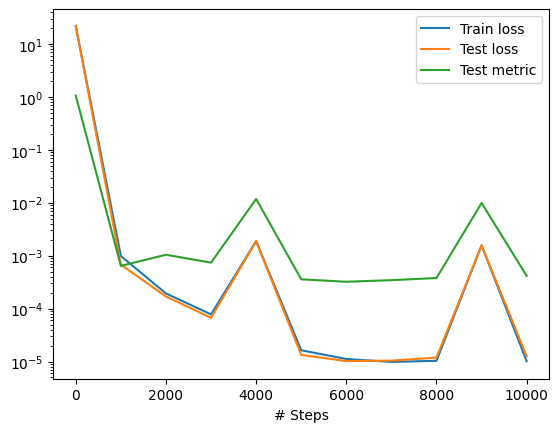

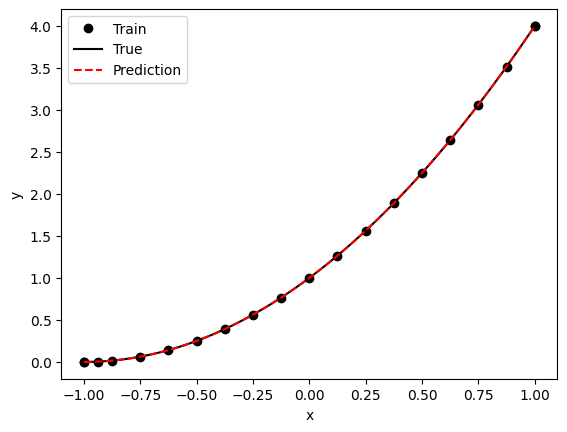

In [ ]:
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np



def pde(x, y):
    dy_xx = dde.grad.hessian(y, x)
    return dy_xx - 2


def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], -1)


def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    return (x + 1) ** 2


geom = dde.geometry.Interval(-1, 1)
bc_l = dde.icbc.DirichletBC(geom, func, boundary_l)
bc_r = dde.icbc.NeumannBC(geom, lambda X: 2 * (X + 1), boundary_r)
data = dde.data.PDE(geom, pde, [bc_l, bc_r], 16, 2, solution=func, num_test=100)

layer_size = [1] + [50] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
losshistory, train_state = model.train(iterations=10000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

#Modificado

No backend selected.
Finding available backend...


Using backend: tensorflow.compat.v1
Other supported backends: tensorflow, pytorch, jax, paddle.
paddle supports more examples now and is recommended.
Instructions for updating:
non-resource variables are not supported in the long term


Found tensorflow.compat.v1
Setting the default backend to "tensorflow.compat.v1". You can change it in the ~/.deepxde/config.json file or export the DDE_BACKEND environment variable. Valid options are: tensorflow.compat.v1, tensorflow, pytorch, jax, paddle (all lowercase)


Compiling model...
Building feed-forward neural network...
'build' took 0.132557 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.198099 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [1.25e-02, 1.00e+00, 6.33e-02]    [1.25e-02, 1.00e+00, 6.33e-02]    [1.18e+00]    
1000      [1.08e-04, 1.59e-08, 4.18e-08]    [8.44e-05, 1.59e-08, 4.18e-08]    [5.48e-04]    
2000      [6.43e-05, 2.22e-07, 1.73e-05]    [5.38e-05, 2.22e-07, 1.73e-05]    [4.49e-03]    
3000      [4.01e-05, 2.07e-09, 4.26e-09]    [3.02e-05, 2.07e-09, 4.26e-09]    [1.76e-04]    
4000      [2.49e-05, 2.33e-10, 3.75e-08]    [1.88e-05, 2.33e-10, 3.75e-08]    [1.21e-04]    
5000      [1.53e-05, 3.13e-10, 1.30e-09]    [1.15e-05, 3.13e-10, 1.30e-09]    [1.34e-04]    
6000      [8.67e-06, 1.11e-10, 6.64e-10]    [6.53e-06, 1.11e-10, 6.64e-10]    [1.09e-04]    
7000      [8.69e-05, 5.10e-06, 4.66e-04]    [9.52e-05, 5.10e-06, 4.66e-04]    [2.52e-02]    
8000      [1.71e-06, 1.77e-07, 6.31e-07]    [1.52e-06, 1.77e-07, 6.31e-07]    [1.27e-03]    
9000      [2.04e-06, 6.9

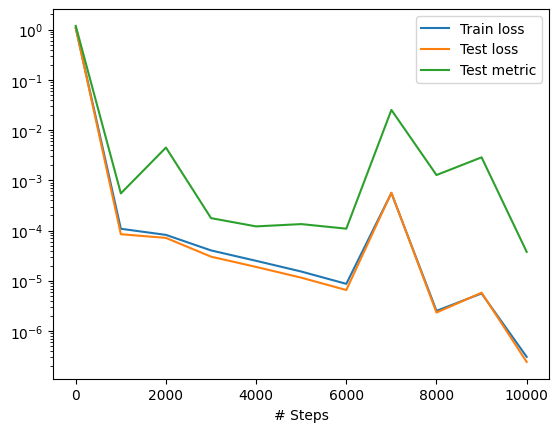

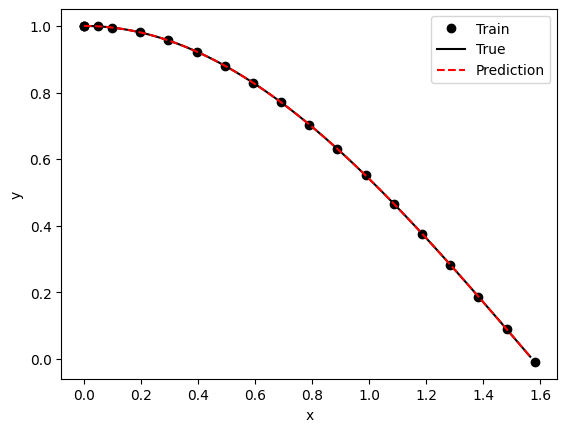

In [ ]:
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x)
    dy_x = dde.grad.jacobian(y, x)
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1.58)


def func(x):
    return np.cos(x)


geom = dde.geometry.Interval(0, 1.58)
#condição de contorno "inicial"
bc_l = dde.icbc.DirichletBC(geom, func, boundary_l)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geom, lambda X: 0, boundary_l)
data = dde.data.PDE(geom, pde, [bc_l, bcd_l], 16, 2, solution=func, num_test=100)

layer_size = [1] + [50] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
losshistory, train_state = model.train(iterations=10000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

#Modificado com 3 coordenadas (2 espaciais, uma temporal)

In [ ]:


"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

#A,B = 0,1

def pde(x, y):

    dy_t = dde.grad.jacobian(y, x, i=0, j=0)
    dy_tt = dde.grad.hessian(y, x, i=0, j=0)
    #dy_tt = dde.grad.hessian(y, t)

    A, B, t = x[:,0:1], x[:,1:2], x[:,2:3]
    return dy_tt + A * dy_t + B * y

#geom = dde.geometry.Rectangle([0, 0], [1, 1])
geom = dde.geometry.Cuboid([0,0,0],[1,1,1])
timedomain = dde.geometry.TimeDomain(0, 1.58)
geomtime = dde.geometry.GeometryXTime(geom, timedomain)

def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[2], 1.58)


def func(x):
    return np.cos(x[:,2:3])


#geom = dde.geometry.Interval(0, 1.58)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geom, func, boundary_l)
#condição de contorno "inicial" da derivada
#bcd_l = dde.icbc.NeumannBC(geom, lambda X: 0, boundary_l)
ic_1 = dde.icbc.IC(geomtime, func, lambda _, on_initial: on_initial)
ic_2 = dde.icbc.OperatorBC(
    geomtime,
    lambda x, y, _: dde.grad.jacobian(y, x, i=0, j=2),
    lambda _, on_initial: on_initial,
)
#data = dde.data.PDE(geomtime, pde, [ic_1, ic_2], 16, 2, solution=None, num_test=100)
data = dde.data.TimePDE(
    geomtime,
    pde,
    [ic_1, ic_2],
    num_domain=30000,
    num_boundary=1500,
    num_initial=1500,
    solution=None,
    num_test=6000,
)

layer_size = [1] + [50] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr=0.001)#, metrics=["l2 relative error"]
losshistory, train_state = model.train(iterations=10000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

Compiling model...
Building feed-forward neural network...
'build' took 0.066624 s



ValueError: ignored

#3 espaciais (uma sendo utilizada como coordenada "principal")

In [ ]:
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
import numpy as np
!export DDE_BACKEND=tensorflow
dde.backend.set_default_backend("tensorflow")

# General parameters
n = 2
precision_train = 10
precision_test = 30
hard_constraint = False
weights = 100  # if hard_constraint == False
iterations = 5000
parameters = [1e-3, 3, 150, "tanh"]

learning_rate, num_dense_layers, num_dense_nodes, activation = parameters


def pde(x, y):
    #dy_xx = dde.grad.hessian(y, x, i=0, j=0)
    dy_t = dde.grad.jacobian(y, x, i=0, j=0)
    dy_tt = dde.grad.hessian(y, x, i=0, j=0)
    #dy_x = dde.grad.jacobian(y,x, i=0, j=0)
    #dy_yy = dde.grad.hessian(y, x, i=1, j=1)
    A = x[:, 1:2]
    B = x[:,2:]
    #f = k0 ** 2 * sin(k0 * x[:, 0:1]) * sin(k0 * x[:, 1:2])
    return dy_tt + A * dy_t + B * y


def func(x):
    x1, A, B = x[:, 0:1], x[:, 1:2], x[:,2:3]
    return np.exp(x1*A*B)


def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1.58)


#def func(x):
#    return np.cos(x[:,0:1])


#geom = dde.geometry.Interval(0, 1.58)
#condição de contorno "inicial"
geom = dde.geometry.Cuboid([0,0,0],[1,1,1])
bc_l = dde.icbc.DirichletBC(geom, lambda x: 1, boundary_l)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geom, lambda X: 0, boundary_l)





k0 = 2 * np.pi * n
wave_len = 1 / n

hx_train = wave_len / precision_train
nx_train = int(1 / hx_train)

hx_test = wave_len / precision_test
nx_test = int(1 / hx_test)

bc_l = dde.icbc.DirichletBC(geom, lambda X: 1, boundary_l)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geom, lambda X: 0, boundary_l)


data = dde.data.PDE(
    geom,
    pde,
    [bc_l,bcd_l],
    num_domain=nx_train ** 2,
    num_boundary=4 * nx_train,
    solution=None,
    num_test=nx_test ** 2,
)

net = dde.nn.FNN(
    [2] + [num_dense_nodes] * num_dense_layers + [1], activation, "Glorot uniform"
)


model = dde.Model(data, net)

if hard_constraint == True:
    model.compile("adam", lr=learning_rate, metrics=["l2 relative error"])
else:
    loss_weights = [1, weights]
    model.compile(
        "adam",
        lr=learning_rate,
        loss_weights=loss_weights,
    )#metrics=["l2 relative error"],


losshistory, train_state = model.train(iterations=iterations)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

Setting the default backend to "tensorflow". You can change it in the ~/.deepxde/config.json file or export the DDE_BACKEND environment variable. Valid options are: tensorflow.compat.v1, tensorflow, pytorch, jax, paddle (all lowercase)
Compiling model...
Building feed-forward neural network...
'build' took 0.068583 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


ValueError: ignored

#Somente variando um parâmetro

In [ ]:
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

B=1

def pde(x, y):
    dy_x = dde.grad.jacobian(y, x, i=0, j=0)
    dy_xx = dde.grad.hessian(y, x, i=0, j=0)


    A=x[:,1:2]

    return dy_xx + A*dy_x + 1 * y


def boundary_l(x, on_boundary):
    return on_boundary and np.isclose(x[0], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and np.isclose(x[0], 1)


def func(x):
    return np.cos(x)


geom = dde.geometry.Rectangle([0,0], [1, 1])
#condição de contorno "inicial"
bc_l = dde.icbc.DirichletBC(geom, lambda X: 1, boundary_l)
#condição de contorno "inicial" da derivada

bcd_l = dde.icbc.NeumannBC(geom, lambda X: 0, boundary_l)
data = dde.data.PDE(geom, pde, [bc_l, bcd_l], 32, 2, solution=None, num_test=100)

layer_size = [1] + [50] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr=0.001)#, metrics=["l2 relative error"]
losshistory, train_state = model.train(iterations=10000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

Compiling model...
Building feed-forward neural network...
'build' took 0.067925 s

'compile' took 0.774840 s

Training model...



ValueError: ignored

In [ ]:
from deepxde.icbc.boundary_conditions import OperatorBC
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
import numpy as np
!export DDE_BACKEND=tensorflow
dde.backend.set_default_backend("tensorflow")

# General parameters
n = 2
precision_train = 10
precision_test = 30
hard_constraint = False
weights = 100  # if hard_constraint == False
iterations = 5000
parameters = [1e-3, 3, 150, "sin"]


learning_rate, num_dense_layers, num_dense_nodes, activation = parameters


def pde(x, y):
    dy_tt = dde.grad.hessian(y, x, i=1, j=1)
    dy_t = dde.grad.jacobian(y,x, i=0, j=1)
    #dy_yy = dde.grad.hessian(y, x, i=1, j=1)
    A = x[:, 0:1]
    #f = k0 ** 2 * sin(k0 * x[:, 0:1]) * sin(k0 * x[:, 1:2])
    return dy_tt + A* dy_t +  1 * y


def func(x):
    x1, A = x[:, 0:1], x[:, 1:2]
    return np.exp(x1*A)


def transform(x, y):
    res = x[:, 0:1] * (1 - x[:, 0:1]) * x[:, 1:2] * (1 - x[:, 1:2])
    return res * y


def boundary(x, on_boundary):
    return on_boundary and np.isclose(x[1],0)

def boundary_r(x, on_boundary):
    return on_boundary and np.isclose(x[1],1)


timedomain = dde.geometry.TimeDomain(0,1.)
geom = dde.geometry.Interval(0,1.)
geomtime = dde.geometry.GeometryXTime(geom, timedomain)




k0 = 2 * np.pi * n
wave_len = 1 / n

hx_train = wave_len / precision_train
nx_train = int(1 / hx_train)

hx_test = wave_len / precision_test
nx_test = int(1 / hx_test)

def bc_func2(inputs, outputs, X):
    print(np.shape(dde.grad.jacobian(outputs, inputs, i=0, j=1) ))
    return dde.grad.jacobian(outputs, inputs, i=0, j=1)

if hard_constraint == True:
    bc = []
else:
    bc = dde.icbc.IC(geomtime, lambda x: 1,lambda _, on_initial:on_initial)
    bc0 = dde.icbc.DirichletBC(geomtime, lambda x: 1, boundary, component=0)
    bc2 = dde.icbc.NeumannBC(geomtime, lambda x: 0, boundary, component=0)
    fc1 = dde.icbc.OperatorBC(geomtime,bc_func2, boundary)


data = dde.data.TimePDE(
    geomtime,
    pde,
    [bc0],
    num_domain=nx_train ** 2,
    num_boundary=4 * nx_train,
    num_initial=100,
    solution=None,
    num_test=nx_test ** 2,
)

net = dde.nn.FNN(
    [2] + [num_dense_nodes] * num_dense_layers + [1], activation, "Glorot uniform"
)

if hard_constraint == True:
    net.apply_output_transform(transform)

model = dde.Model(data, net)

if hard_constraint == True:
    model.compile("adam", lr=learning_rate, metrics=["l2 relative error"])
else:
    loss_weights = [1, weights]
    model.compile(
        "adam",
        lr=learning_rate,
        #metrics=["l2 relative error"],
        loss_weights=loss_weights,
    )


losshistory, train_state = model.train(iterations=iterations)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

Setting the default backend to "tensorflow". You can change it in the ~/.deepxde/config.json file or export the DDE_BACKEND environment variable. Valid options are: tensorflow.compat.v1, tensorflow, pytorch, jax, paddle (all lowercase)
Compiling model...
Building feed-forward neural network...
'build' took 0.071034 s

'compile' took 1.429656 s

Training model...

Step      Train loss              Test loss               Test metric
0         [2.35e-02, nan]         [2.55e-02, nan]         []  

Best model at step 0:
  train loss: inf
  test loss: inf
  test metric: 

'train' took 4.415099 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


ValueError: ignored

In [ ]:
print(nx_train ** 2,
4 * nx_train,
nx_test ** 2)

400 80 3600


#Utilizando coordenada temporal e espacial, com o comando "on_initial"

Compiling model...
'compile' took 0.004201 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [5.62e-02, 1.64e+00, 2.42e-01]    [3.03e-02, 1.64e+00, 2.42e-01]    [1.23e+00]    
1000      [1.25e-03, 4.16e-04, 2.24e-03]    [5.99e-04, 4.16e-04, 2.24e-03]    [3.98e-01]    
2000      [5.49e-04, 2.67e-05, 9.44e-04]    [4.62e-04, 2.67e-05, 9.44e-04]    [4.01e-01]    
3000      [4.99e-04, 1.63e-04, 4.57e-04]    [5.87e-04, 1.63e-04, 4.57e-04]    [4.28e-01]    

Best model at step 3000:
  train loss: 1.12e-03
  test loss: 1.21e-03
  test metric: [4.28e-01]

'train' took 43.602206 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


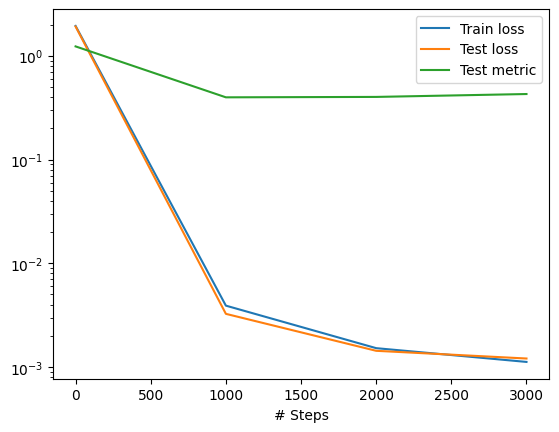

In [ ]:
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A, B= x[:,0:1],x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    return np.cos(x[:,1:2])


time = dde.geometry.TimeDomain(0,1.58)
geom = dde.geometry.Rectangle([0,0], [1, 1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
#bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)
#bcd_l = dde.icbc.OperatorBC(geom, bc_func2, boundary_l)
def bc_func2(inputs, outputs, X):
    return dde.grad.jacobian(outputs, inputs, i=0, j=None) - 2
bcd_l = dde.icbc.OperatorBC(geom, bc_func2, boundary_l)
data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 320, num_boundary = 160, num_initial=160, solution=func, num_test=640)

layer_size = [1] + [50] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=3000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

#entendendo on_initial e utilizando explicitamente outras ferramentas

(960, 3)
(1095, 3)
Compiling model...
Building feed-forward neural network...
'build' took 0.151228 s



<ipython-input-21-5114b3fa3147>:30: RuntimeWarning: invalid value encountered in sqrt
  return np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B)*t))/np.sqrt(A**2-4*B))
<ipython-input-21-5114b3fa3147>:30: RuntimeWarning: invalid value encountered in true_divide
  return np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B)*t))/np.sqrt(A**2-4*B))


'compile' took 0.856364 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [3.83e-03, 1.41e+00, 3.05e-02]    [2.51e-03, 1.41e+00, 3.05e-02]    [nan]         
1000      [1.00e-03, 9.76e-05, 9.87e-04]    [7.87e-04, 9.76e-05, 9.87e-04]    [nan]         
2000      [5.90e-04, 1.97e-05, 5.95e-04]    [5.59e-04, 1.97e-05, 5.95e-04]    [nan]         
3000      [5.05e-04, 1.48e-05, 4.02e-04]    [5.10e-04, 1.48e-05, 4.02e-04]    [nan]         
4000      [4.74e-04, 6.99e-06, 2.61e-04]    [4.85e-04, 6.99e-06, 2.61e-04]    [nan]         
5000      [4.50e-04, 5.52e-06, 2.19e-04]    [4.57e-04, 5.52e-06, 2.19e-04]    [nan]         
6000      [4.33e-04, 5.99e-06, 2.03e-04]    [4.46e-04, 5.99e-06, 2.03e-04]    [nan]         
7000      [4.21e-04, 6.00e-06, 1.93e-04]    [4.38e-04, 6.00e-06, 1.93e-04]    [nan]         
8000      [4.10e-04, 6.62e-06, 1.80e-04]    [4.33e-04, 6.62e-06, 1.80e-04]    [nan]         
9000      [3.95e-04, 8.3

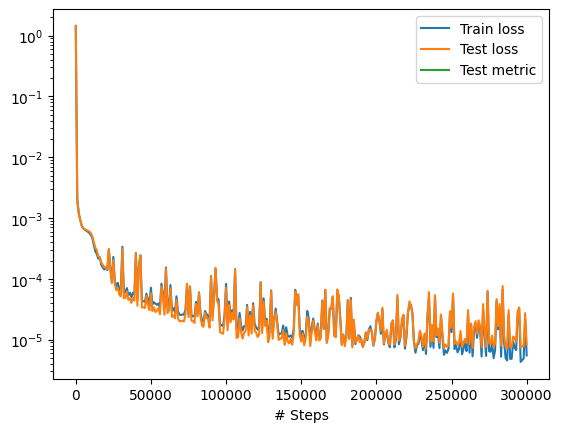

In [ ]:
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    print(np.shape(x))
    A = x[:,0:1]
    B = x[:,1:2]
    t = x[:,2:3]
    #return np.cos(x[:,1:2])
    return np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B)*t))/np.sqrt(A**2-4*B))



time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)
data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 320, num_boundary = 160, num_initial=160, solution=func, num_test=640)

layer_size = [3] + [50] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=300000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

In [ ]:
func(np.array([[1,2,3],[1,2,3]]))
test = np.array([[1,2,3],[1,2,3]])



(2, 3)


<ipython-input-6-8b3348c18607>:30: RuntimeWarning: invalid value encountered in sqrt
  return np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B)*t))/np.sqrt(A**2-4*B))


In [ ]:
def asdf(A,B,t):
    '''
    A = x[:,0:1]
    B = x[:,1:2]
    t = x[:,2:3]
    '''
    print(A,"\n", B,"\n", t)

    return np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))

In [ ]:
float(asdf(1,2,1))


1 
 2 
 1


<ipython-input-59-ecc82574ea58>:1: ComplexWarning: Casting complex values to real discards the imaginary part
  float(asdf(1,2,1))


0.37107355146973436

results:  (1920, 1) x:  (1920, 3) A: (1920, 1) B:  (1920, 1)
[[1.        ]
 [1.        ]
 [1.        ]
 ...
 [0.23145518]
 [0.91875833]
 [0.50300062]]
results:  (2656, 1) x:  (2656, 3) A: (2656, 1) B:  (2656, 1)


<ipython-input-3-308a6b602fc2>:38: ComplexWarning: Casting complex values to real discards the imaginary part
  result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
<ipython-input-3-308a6b602fc2>:40: ComplexWarning: Casting complex values to real discards the imaginary part
  result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)


[[1.        ]
 [1.        ]
 [1.        ]
 ...
 [0.9997744 ]
 [0.99971795]
 [0.99966156]]
Compiling model...
Building feed-forward neural network...
'build' took 0.089380 s

'compile' took 0.770949 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [4.18e-02, 1.03e+00, 6.08e-02]    [3.81e-02, 1.03e+00, 6.08e-02]    [1.18e+00]    
1000      [8.02e-04, 3.72e-04, 9.56e-04]    [7.60e-04, 3.72e-04, 9.56e-04]    [2.97e-01]    
2000      [4.89e-04, 1.82e-05, 3.07e-04]    [4.84e-04, 1.82e-05, 3.07e-04]    [3.28e-01]    
3000      [5.77e-04, 8.32e-04, 5.83e-04]    [6.91e-04, 8.32e-04, 5.83e-04]    [3.64e-01]    
4000      [9.83e-04, 2.42e-05, 2.05e-04]    [7.51e-04, 2.42e-05, 2.05e-04]    [3.75e-01]    
5000      [4.33e-04, 6.91e-06, 1.66e-04]    [4.52e-04, 6.91e-06, 1.66e-04]    [3.51e-01]    
6000      [3.78e-04, 1.04e-05, 1.44e-04]    [4.03e-04, 1.04e-05, 1.44e-04]    [3.39e-01]    
7000      [3.20e-04, 2.61e-05, 1.12e

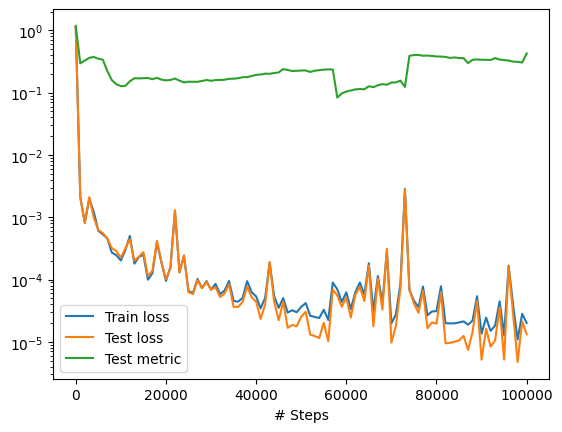

Compiling model...
'compile' took 0.334924 s

Training model...

Step      Train loss                        Test loss                         Test metric   
100000    [1.67e-05, 6.86e-07, 2.76e-06]    [9.79e-06, 6.86e-07, 2.76e-06]    [4.27e-01]    
101000    [5.88e-06, 5.24e-07, 9.93e-07]    [5.88e-06, 5.24e-07, 9.93e-07]                  
102000    [3.62e-06, 2.87e-07, 6.55e-07]    [3.62e-06, 2.87e-07, 6.55e-07]                  
103000    [2.48e-06, 1.09e-07, 4.92e-07]    [2.48e-06, 1.09e-07, 4.92e-07]                  
104000    [1.83e-06, 7.35e-08, 3.11e-07]    [1.83e-06, 7.35e-08, 3.11e-07]                  
105000    [1.40e-06, 9.14e-08, 2.39e-07]    [1.40e-06, 9.14e-08, 2.39e-07]                  
105428    [1.30e-06, 1.03e-07, 2.12e-07]    [3.48e-07, 1.03e-07, 2.12e-07]    [2.04e-01]    

Best model at step 105428:
  train loss: 1.61e-06
  test loss: 6.63e-07
  test metric: [2.04e-01]

'train' took 506.126613 s

Saving loss history to /content/loss.dat ...
Saving training dat

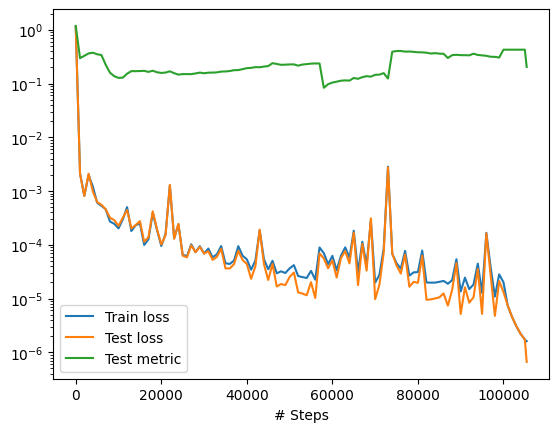

In [ ]:
#from deepxde.backend.jax.tensor import shape
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1])
    print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    print(result)


    '''
    for i in range(np.shape(result)):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)
    '''

    #print(np.argwhere(np.isnan(result)))

    return result



time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 640, num_boundary = 320, num_initial=320, solution=func, num_test=2000)

layer_size = [3] + [200] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=1*10**5)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10000,
    maxfun=10000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

#Teste fixando as variáveis

results:  (21, 1) x:  (21, 1) A: (21, 1) B:  (21, 1)
[[ 1.        ]
 [ 1.        ]
 [-0.00920359]
 [ 1.        ]
 [-0.00920359]
 [ 0.70384532]
 [ 0.92299658]
 [ 0.376297  ]
 [ 0.98056018]
 [ 0.55077821]
 [ 0.82954717]
 [ 0.18718556]
 [ 0.99512815]
 [ 0.63038284]
 [ 0.88056183]
 [ 0.2831206 ]
 [ 0.95643795]
 [ 0.4658069 ]
 [ 0.7704497 ]
 [ 0.08942666]
 [ 0.99878132]]
results:  (2003, 1) x:  (2003, 1) A: (2003, 1) B:  (2003, 1)
[[ 1.        ]
 [ 1.        ]
 [-0.00920359]
 ...
 [-0.00683486]
 [-0.00762436]
 [-0.00841397]]
Compiling model...
Building feed-forward neural network...
'build' took 0.055922 s



<ipython-input-15-a5c1e36c9575>:41: ComplexWarning: Casting complex values to real discards the imaginary part
  result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))


'compile' took 0.917467 s

Training model...

0         [6.40e-04, 1.00e+00, 9.90e-04]    [6.56e-04, 1.00e+00, 9.90e-04]    [9.76e-01]    
1000      [7.07e-02, 5.33e-02, 1.07e-01]    [7.64e-02, 5.33e-02, 1.07e-01]    [2.28e-01]    
2000      [7.07e-02, 5.32e-02, 1.07e-01]    [7.68e-02, 5.32e-02, 1.07e-01]    [2.27e-01]    
3000      [7.09e-02, 5.31e-02, 1.06e-01]    [7.73e-02, 5.31e-02, 1.06e-01]    [2.27e-01]    
4000      [7.11e-02, 5.27e-02, 1.06e-01]    [7.88e-02, 5.27e-02, 1.06e-01]    [2.26e-01]    
5000      [7.19e-02, 5.21e-02, 1.05e-01]    [8.03e-02, 5.21e-02, 1.05e-01]    [2.25e-01]    
6000      [7.15e-02, 5.22e-02, 1.04e-01]    [8.06e-02, 5.22e-02, 1.04e-01]    [2.25e-01]    
7000      [7.00e-02, 5.11e-02, 1.02e-01]    [8.76e-02, 5.11e-02, 1.02e-01]    [2.23e-01]    
8000      [7.07e-02, 5.01e-02, 1.00e-01]    [9.14e-02, 5.01e-02, 1.00e-01]    [2.20e-01]    
9000      [7.18e-02, 5.15e-02, 1.03e-01]    [8.30e-02, 5.15e-02, 1.03e-01]    [2.24e-01]    
10000     [7.07e-02, 5.3

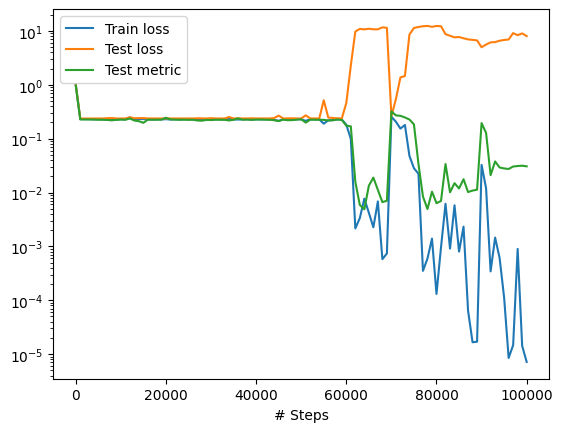

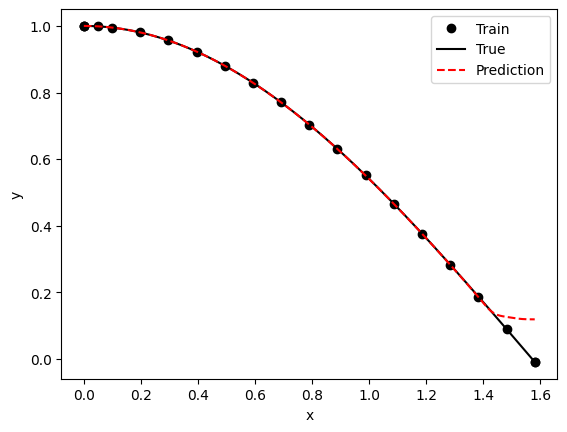

Compiling model...
'compile' took 0.454682 s

Training model...

Step      Train loss                        Test loss                         Test metric   
100000    [7.11e-06, 2.88e-09, 4.27e-08]    [8.03e+00, 2.85e-09, 4.29e-08]    [3.07e-02]    
100028    [6.35e-06, 1.72e-08, 4.05e-08]    [8.03e+00, 1.72e-08, 4.05e-08]    [3.07e-02]    

Best model at step 100028:
  train loss: 6.40e-06
  test loss: 8.03e+00
  test metric: [3.07e-02]

'train' took 3.697603 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


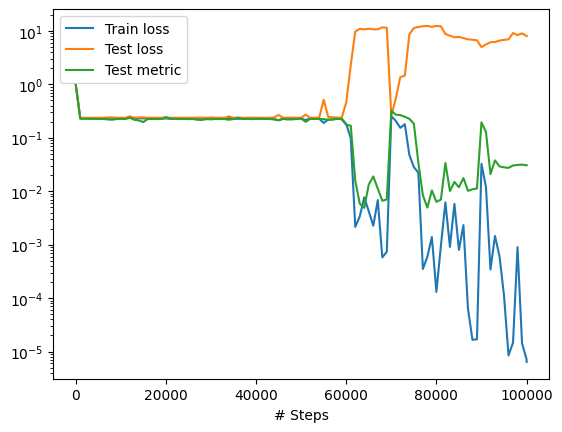

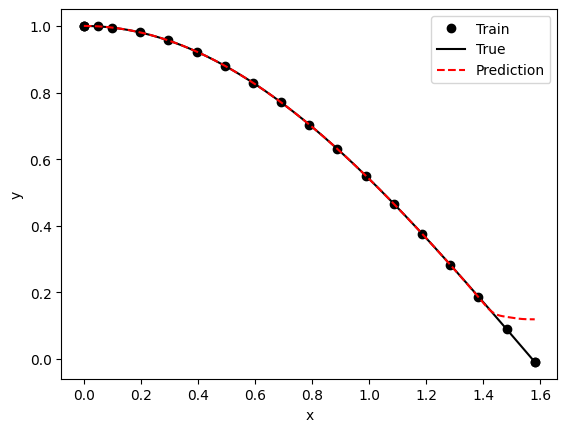

In [ ]:
#from deepxde.backend.jax.tensor import shape
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=0,j=0)
    dy_x = dde.grad.jacobian(y, x,j=0)
    A = 0#x[:,0:1]
    B = 1#x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    #A = np.complex64(x[:,0:1])
    A = np.zeros([np.shape(x)[0],1])
    B = np.ones([np.shape(x)[0],1])
    A= np.complex64(A)
    B= np.complex64(B)
    t = np.complex64(x[:,0:1])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1])
    print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    print(result)


    '''
    for i in range(np.shape(result)):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)
    '''

    #print(np.argwhere(np.isnan(result)))

    return result



time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(time, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(time, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.PDE(time, pde, [bc_l, bcd_l], num_domain = 16, num_boundary=2, solution=func, num_test=2000)

layer_size = [1] + [200] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=1*10**5)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10000,
    maxfun=10000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

<ipython-input-36-210f70f95ff3>:41: ComplexWarning: Casting complex values to real discards the imaginary part
  result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))


x:  [0.] y:  [1.]
x:  [0.] y:  [1.]
x:  [1.58] y:  [0.99999994]
x:  [0.] y:  [1.]
x:  [1.58] y:  [0.99999994]
x:  [0.79] y:  [1.]
x:  [0.395] y:  [1.00000012]
x:  [1.1850001] y:  [1.]
x:  [0.1975] y:  [0.99999994]
x:  [0.9875] y:  [0.99999994]
x:  [0.59250003] y:  [1.]
x:  [1.3825] y:  [1.]
x:  [0.09875] y:  [1.]
x:  [0.88875] y:  [1.]
x:  [0.49375] y:  [0.99999994]
x:  [1.28375] y:  [1.]
x:  [0.29625002] y:  [1.]
x:  [1.0862501] y:  [1.]
x:  [0.69125] y:  [1.]
x:  [1.48125] y:  [1.]
x:  [0.049375] y:  [0.99999994]


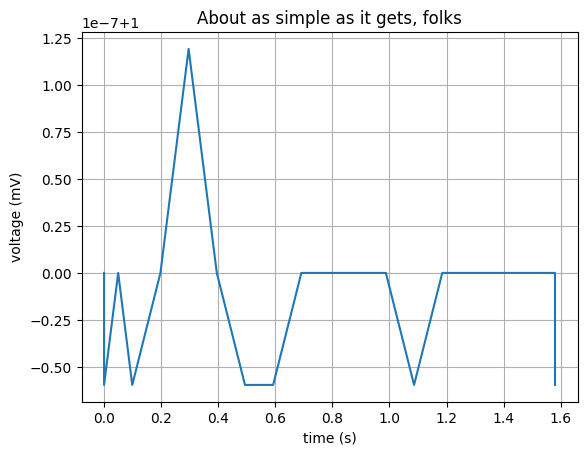

x:  [0.] y:  [1.]
x:  [0.] y:  [1.]
x:  [1.58] y:  [0.99999994]
x:  [0.04787879] y:  [1.]
x:  [0.09575757] y:  [1.]
x:  [0.14363636] y:  [1.00000012]
x:  [0.19151515] y:  [0.99999994]
x:  [0.23939393] y:  [1.]
x:  [0.28727272] y:  [1.]
x:  [0.33515152] y:  [1.]
x:  [0.3830303] y:  [1.]
x:  [0.4309091] y:  [1.]
x:  [0.47878787] y:  [0.99999988]
x:  [0.52666664] y:  [1.]
x:  [0.57454544] y:  [0.99999994]
x:  [0.62242424] y:  [1.]
x:  [0.67030305] y:  [1.]
x:  [0.7181818] y:  [0.99999988]
x:  [0.7660606] y:  [1.]
x:  [0.8139394] y:  [1.]
x:  [0.8618182] y:  [0.99999994]
x:  [0.909697] y:  [1.]
x:  [0.95757574] y:  [1.]
x:  [1.0054545] y:  [1.]
x:  [1.0533333] y:  [1.]
x:  [1.1012121] y:  [1.]
x:  [1.1490909] y:  [1.]
x:  [1.1969697] y:  [1.00000012]
x:  [1.2448485] y:  [1.]
x:  [1.2927272] y:  [1.]
x:  [1.3406061] y:  [1.]
x:  [1.3884848] y:  [0.99999994]
x:  [1.4363636] y:  [1.]
x:  [1.4842424] y:  [1.]
x:  [1.5321212] y:  [0.99999994]


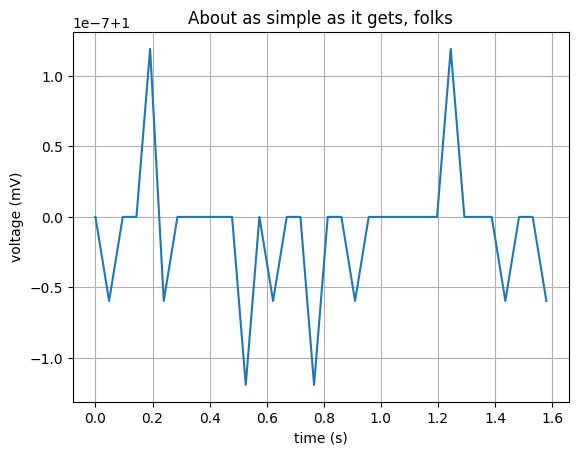

Compiling model...
Building feed-forward neural network...
'build' took 0.066027 s

'compile' took 1.712073 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [6.28e-06, 1.00e+00, 2.28e-06]    [6.51e-06, 1.00e+00, 2.28e-06]    [1.00e+00]    
1000      [1.37e-05, 9.50e-10, 7.67e-06]    [1.14e-05, 9.50e-10, 7.67e-06]    [7.05e-04]    
2000      [4.91e-07, 5.13e-12, 5.47e-08]    [3.02e-07, 5.13e-12, 5.47e-08]    [1.14e-04]    
3000      [8.06e-05, 1.01e-06, 5.93e-05]    [7.47e-05, 1.01e-06, 5.93e-05]    [7.23e-03]    
4000      [1.76e-07, 5.12e-13, 4.52e-09]    [1.20e-07, 5.12e-13, 4.52e-09]    [4.86e-05]    
5000      [2.62e-07, 2.79e-12, 9.63e-08]    [1.81e-07, 2.79e-12, 9.63e-08]    [7.00e-05]    

Best model at step 4000:
  train loss: 1.80e-07
  test loss: 1.25e-07
  test metric: [4.86e-05]

'train' took 9.123208 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Savi

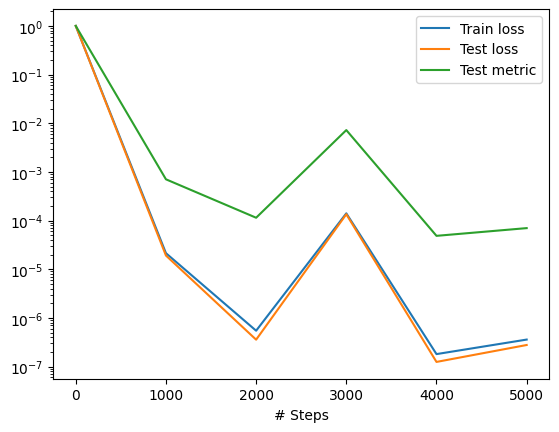

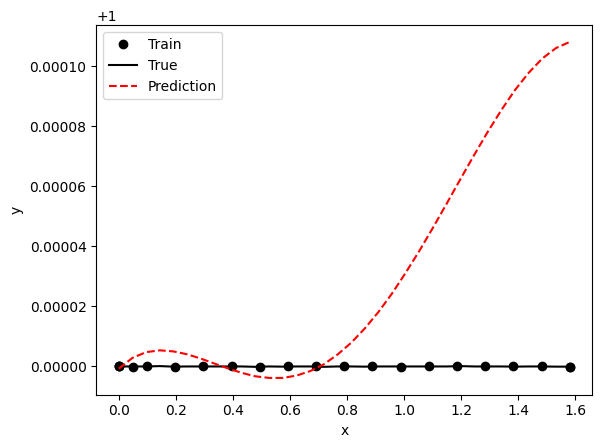

Compiling model...
'compile' took 0.942001 s

Training model...

Step      Train loss                        Test loss                         Test metric   
5000      [2.62e-07, 2.79e-12, 9.63e-08]    [1.81e-07, 2.79e-12, 9.63e-08]    [7.00e-05]    
5117      [4.77e-10, 0.00e+00, 1.02e-12]    [3.49e-10, 0.00e+00, 1.02e-12]    [3.11e-06]    

Best model at step 5117:
  train loss: 4.78e-10
  test loss: 3.50e-10
  test metric: [3.11e-06]

'train' took 34.607110 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


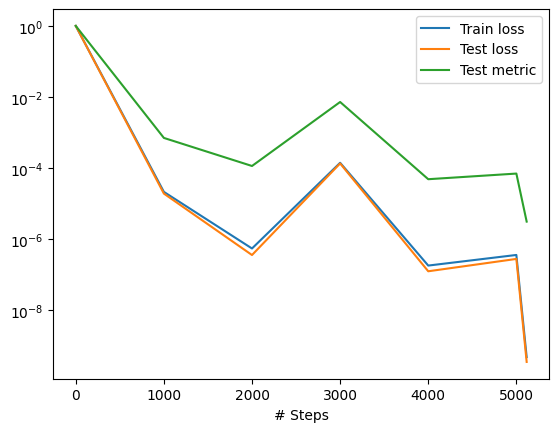

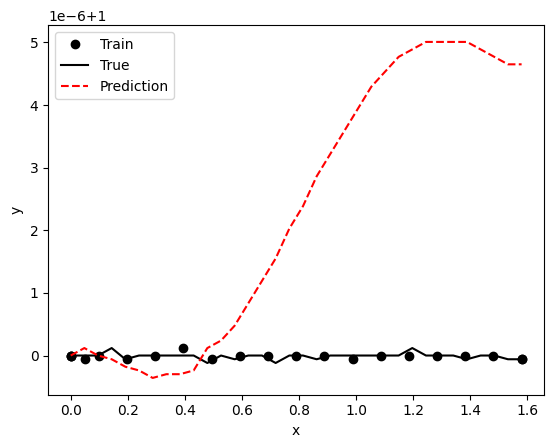

In [ ]:
#from deepxde.backend.jax.tensor import shape
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=0,j=0)
    dy_x = dde.grad.jacobian(y, x,j=0)
    A = 1#x[:,0:1]
    B = 0#x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    #A = np.complex64(x[:,0:1])
    A = np.ones([np.shape(x)[0],1])
    B = np.zeros([np.shape(x)[0],1])
    A= np.complex64(A)
    B= np.complex64(B)
    t = np.complex64(x[:,0:1])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1])
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
            print("x: ", x[i], "y: ", result[i])
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)
            print("x: ", x[i], "y: ", result[i])

    #print(result[0:10],result[20:])



    '''
    for i in range(np.shape(result)):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)
    '''

    #print(np.argwhere(np.isnan(result)))
    #t=np.float64(t)
    #result=np.float64(result)
    fig, ax = plt.subplots()
    ax.plot(sorted(t), result)

    ax.set(xlabel='time (s)', ylabel='voltage (mV)',
        title='About as simple as it gets, folks')
    ax.grid()

    fig.savefig("test.png")
    plt.show()

    return result



time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(time, lambda x:1, lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(time, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.PDE(time, pde, [bc_l, bcd_l], num_domain = 16, num_boundary=2, solution=func, num_test=32)

layer_size = [1] + [200] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=5000)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10000,
    maxfun=10000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

<ipython-input-48-82d93ccee09a>:43: ComplexWarning: Casting complex values to real discards the imaginary part
  result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))


x:  [0.] y:  [1.]
x:  [0.] y:  [1.]
x:  [0.] y:  [1.]
x:  [0.] y:  [1.]
x:  [0.] y:  [1.]
x:  [1.58] y:  [0.55832189]
x:  [1.58] y:  [0.55832189]
x:  [1.58] y:  [0.55832189]
x:  [0.] y:  [1.]
x:  [1.58] y:  [0.55832189]
x:  [0.] y:  [1.]
x:  [0.] y:  [1.]
x:  [0.] y:  [1.]
x:  [1.58] y:  [0.55832189]
x:  [1.58] y:  [0.55832189]
x:  [1.58] y:  [0.55832189]
x:  [0.] y:  [1.]
x:  [1.58] y:  [0.55832189]
x:  [0.] y:  [1.]
x:  [0.] y:  [1.]
x:  [0.79] y:  [0.86607945]
x:  [0.395] y:  [0.96367359]
x:  [1.1850001] y:  [0.72506207]
x:  [0.1975] y:  [0.99057692]
x:  [0.9875] y:  [0.79987323]
x:  [0.59250003] y:  [0.92143267]
x:  [1.3825] y:  [0.6438421]
x:  [0.09875] y:  [0.9976027]
x:  [0.88875] y:  [0.8341918]
x:  [0.49375] y:  [0.9443326]
x:  [1.28375] y:  [0.68511897]
x:  [0.29625002] y:  [0.97917891]
x:  [1.0862501] y:  [0.76340437]
x:  [0.69125] y:  [0.89525414]
x:  [1.48125] y:  [0.60149205]
x:  [0.049375] y:  [0.99939555]
x:  [0.839375] y:  [0.85045713]
x:  [0.444375] y:  [0.95446539]
x

/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.273873 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [1.27e-05, 1.00e+00, 1.87e-05]    [1.12e-05, 1.00e+00, 1.87e-05]    [9.97e-01]    
1000      [1.86e-02, 3.62e-03, 3.79e-02]    [2.10e-02, 3.62e-03, 3.79e-02]    [5.90e-02]    
2000      [1.88e-02, 3.54e-03, 3.71e-02]    [2.22e-02, 3.54e-03, 3.71e-02]    [5.92e-02]    
3000      [1.91e-02, 3.43e-03, 3.58e-02]    [2.37e-02, 3.43e-03, 3.58e-02]    [5.80e-02]    
4000      [1.94e-02, 3.34e-03, 3.53e-02]    [2.43e-02, 3.34e-03, 3.53e-02]    [5.83e-02]    
5000      [1.94e-02, 3.36e-03, 3.51e-02]    [2.44e-02, 3.36e-03, 3.51e-02]    [5.76e-02]    
6000      [1.98e-02, 3.42e-03, 3.44e-02]    [2.51e-02, 3.42e-03, 3.44e-02]    [5.64e-02]    
7000      [2.00e-02, 3.57e-03, 3.40e-02]    [2.52e-02, 3.57e-03, 3.40e-02]    [5.93e-02]    
8000      [2.19e-02, 5.40e-03, 3.08e-02]    [2.76e-02, 5.40e-03, 3.08e-02]    [6.77e-02]    
9000      [1.95e-02, 3.2

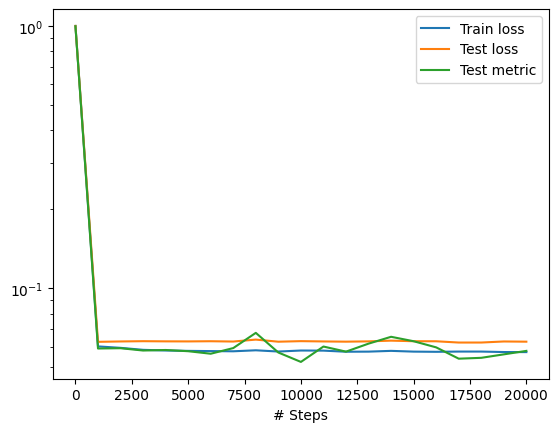

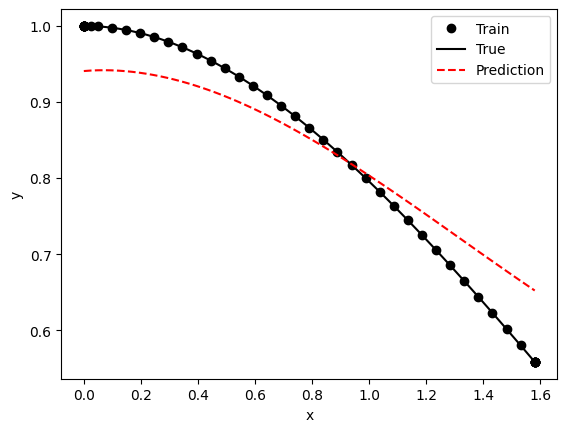

Compiling model...
'compile' took 1.183417 s

Training model...

Step      Train loss                        Test loss                         Test metric   
20000     [1.99e-02, 3.52e-03, 3.38e-02]    [2.54e-02, 3.52e-03, 3.38e-02]    [5.78e-02]    
20567     [1.39e-05, 2.62e-09, 5.55e-10]    [4.87e+01, 2.62e-09, 5.55e-10]    [7.91e-03]    

Best model at step 20567:
  train loss: 1.39e-05
  test loss: 4.87e+01
  test metric: [7.91e-03]

'train' took 400.012012 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


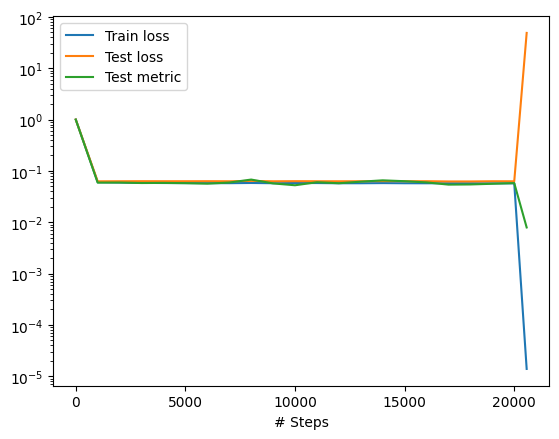

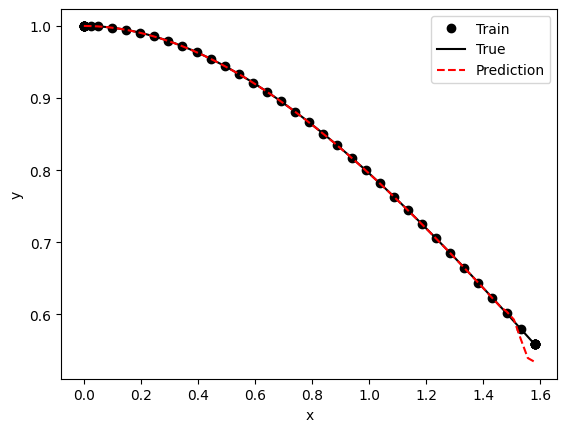

In [ ]:
#from deepxde.backend.jax.tensor import shape
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=0,j=0)
    dy_x = dde.grad.jacobian(y, x,j=0)
    A = 0.5#x[:,0:1]
    B = 0.5#x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    #A = np.complex64(x[:,0:1])
    A = np.ones([np.shape(x)[0],1])
    B = np.ones([np.shape(x)[0],1])
    A=A/2
    B=B/2
    A= np.complex64(A)
    B= np.complex64(B)
    t = np.complex64(x[:,0:1])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1])
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
            print("x: ", x[i], "y: ", result[i])
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)
            print("x: ", x[i], "y: ", result[i])

    #print(result[0:10],result[20:])




    for i in range(np.shape(x)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)


    #print(np.argwhere(np.isnan(result)))
    #t=np.float64(t)
    #result=np.float64(result)

    #fig, ax = plt.subplots()
    #ax.plot(sorted(t), result)

    #ax.set(xlabel='time (s)', ylabel='voltage (mV)',
    #    title='About as simple as it gets, folks')
    #ax.grid()

    #fig.savefig("test.png")
    #plt.show()

    return result

def func2(imput):
    return 1



time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(time, func2, boundary_l)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(time, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.PDE(time, pde, [bc_l, bcd_l], num_domain = 32, num_boundary=8, solution=func, num_test=64)

layer_size = [1] + [200] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=20000)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10000,
    maxfun=10000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

In [ ]:
import numpy as np
import deepxde as dde
from deepxde.backend import tf

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

#Generalized training and then evaliation on fixed values


<ipython-input-3-ec86e0b25a8b>:38: ComplexWarning: Casting complex values to real discards the imaginary part
  result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
<ipython-input-3-ec86e0b25a8b>:40: ComplexWarning: Casting complex values to real discards the imaginary part
  result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)


results:  (1920, 1) x:  (1920, 3) A: (1920, 1) B:  (1920, 1)
[[1.        ]
 [1.        ]
 [1.        ]
 ...
 [0.23145518]
 [0.91875833]
 [0.50300062]]
results:  (2656, 1) x:  (2656, 3) A: (2656, 1) B:  (2656, 1)
[[1.        ]
 [1.        ]
 [1.        ]
 ...
 [0.9997744 ]
 [0.99971795]
 [0.99966156]]
Compiling model...
Building feed-forward neural network...
'build' took 0.056876 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 3.454823 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [3.49e-03, 1.10e+00, 3.80e-03]    [3.06e-03, 1.10e+00, 3.80e-03]    [1.06e+00]    
1000      [5.98e-04, 2.67e-05, 4.66e-04]    [5.31e-04, 2.67e-05, 4.66e-04]    [2.89e-01]    
2000      [1.42e-03, 2.02e-04, 6.46e-04]    [9.95e-04, 2.02e-04, 6.46e-04]    [3.05e-01]    
3000      [4.92e-04, 6.37e-06, 2.16e-04]    [5.16e-04, 6.37e-06, 2.16e-04]    [3.67e-01]    
4000      [4.71e-04, 5.45e-06, 1.85e-04]    [5.00e-04, 5.45e-06, 1.85e-04]    [3.74e-01]    
5000      [4.39e-04, 1.35e-05, 1.96e-04]    [4.87e-04, 1.35e-05, 1.96e-04]    [3.71e-01]    
6000      [3.37e-04, 9.41e-06, 1.16e-04]    [3.68e-04, 9.41e-06, 1.16e-04]    [3.47e-01]    
7000      [2.42e-04, 3.38e-05, 9.00e-05]    [2.24e-04, 3.38e-05, 9.00e-05]    [2.37e-01]    
8000      [3.77e-04, 6.10e-05, 2.76e-04]    [2.95e-04, 6.10e-05, 2.76e-04]    [2.14e-01]    
9000      [1.77e-04, 4.2

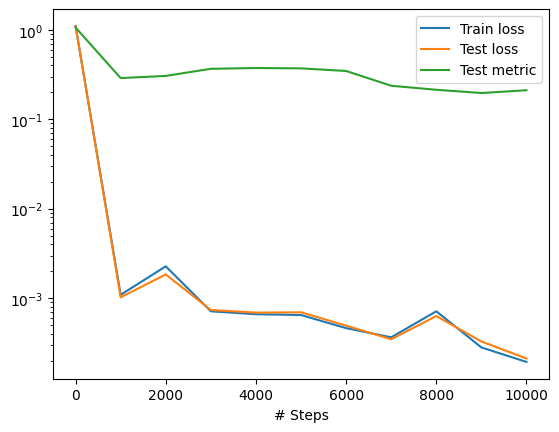

Compiling model...
'compile' took 0.265998 s

Training model...

Step      Train loss                        Test loss                         Test metric   
10000     [1.47e-04, 4.03e-06, 4.29e-05]    [1.65e-04, 4.03e-06, 4.29e-05]    [2.11e-01]    
11000     [3.75e-05, 2.67e-06, 9.73e-06]    [3.75e-05, 2.67e-06, 9.73e-06]                  
12000     [1.95e-05, 1.91e-06, 5.28e-06]    [1.95e-05, 1.91e-06, 5.28e-06]                  
13000     [1.36e-05, 7.47e-07, 3.60e-06]    [1.36e-05, 7.47e-07, 3.60e-06]                  
14000     [9.32e-06, 5.58e-07, 2.35e-06]    [9.32e-06, 5.58e-07, 2.35e-06]                  
15000     [7.14e-06, 4.76e-07, 1.61e-06]    [7.14e-06, 4.76e-07, 1.61e-06]                  
15799     [6.06e-06, 5.25e-07, 1.35e-06]    [3.17e-06, 5.25e-07, 1.35e-06]    [1.84e-01]    

Best model at step 15799:
  train loss: 7.93e-06
  test loss: 5.04e-06
  test metric: [1.84e-01]

'train' took 297.727955 s

Saving loss history to /content/loss.dat ...
Saving training data

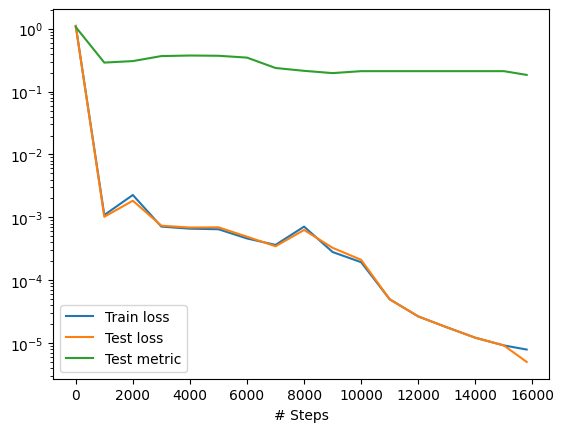

In [ ]:
#from deepxde.backend.jax.tensor import shape
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)



time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 640, num_boundary = 320, num_initial=320, solution=func, num_test=2000)

layer_size = [3] + [200] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=10000)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10  ,
    maxfun=10000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

In [ ]:
    def make_X(A,B):
        A = A* np.ones([256,1])
        B = B*np.ones([256,1])
        t = np.linspace(0,1.58,256)
        t= np.vstack(t)
        X = np.concatenate((A, B, t), axis=1)
        return X


In [ ]:
np.shape(make_X(0.5,0.8))

(256, 3)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
#Change plots dpi:

plt.rcParams['figure.dpi'] = 200

def plot_results(A,B):

    plt.style.use('_mpl-gallery')

    # make data
    X=make_X(A,B)
    t = X[:,2:3]
    x = np.hstack(t)

    y_true=func(X)
    y_pred= model.predict(X)

    y_true = np.hstack(y_true)
    y_pred = np.hstack(y_pred)

    # plot
    fig, ax = plt.subplots()

    ax.plot(x, y_true, linewidth=2.0,color = 'b', label='Exact')
    ax.plot(x, y_pred, linestyle = 'dashed', linewidth=2.0, color='r', label='Prediction')
    ax.set(xlim=(0, 1.6), xticks=np.arange(0, 1.6, step=0.2),
        ylim=(0, 1.2), yticks=np.arange(0, 1.2, step=0.2))
    ax.set_title('Variables coefficients')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y(x)$')
    ax.legend()
    plt.show()

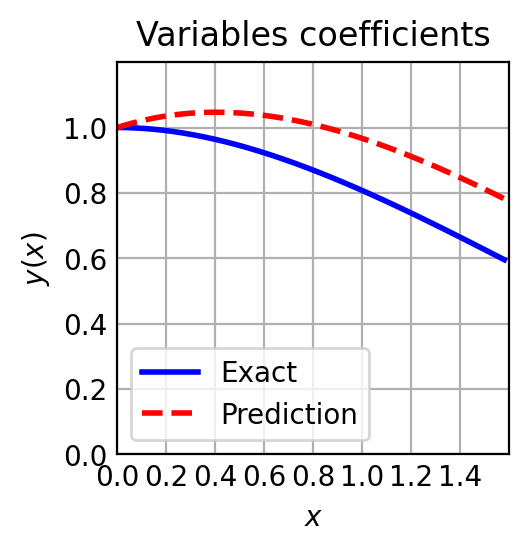

In [ ]:
plot_results(0.7,0.5)

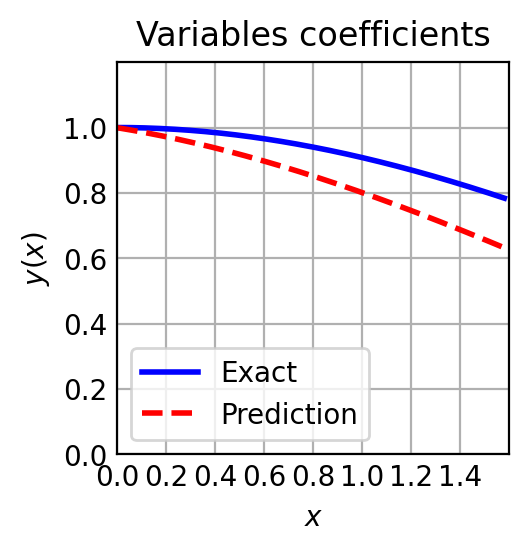

In [ ]:
plot_results(0.2,0.2)

##More robust test

No backend selected.
Finding available backend...


Using backend: tensorflow.compat.v1
Other supported backends: tensorflow, pytorch, jax, paddle.
paddle supports more examples now and is recommended.
Instructions for updating:
non-resource variables are not supported in the long term


Found tensorflow.compat.v1
Setting the default backend to "tensorflow.compat.v1". You can change it in the ~/.deepxde/config.json file or export the DDE_BACKEND environment variable. Valid options are: tensorflow.compat.v1, tensorflow, pytorch, jax, paddle (all lowercase)
Enable just-in-time compilation with XLA.



Compiling model...
Building feed-forward neural network...
'build' took 0.057792 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 3.597346 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [2.90e-02, 9.06e-01, 7.10e-03]    [2.75e-02, 9.06e-01, 7.10e-03]    [8.64e-01]    
1000      [5.74e-04, 2.96e-05, 4.42e-04]    [3.27e-04, 2.96e-05, 4.42e-04]    [2.59e-01]    
2000      [4.98e-04, 1.21e-05, 2.29e-04]    [2.97e-04, 1.21e-05, 2.29e-04]    [3.46e-01]    
3000      [4.76e-04, 1.10e-05, 1.94e-04]    [2.86e-04, 1.10e-05, 1.94e-04]    [3.59e-01]    
4000      [4.54e-04, 9.82e-06, 1.75e-04]    [2.71e-04, 9.82e-06, 1.75e-04]    [3.54e-01]    
5000      [4.33e-04, 9.66e-06, 1.57e-04]    [2.44e-04, 9.66e-06, 1.57e-04]    [3.58e-01]    
6000      [2.97e-04, 6.87e-06, 1.02e-04]    [1.76e-04, 6.87e-06, 1.02e-04]    [3.90e-01]    
7000      [1.72e-04, 4.28e-06, 5.22e-05]    [1.16e-04, 4.28e-06, 5.22e-05]    [3.43e-01]    
8000      [1.50e-04, 4.64e-06, 4.38e-05]    [1.03e-04, 4.64e-06, 4.38e-05]    [3.12e-01]    
9000      [1.46e-04, 1.1

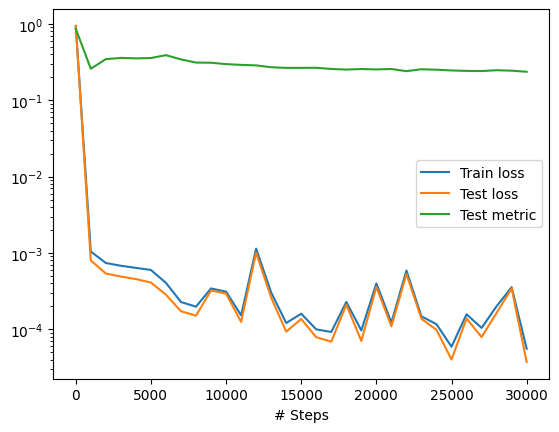

Compiling model...
'compile' took 0.286212 s

Training model...

Step      Train loss                        Test loss                         Test metric   
30000     [3.90e-05, 4.81e-06, 1.19e-05]    [2.07e-05, 4.81e-06, 1.19e-05]    [2.36e-01]    
30012     [3.87e-05, 7.60e-07, 8.49e-06]    [1.98e-05, 7.60e-07, 8.49e-06]    [2.35e-01]    

Best model at step 30012:
  train loss: 4.79e-05
  test loss: 2.90e-05
  test metric: [2.35e-01]

'train' took 3.623073 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


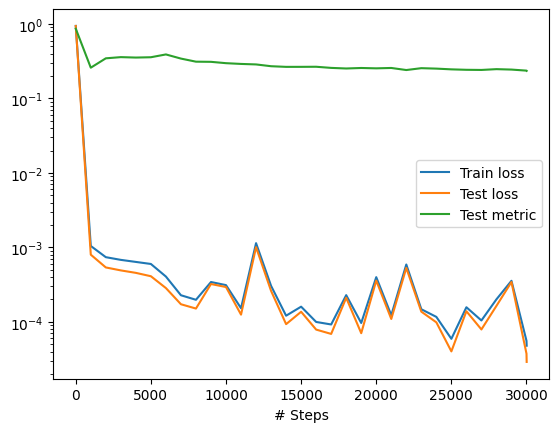

In [ ]:
#from deepxde.backend.jax.tensor import shape
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)



time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 6400, num_boundary = 640, num_initial=640, solution=func, num_test=2000)

layer_size = [3] + [200] * 3 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=30000)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10  ,
    maxfun=30000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

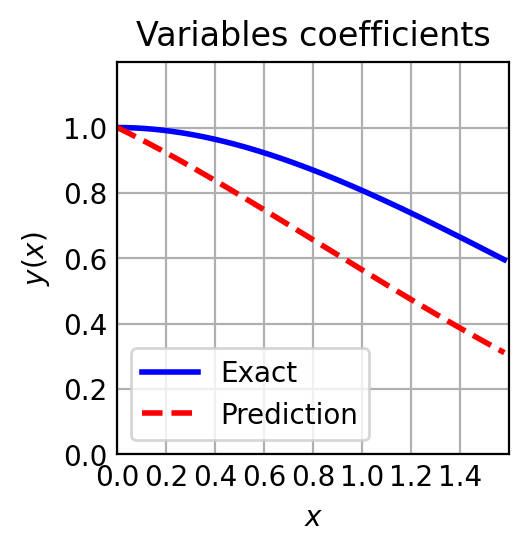

In [ ]:
plot_results(0.7,0.5)

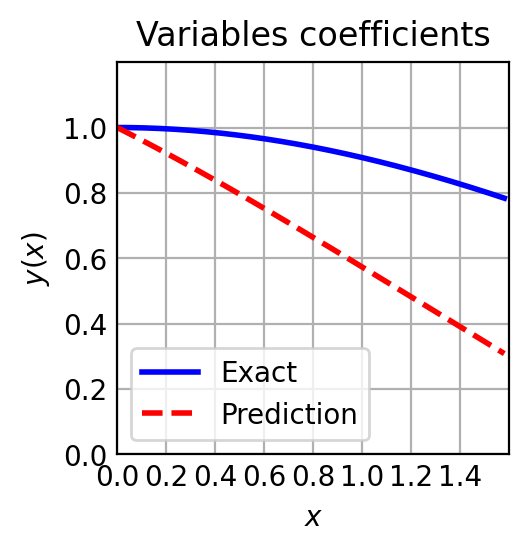

In [ ]:
plot_results(0.2,0.2)

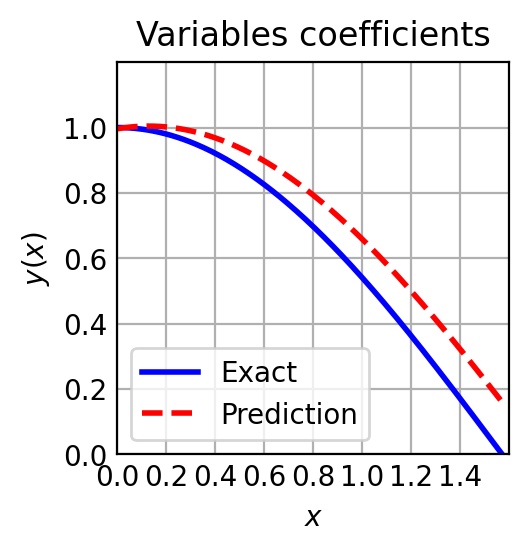

In [ ]:
plot_results(0,1)

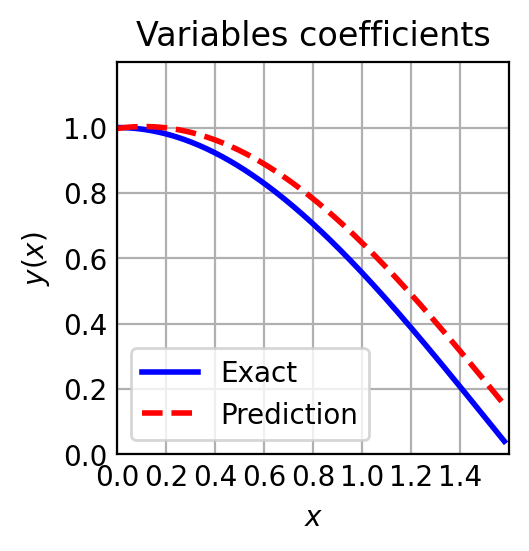

In [ ]:
plot_results(0.1,1)

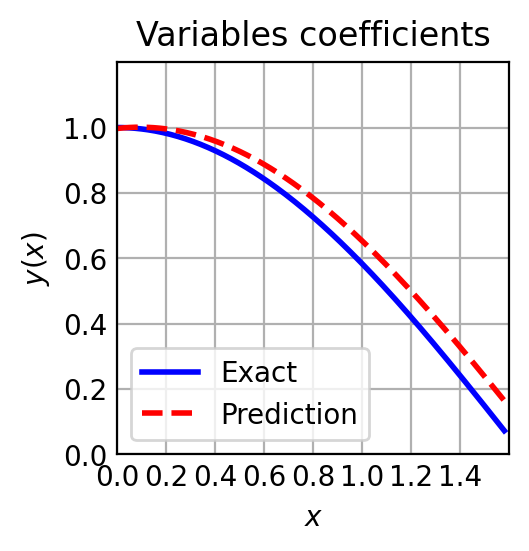

In [ ]:
plot_results(0,0.9)

In [ ]:
## Alternando entre Adam e LBFGS

Compiling model...
Building feed-forward neural network...
'build' took 0.066814 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.596007 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [3.19e-02, 9.87e-01, 1.33e-03]    [3.21e-02, 9.87e-01, 1.33e-03]    [1.14e+00]    
1000      [5.49e-04, 1.48e-05, 3.14e-04]    [3.70e-04, 1.48e-05, 3.14e-04]    [2.51e-01]    
2000      [4.73e-04, 4.85e-06, 1.80e-04]    [3.11e-04, 4.85e-06, 1.80e-04]    [3.05e-01]    
3000      [4.68e-04, 1.53e-04, 1.09e-03]    [4.86e-04, 1.53e-04, 1.09e-03]    [2.89e-01]    
4000      [4.93e-04, 5.27e-05, 3.72e-04]    [2.08e-04, 5.27e-05, 3.72e-04]    [3.28e-01]    
5000      [2.56e-04, 3.83e-05, 1.43e-04]    [1.60e-04, 3.83e-05, 1.43e-04]    [3.07e-01]    

Best model at step 5000:
  train loss: 4.38e-04
  test loss: 3.42e-04
  test metric: [3.07e-01]

'train' took 117.217041 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


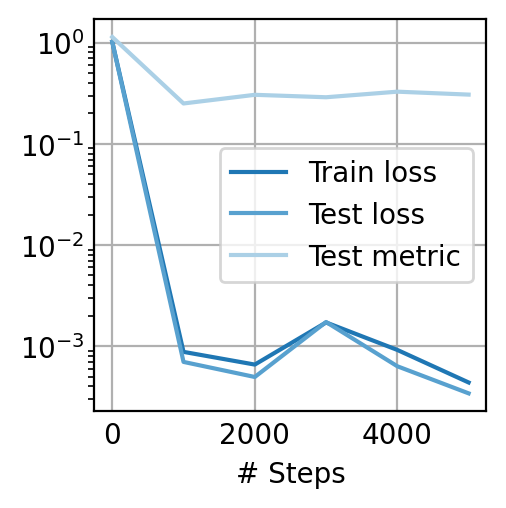

Compiling model...
'compile' took 0.343358 s

Training model...

Step      Train loss                        Test loss                         Test metric   
5000      [2.56e-04, 3.83e-05, 1.43e-04]    [1.60e-04, 3.83e-05, 1.43e-04]    [3.07e-01]    
6000      [4.82e-05, 3.33e-06, 1.60e-05]    [4.82e-05, 3.33e-06, 1.60e-05]                  
7000      [2.35e-05, 1.05e-06, 6.48e-06]    [2.35e-05, 1.05e-06, 6.48e-06]                  
8000      [1.34e-05, 9.26e-07, 3.89e-06]    [1.34e-05, 9.26e-07, 3.89e-06]                  
9000      [1.05e-05, 4.89e-07, 2.54e-06]    [1.05e-05, 4.89e-07, 2.54e-06]                  
10000     [8.69e-06, 5.14e-07, 1.93e-06]    [8.69e-06, 5.14e-07, 1.93e-06]                  
11000     [7.29e-06, 4.09e-07, 1.76e-06]    [7.29e-06, 4.09e-07, 1.76e-06]                  
12000     [6.28e-06, 5.25e-07, 1.59e-06]    [6.28e-06, 5.25e-07, 1.59e-06]                  
13000     [5.50e-06, 5.05e-07, 1.24e-06]    [5.50e-06, 5.05e-07, 1.24e-06]                  
14000

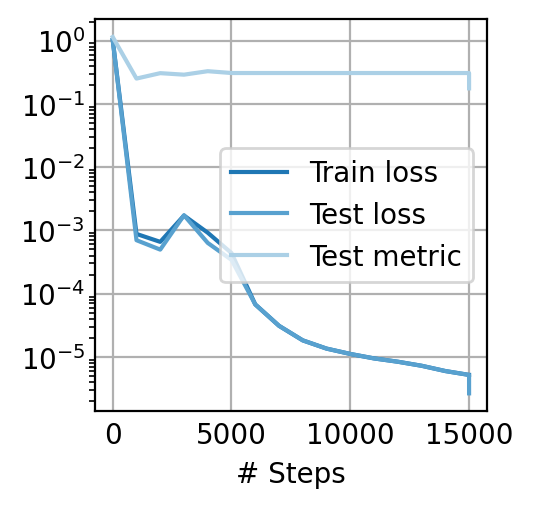

Compiling model...
'compile' took 0.463863 s

Training model...

Step      Train loss                        Test loss                         Test metric   
15001     [4.04e-06, 3.81e-07, 7.67e-07]    [1.50e-06, 3.81e-07, 7.67e-07]    [1.75e-01]    
16000     [5.78e-04, 4.19e-04, 3.15e-04]    [4.11e-04, 4.19e-04, 3.15e-04]    [9.66e-02]    
17000     [3.63e-04, 5.67e-05, 1.52e-04]    [2.22e-04, 5.67e-05, 1.52e-04]    [1.30e-01]    
18000     [2.35e-04, 1.83e-05, 9.44e-05]    [1.57e-04, 1.83e-05, 9.44e-05]    [1.87e-01]    
19000     [1.99e-04, 9.73e-06, 5.84e-05]    [1.37e-04, 9.73e-06, 5.84e-05]    [2.27e-01]    
20000     [4.04e-04, 2.69e-04, 2.31e-03]    [3.22e-04, 2.69e-04, 2.31e-03]    [2.57e-01]    
20001     [5.34e-04, 1.35e-03, 2.63e-03]    [3.95e-04, 1.35e-03, 2.63e-03]    [2.35e-01]    

Best model at step 15001:
  train loss: 5.19e-06
  test loss: 2.65e-06
  test metric: [1.75e-01]

'train' took 116.421257 s

Saving loss history to /content/loss.dat ...
Saving training data

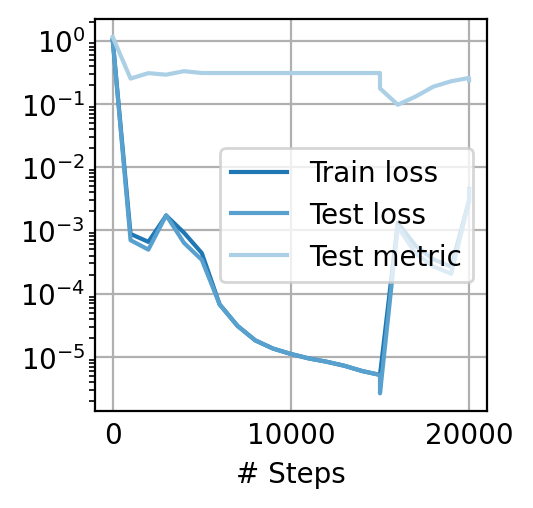

Compiling model...
'compile' took 0.352003 s

Training model...

Step      Train loss                        Test loss                         Test metric   
20001     [5.34e-04, 1.35e-03, 2.63e-03]    [3.95e-04, 1.35e-03, 2.63e-03]    [2.35e-01]    
21000     [3.66e-05, 1.51e-06, 7.30e-06]    [3.66e-05, 1.51e-06, 7.30e-06]                  
22000     [1.98e-05, 9.42e-07, 4.71e-06]    [1.98e-05, 9.42e-07, 4.71e-06]                  
23000     [1.35e-05, 8.84e-07, 3.88e-06]    [1.35e-05, 8.84e-07, 3.88e-06]                  
24000     [1.02e-05, 4.78e-07, 2.61e-06]    [1.02e-05, 4.78e-07, 2.61e-06]                  
25000     [7.82e-06, 4.27e-07, 2.08e-06]    [7.82e-06, 4.27e-07, 2.08e-06]                  
26000     [6.48e-06, 4.01e-07, 1.32e-06]    [6.48e-06, 4.01e-07, 1.32e-06]                  
27000     [5.58e-06, 4.29e-07, 1.00e-06]    [5.58e-06, 4.29e-07, 1.00e-06]                  
28000     [4.71e-06, 3.82e-07, 8.60e-07]    [4.71e-06, 3.82e-07, 8.60e-07]                  
29000

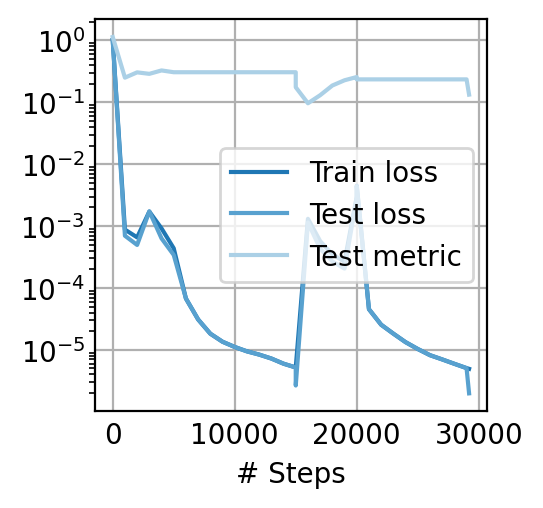

Compiling model...
'compile' took 0.470984 s

Training model...

Step      Train loss                        Test loss                         Test metric   
29207     [3.95e-06, 2.72e-07, 7.13e-07]    [9.97e-07, 2.72e-07, 7.13e-07]    [1.33e-01]    
30000     [3.03e-04, 3.30e-05, 2.22e-04]    [1.69e-04, 3.30e-05, 2.22e-04]    [2.45e-01]    
31000     [1.68e-04, 1.96e-05, 1.05e-04]    [9.22e-05, 1.96e-05, 1.05e-04]    [1.37e-01]    
32000     [6.49e-04, 1.18e-03, 2.96e-04]    [6.73e-04, 1.18e-03, 2.96e-04]    [1.50e-01]    
33000     [1.12e-04, 2.95e-05, 3.35e-05]    [5.94e-05, 2.95e-05, 3.35e-05]    [1.50e-01]    
34000     [8.69e-05, 7.65e-06, 1.98e-05]    [5.78e-05, 7.65e-06, 1.98e-05]    [1.99e-01]    
34207     [8.68e-05, 6.80e-06, 6.62e-05]    [4.62e-05, 6.80e-06, 6.62e-05]    [2.04e-01]    

Best model at step 29207:
  train loss: 4.93e-06
  test loss: 1.98e-06
  test metric: [1.33e-01]

'train' took 116.411141 s

Saving loss history to /content/loss.dat ...
Saving training data

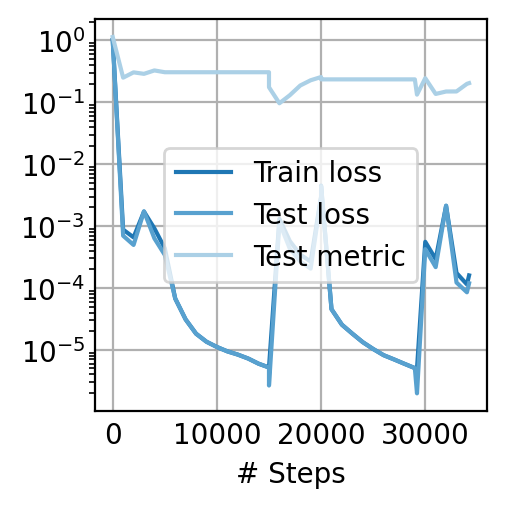

Compiling model...
'compile' took 0.361293 s

Training model...

Step      Train loss                        Test loss                         Test metric   
34207     [8.68e-05, 6.80e-06, 6.62e-05]    [4.62e-05, 6.80e-06, 6.62e-05]    [2.04e-01]    
35000     [3.93e-05, 7.01e-07, 8.57e-06]    [3.93e-05, 7.01e-07, 8.57e-06]                  
36000     [1.81e-05, 9.28e-07, 3.01e-06]    [1.81e-05, 9.28e-07, 3.01e-06]                  
37000     [1.25e-05, 4.20e-07, 1.94e-06]    [1.25e-05, 4.20e-07, 1.94e-06]                  
38000     [8.71e-06, 5.46e-07, 1.23e-06]    [8.71e-06, 5.46e-07, 1.23e-06]                  
39000     [6.51e-06, 4.69e-07, 1.19e-06]    [6.51e-06, 4.69e-07, 1.19e-06]                  
40000     [5.38e-06, 2.23e-07, 8.87e-07]    [5.38e-06, 2.23e-07, 8.87e-07]                  
40749     [4.90e-06, 1.99e-07, 7.62e-07]    [2.28e-06, 1.99e-07, 7.62e-07]    [9.91e-02]    

Best model at step 29207:
  train loss: 4.93e-06
  test loss: 1.98e-06
  test metric: [1.33e-01]


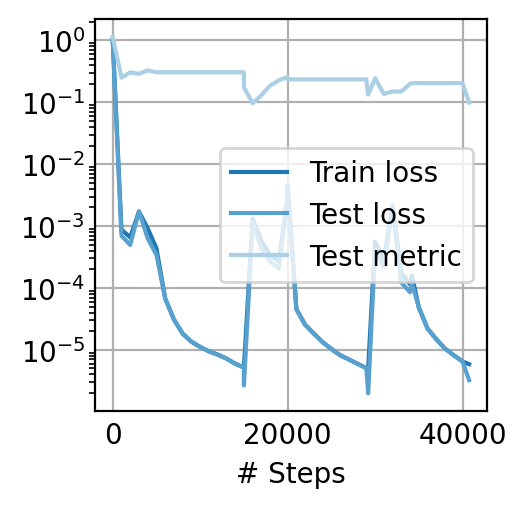

In [ ]:
#from deepxde.backend.jax.tensor import shape
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)



time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 6400, num_boundary = 1280, num_initial=1280, solution=func, num_test=4000)

layer_size = [3] + [256] * 4 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=5000)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10000,
    maxfun=10000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=5000)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10000,
    maxfun=10000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
losshistory, train_state = model.train(iterations=5000)
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10000,
    maxfun=10000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train()
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

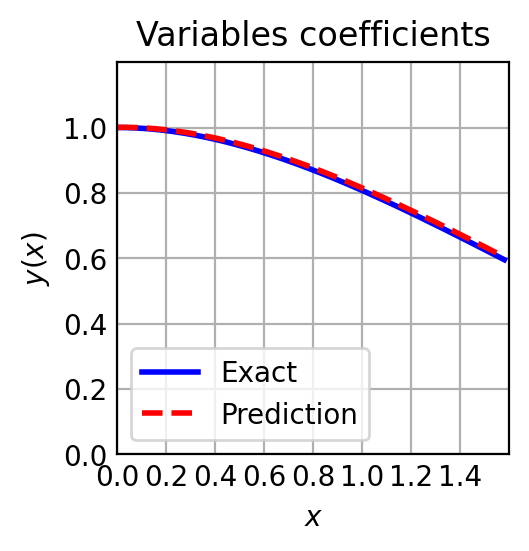

In [ ]:
plot_results(0.7,0.5)

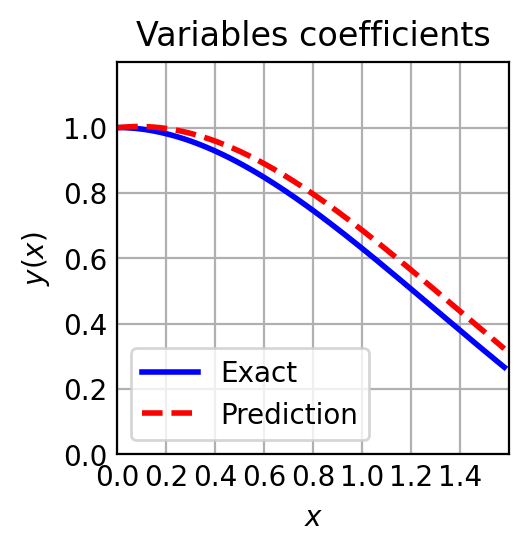

In [ ]:
plot_results(0.7,1)

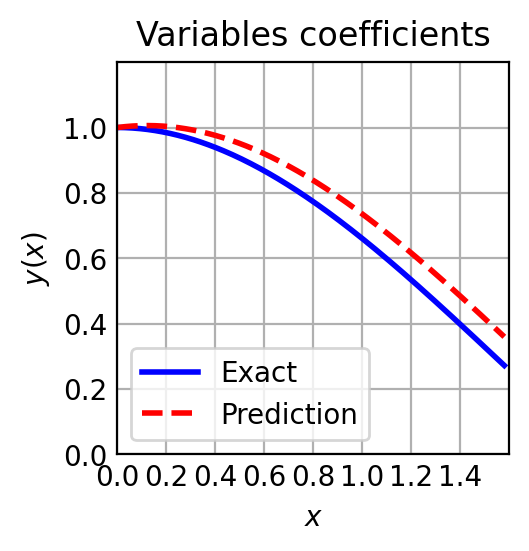

In [ ]:
plot_results(0.3,0.8)

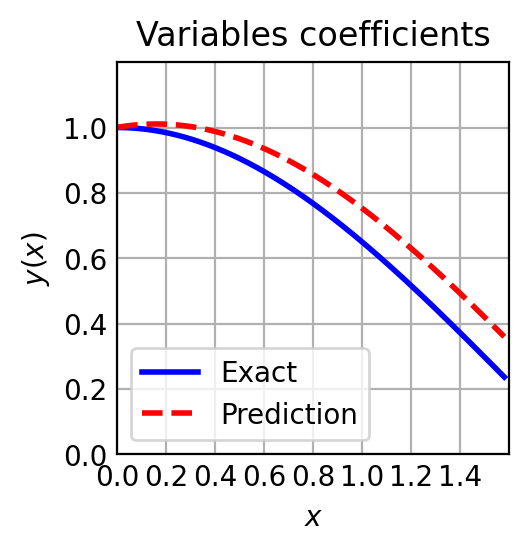

In [ ]:
plot_results(0.2,0.8)

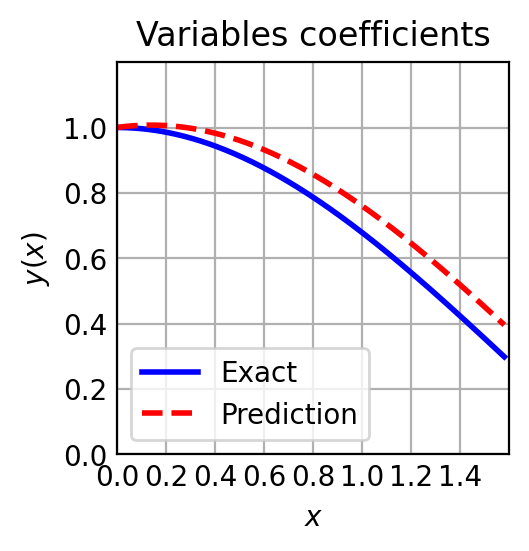

In [ ]:
plot_results(0.24,0.74)

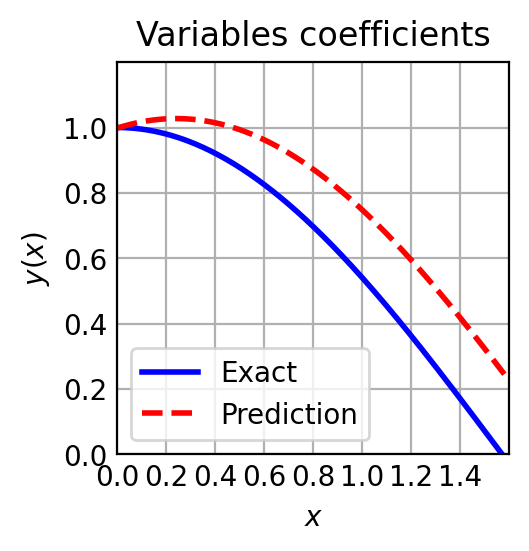

In [ ]:
plot_results(0,1)

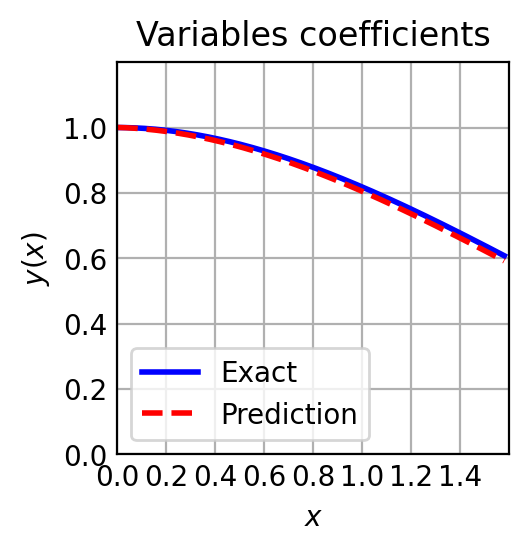

In [ ]:
plot_results(0.55,0.45)

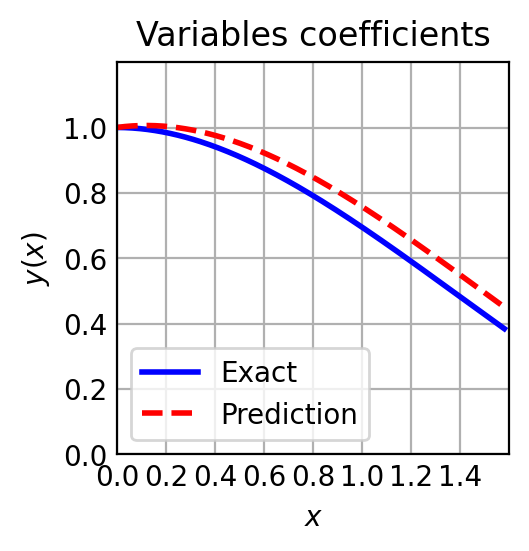

In [ ]:
plot_results(0.73,0.82)

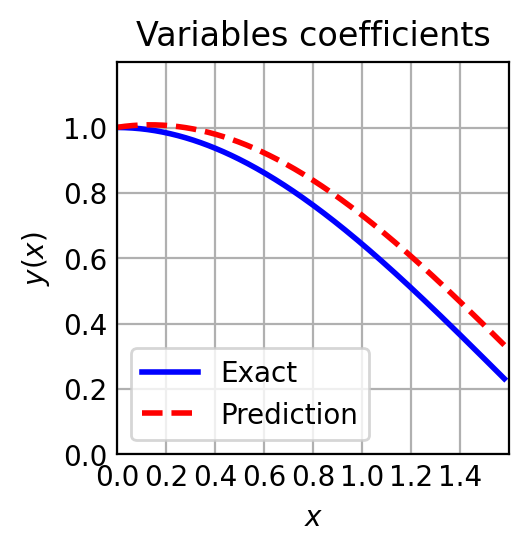

In [ ]:
plot_results(0.25,0.83)

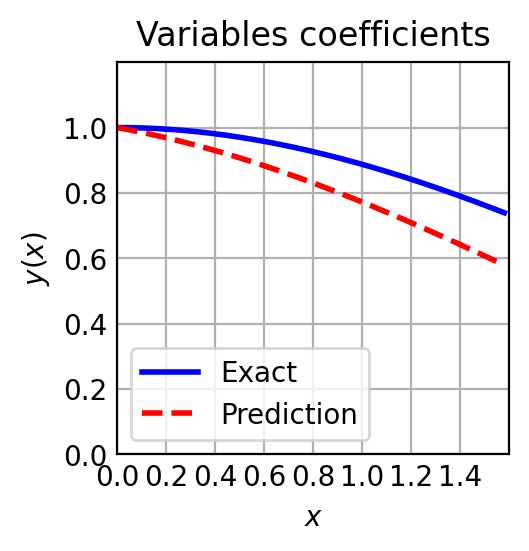

In [ ]:
plot_results(0.25,0.25)

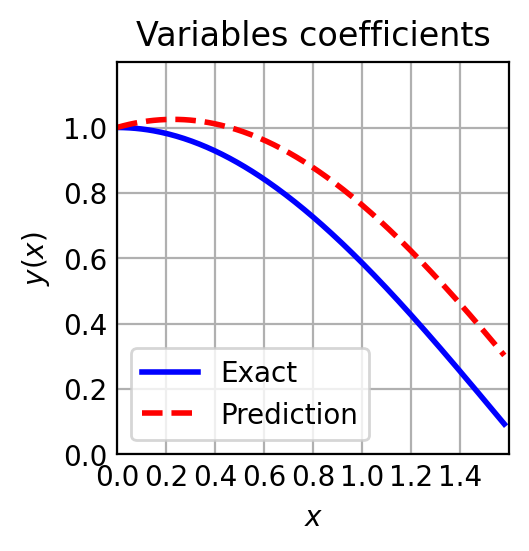

In [ ]:
plot_results(0.08,0.92)

##Saving Model (CHECKPOINT)

Compiling model...
Building feed-forward neural network...
'build' took 0.105470 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.193983 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [6.27e-03, 1.04e+00, 1.51e-02]    [5.65e-03, 1.04e+00, 1.51e-02]    [1.05e+00]    
Epoch 1: train loss improved from inf to 1.06e+00, saving model to ./model/model.ckpt-1.ckpt ...

1000      [5.78e-04, 1.86e-05, 4.43e-04]    [3.78e-04, 1.86e-05, 4.43e-04]    [1.92e-01]    
Epoch 1000: train loss improved from 1.06e+00 to 1.04e-03, saving model to ./model/model.ckpt-1000.ckpt ...

2000      [5.00e-04, 1.01e-05, 1.78e-04]    [3.45e-04, 1.01e-05, 1.78e-04]    [2.59e-01]    
Epoch 2000: train loss improved from 1.04e-03 to 6.89e-04, saving model to ./model/model.ckpt-2000.ckpt ...

3000      [3.81e-04, 8.12e-06, 1.38e-04]    [2.41e-04, 8.12e-06, 1.38e-04]    [2.54e-01]    
Epoch 3000: train loss improved from 6.89e-04 to 5.28e-04, saving model to ./model/model.ckpt-3000.ckpt ...

4000      [2.91e-04, 5.19e-06, 9.71e-05]    [1.81e-04, 5.19e-06,

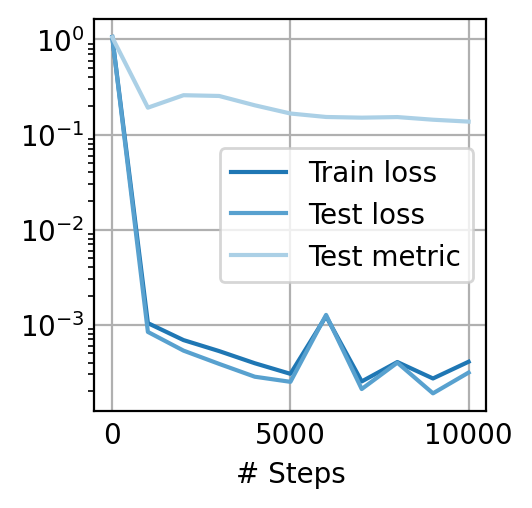

Compiling model...
'compile' took 0.441116 s

Training model...

Step      Train loss                        Test loss                         Test metric   
10000     [2.73e-04, 5.00e-05, 8.45e-05]    [1.79e-04, 5.00e-05, 8.45e-05]    [1.37e-01]    
11000     [2.56e-05, 1.55e-06, 8.01e-06]    [2.56e-05, 1.55e-06, 8.01e-06]                  
12000     [1.53e-05, 9.31e-07, 3.93e-06]    [1.53e-05, 9.31e-07, 3.93e-06]                  
13000     [1.04e-05, 8.34e-07, 3.35e-06]    [1.04e-05, 8.34e-07, 3.35e-06]                  
14000     [8.22e-06, 6.66e-07, 2.39e-06]    [8.22e-06, 6.66e-07, 2.39e-06]                  
15000     [7.28e-06, 4.02e-07, 1.70e-06]    [7.28e-06, 4.02e-07, 1.70e-06]                  
16000     [6.46e-06, 2.32e-07, 1.51e-06]    [6.46e-06, 2.32e-07, 1.51e-06]                  
17000     [5.94e-06, 2.20e-07, 1.40e-06]    [5.94e-06, 2.20e-07, 1.40e-06]                  
18000     [5.22e-06, 2.24e-07, 1.37e-06]    [5.22e-06, 2.24e-07, 1.37e-06]                  
18016

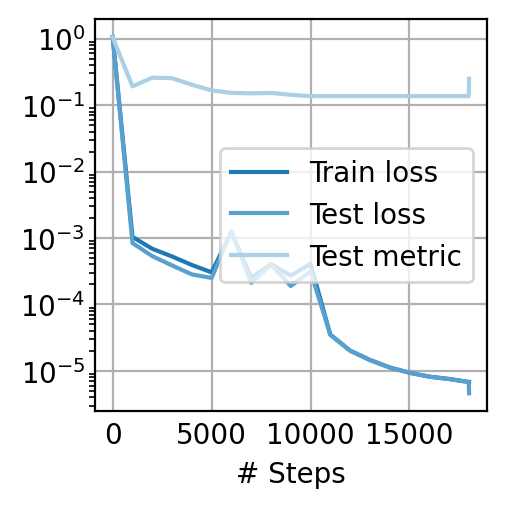

In [ ]:
#from deepxde.backend.jax.tensor import shape
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""
import deepxde as dde
from deepxde.backend import tf
import numpy as np

A,B = 0,1

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)



time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 6400, num_boundary = 1280, num_initial=1280, solution=func, num_test=4000)

layer_size = [3] + [256] * 4 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
'''
model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("./model/model.ckpt", verbose=1, save_better_only=True)
model.train(epochs=10000, callbacks=[checkpointer])
'''
model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
checkpointer = dde.callbacks.ModelCheckpoint("./model/model.ckpt", verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=10000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10000,
    maxfun=10000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

Training model...

Step      Train loss                        Test loss                         Test metric   
18058     [5.22e-06, 2.24e-07, 1.37e-06]    [3.01e-06, 2.24e-07, 1.37e-06]    [2.50e-01]    
18080     [5.22e-06, 2.24e-07, 1.37e-06]    [3.01e-06, 2.24e-07, 1.37e-06]    [2.50e-01]    

Best model at step 18016:
  train loss: 6.81e-06
  test loss: 4.60e-06
  test metric: [2.50e-01]

'train' took 3.766042 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


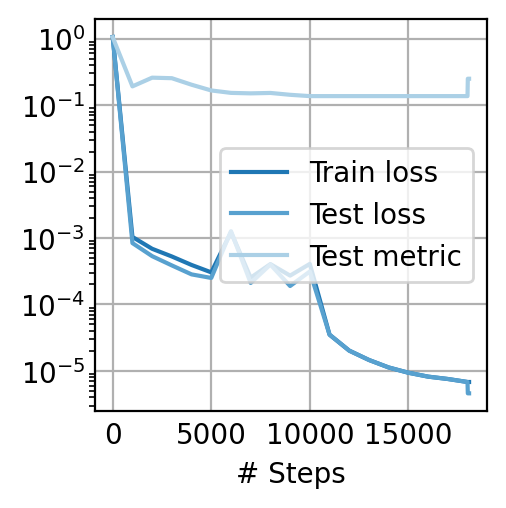

In [ ]:
#model.compile("L-BFGS", metrics=["l2 relative error"])
checkpointer2 = dde.callbacks.ModelCheckpoint("./model/model.ckpt", verbose=1, save_better_only=False, period=10)
losshistory, train_state = model.train(callbacks=[checkpointer2])

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

In [ ]:
import deepxde as dde
import numpy as np

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)




time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 6400, num_boundary = 1280, num_initial=1280, solution=func, num_test=4000)

layer_size = [3] + [256] * 4 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
#checkpointer = dde.callbacks.ModelCheckpoint("./model/model.ckpt", verbose=1, save_better_only=True)
#model.train(epochs=5000, callbacks=[checkpointer])



Using backend: tensorflow.compat.v1
Other supported backends: tensorflow, pytorch, jax, paddle.
paddle supports more examples now and is recommended.
Instructions for updating:
non-resource variables are not supported in the long term


Enable just-in-time compilation with XLA.



Compiling model...
Building feed-forward neural network...
'build' took 0.102246 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 2.340261 s



In [ ]:
#model.compile("adam", lr=0.001, metrics=["l2 relative error"])
model.restore("/content/drive/MyDrive/model/model.ckpt-5000.ckpt")

In [ ]:
model.predict(np.array([[0.1,0.1,1]]))

array([[0.5833357]], dtype=float32)

In [ ]:
model.predict(np.array([[0.1,0.1,1]]))

array([[0.5833357]], dtype=float32)

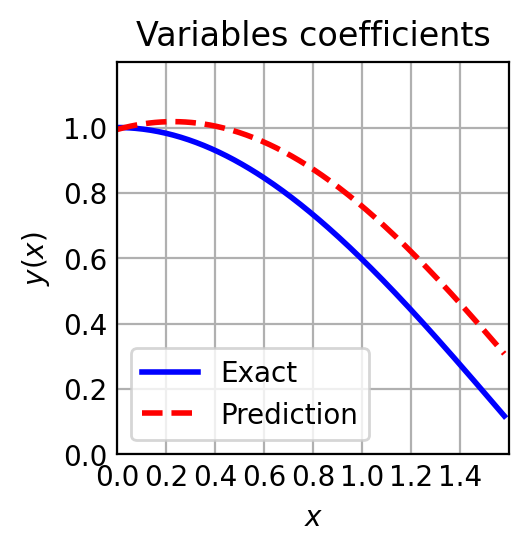

In [ ]:
plot_results(0.1,0.9)

In [ ]:
#model.compile("adam", lr=0.001, metrics=["l2 relative error"])#
checkpointer = dde.callbacks.ModelCheckpoint("./model2/model.ckpt", verbose=1, save_better_only=True)

Compiling model...
'compile' took 0.312159 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [7.42e-03, 8.30e-01, 1.03e-02]    [7.94e-03, 8.30e-01, 1.03e-02]    [1.00e+00]    
1000      [3.47e-04, 2.24e-05, 1.16e-04]    [3.47e-04, 2.24e-05, 1.16e-04]                  
2000      [1.21e-04, 1.61e-05, 6.35e-05]    [1.21e-04, 1.61e-05, 6.35e-05]                  
3000      [7.24e-05, 7.14e-06, 5.38e-05]    [7.24e-05, 7.14e-06, 5.38e-05]                  
4000      [5.29e-05, 3.07e-06, 2.20e-05]    [5.29e-05, 3.07e-06, 2.20e-05]                  
5000      [4.45e-05, 2.19e-06, 1.45e-05]    [4.45e-05, 2.19e-06, 1.45e-05]                  
6000      [4.03e-05, 1.73e-06, 1.12e-05]    [4.03e-05, 1.73e-06, 1.12e-05]                  
7000      [3.35e-05, 1.48e-06, 9.48e-06]    [3.35e-05, 1.48e-06, 9.48e-06]                  
8000      [2.80e-05, 7.28e-07, 7.83e-06]    [2.80e-05, 7.28e-07, 7.83e-06]                  
9000 

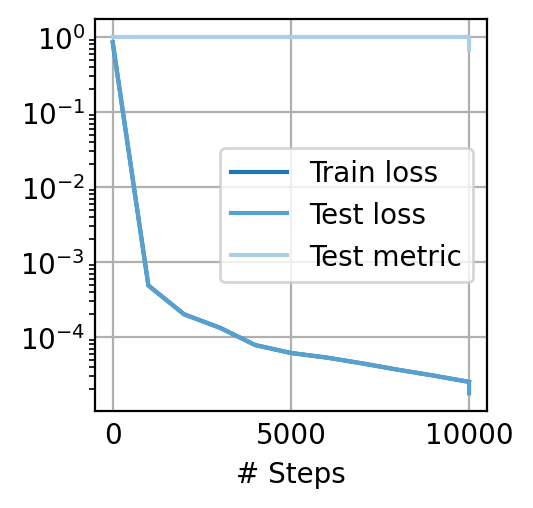

In [ ]:
dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=10000,
    maxfun=10000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

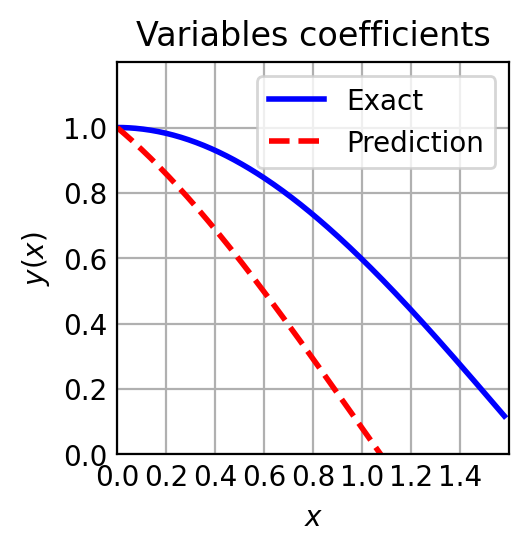

In [ ]:
plot_results(0.1,0.9)

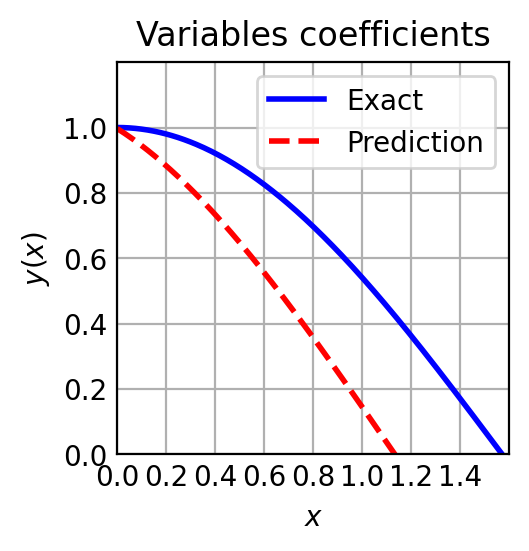

In [ ]:
plot_results(0.0,1)

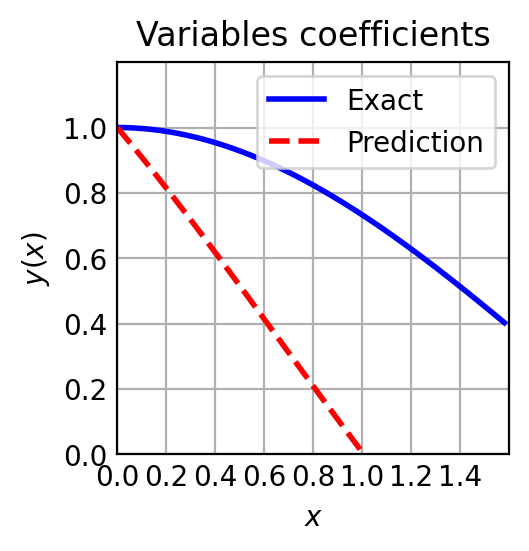

In [ ]:
plot_results(0.2,0.6)

Compiling model...
'compile' took 1.013077 s

Training model...

Step      Train loss                        Test loss                         Test metric   
10001     [1.88e-05, 1.13e-06, 5.29e-06]    [1.13e-05, 1.13e-06, 5.29e-06]    [6.81e-01]    
11000     [1.65e-05, 9.02e-07, 4.28e-06]    [1.65e-05, 9.02e-07, 4.28e-06]                  
12000     [1.36e-05, 1.22e-06, 3.76e-06]    [1.36e-05, 1.22e-06, 3.76e-06]                  
13000     [1.21e-05, 9.51e-07, 3.19e-06]    [1.21e-05, 9.51e-07, 3.19e-06]                  
14000     [1.08e-05, 3.69e-07, 2.89e-06]    [1.08e-05, 3.69e-07, 2.89e-06]                  
15000     [9.48e-06, 3.51e-07, 2.53e-06]    [9.48e-06, 3.51e-07, 2.53e-06]                  
15276     [9.16e-06, 4.04e-07, 2.48e-06]    [4.33e-06, 4.04e-07, 2.48e-06]    [6.62e-01]    

Best model at step 15276:
  train loss: 1.20e-05
  test loss: 7.21e-06
  test metric: [6.62e-01]

Epoch 15276: saving model to /content/drive/MyDrive/trained_models-15276.ckpt ...

'train' t

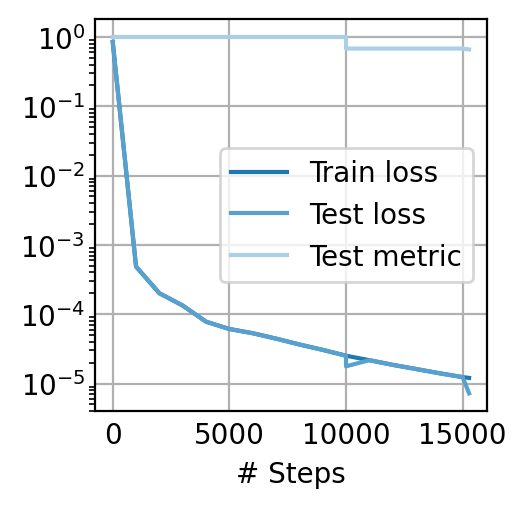

In [ ]:
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

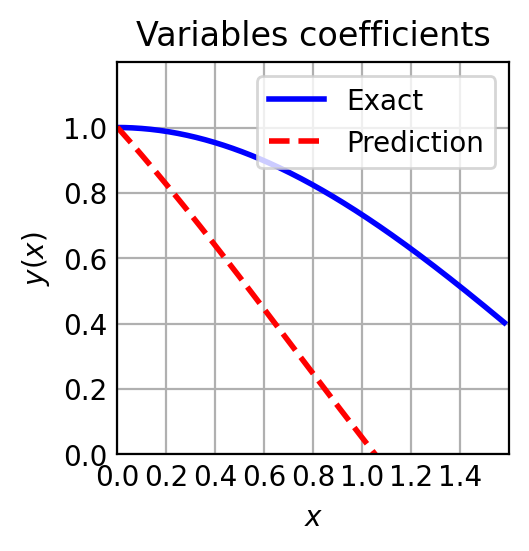

In [ ]:
plot_results(0.2,0.6)

##Savepath (usado em otimizadores que não permitem "checkpoints"

In [ ]:
import deepxde as dde
import numpy as np

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)




time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 6400, num_boundary = 1280, num_initial=1280, solution=func, num_test=4000)

layer_size = [3] + [256] * 4 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])

Compiling model...
Building feed-forward neural network...
'build' took 0.144237 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 5.034535 s



###Usando "restore" ´possivel fazer predições, mas não é possivel continuar o treinamento

In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
#model.restore("/content/drive/MyDrive/trained_models-15276.ckpt")
#model.restore("/content/drive/MyDrive/model/model.ckpt-5000")
model.restore("/content/drive/MyDrive/model/model.ckpt-5000.ckpt")

Compiling model...
'compile' took 0.851752 s



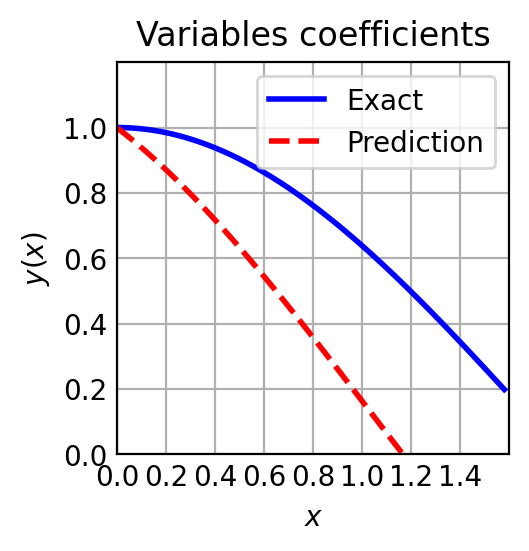

In [ ]:
plot_results(0.1,0.8)

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [2.44e-03, 1.12e+00, 1.47e-02]    [2.03e-03, 1.12e+00, 1.47e-02]    [1.00e+00]    
Epoch 1: train loss improved from inf to 1.14e+00, saving model to /content/drive/MyDrive/trained_models/model_pretrained-1.ckpt ...

1000      [5.66e-04, 1.38e-05, 3.44e-04]    [3.84e-04, 1.38e-05, 3.44e-04]    [1.97e-01]    
Epoch 1000: train loss improved from 1.14e+00 to 9.24e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained-1000.ckpt ...

2000      [4.46e-04, 1.22e-05, 2.23e-04]    [3.10e-04, 1.22e-05, 2.23e-04]    [2.53e-01]    
Epoch 2000: train loss improved from 9.24e-04 to 6.82e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained-2000.ckpt ...

3000      [4.50e-04, 4.04e-04, 5.12e-04]    [4.76e-04, 4.04e-04, 5.12e-04]    [2.22e-01]    
4000      [2.30e-04, 8.14e-05, 1.85e-04]    [1.57e-04, 8.14e-05, 1.85e-04]    [1.79e-01]    

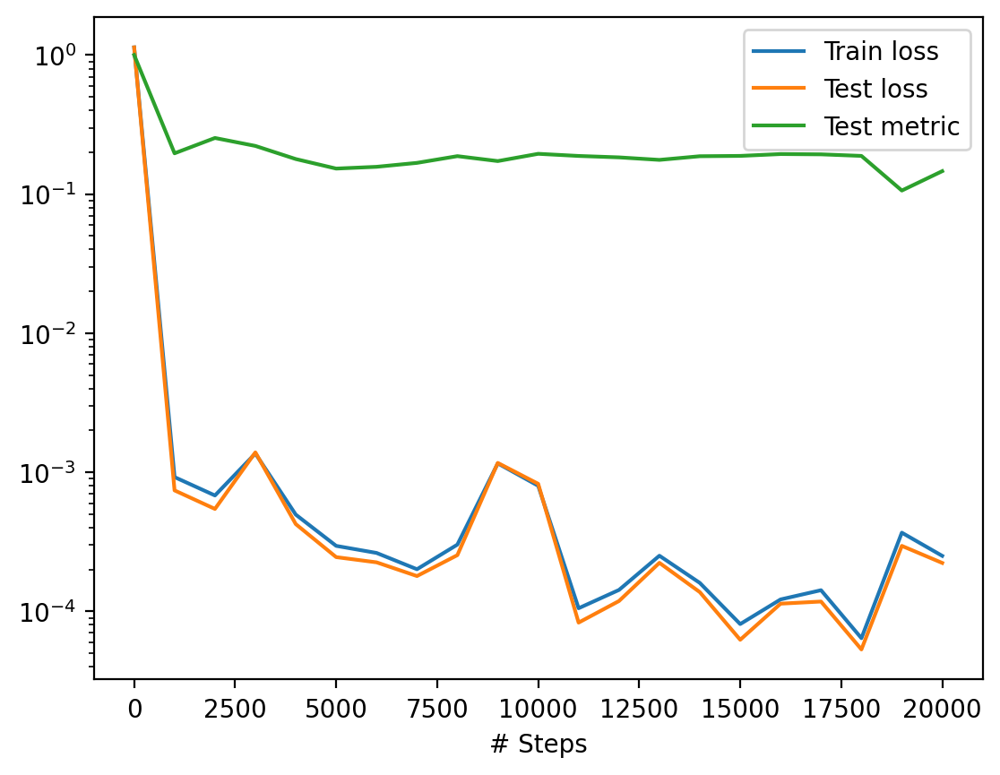

In [ ]:
#model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained", verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=20000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

###Transfer learning

Restoring model from /content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt ...

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [4.78e-05, 1.82e-06, 1.67e-05]    [3.71e-05, 1.82e-06, 1.67e-05]    [1.88e-01]    
Epoch 1: train loss improved from inf to 6.63e-05, saving model to /content/drive/MyDrive/trained_models/model_pretrained-1.ckpt ...

1000      [6.71e-05, 2.08e-06, 1.82e-05]    [4.94e-05, 2.08e-06, 1.82e-05]    [1.13e-01]    
2000      [1.37e-04, 3.44e-06, 2.97e-05]    [1.06e-04, 3.44e-06, 2.97e-05]    [1.30e-01]    
3000      [8.18e-05, 3.00e-06, 1.64e-05]    [6.50e-05, 3.00e-06, 1.64e-05]    [2.00e-01]    
4000      [5.77e-05, 1.48e-05, 4.07e-05]    [4.47e-05, 1.48e-05, 4.07e-05]    [2.14e-01]    
5000      [1.56e-04, 3.10e-05, 6.04e-05]    [1.07e-04, 3.10e-05, 6.04e-05]    [2.16e-01]    
6000      [4.37e-05, 1.99e-06, 1.01e-05]    [3.10e-05, 1.99e-06, 1.01e-05]    [2.19e-01]    
Epoch 6000:

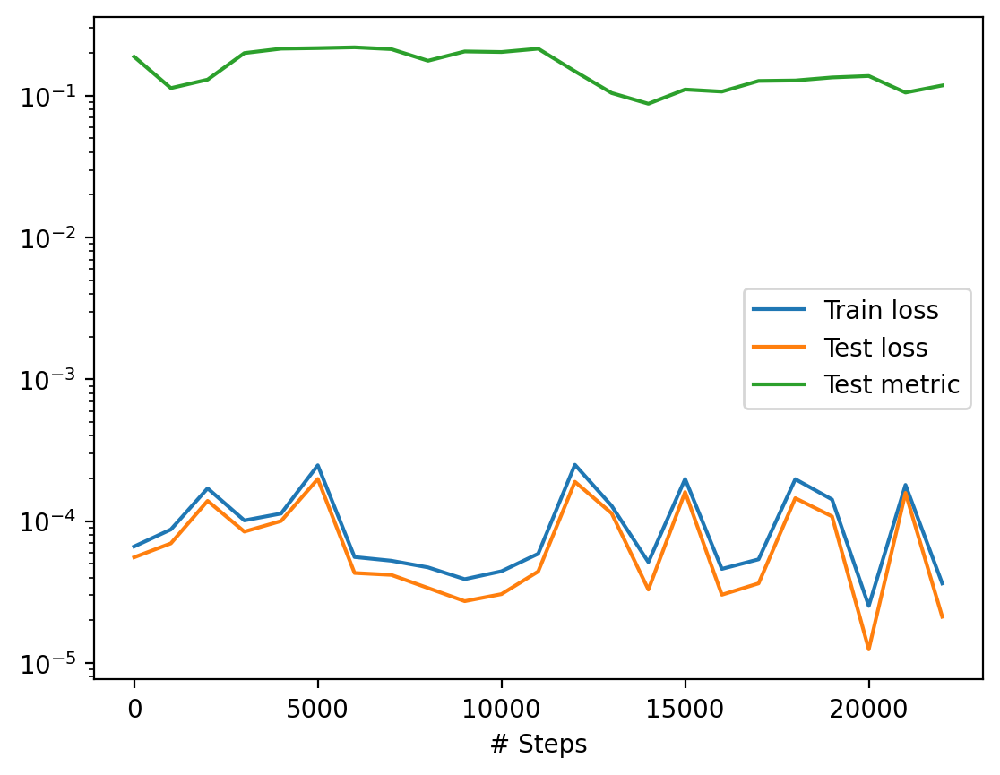

In [ ]:
#model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained", verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=22000, callbacks=[checkpointer],model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

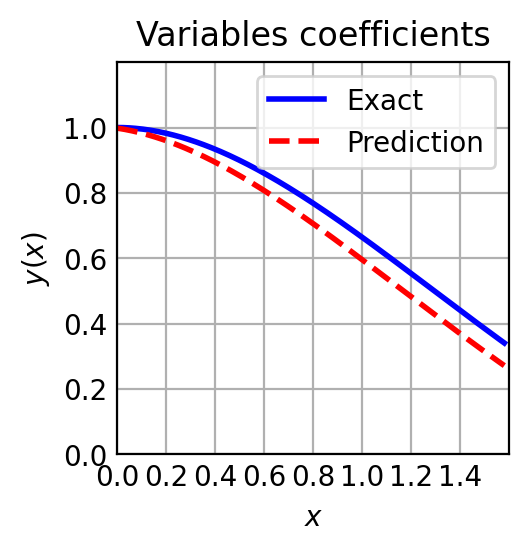

In [ ]:
plot_results(0.84,0.94)

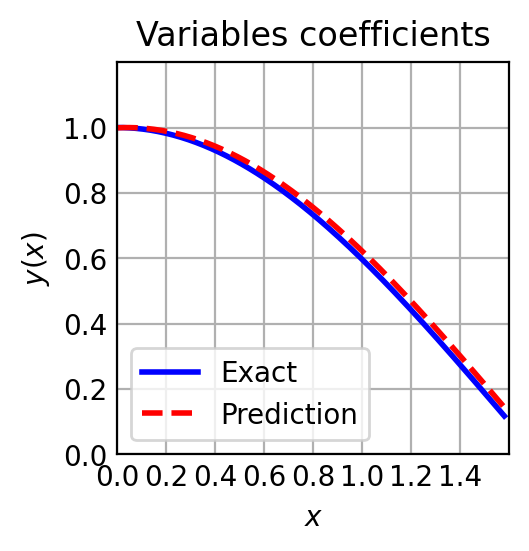

In [ ]:
plot_results(0.1,0.9)

###restoring Pre-treined model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import deepxde as dde
import numpy as np

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)




time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 6400, num_boundary = 1280, num_initial=1280, solution=func, num_test=4000)

layer_size = [3] + [256] * 4 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)

In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
#model.restore("/content/drive/MyDrive/trained_models-15276.ckpt")
#model.restore("/content/drive/MyDrive/model/model.ckpt-5000")
model.restore("/content/drive/MyDrive/trained_models/model_pretrained-20000.ckpt")#modelo treinado (18+20) 10e3 vezes

Compiling model...
Building feed-forward neural network...
'build' took 0.110109 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 3.606697 s



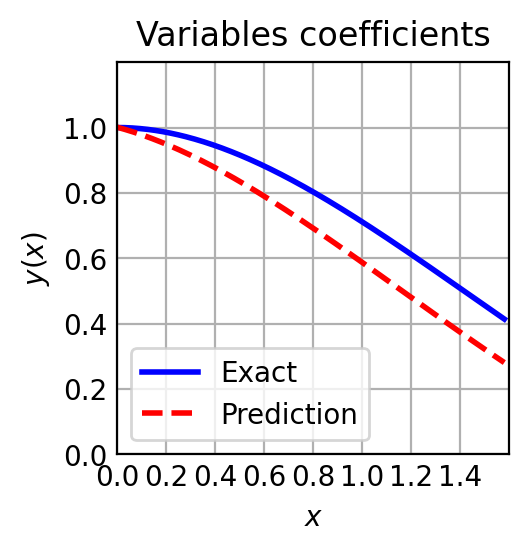

In [ ]:
plot_results(0.72,0.77)

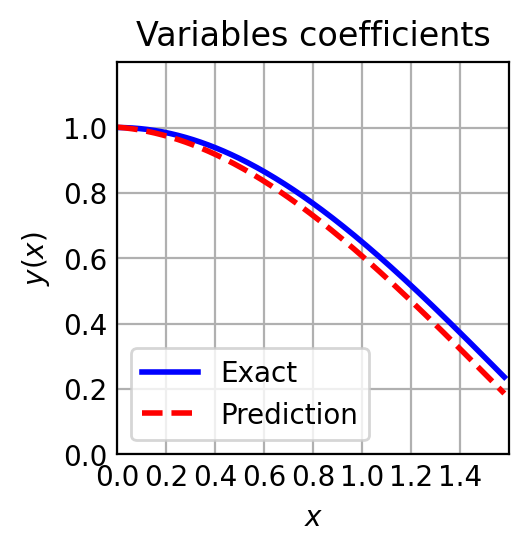

In [ ]:
plot_results(0.2,0.8)

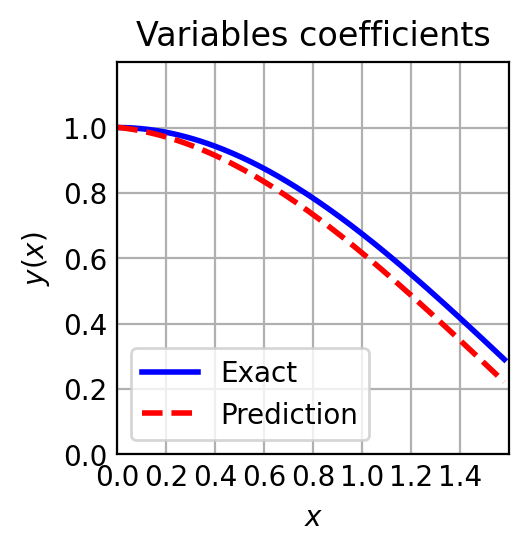

In [ ]:
plot_results(0.24,0.75)

#Expandindo Rede e parametros


In [ ]:
import deepxde as dde
import numpy as np

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)




time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial)

data = dde.data.TimePDE(geomtime, pde, [bc_l, bcd_l], num_domain = 6400, num_boundary = 1280, num_initial=1280, solution=func, num_test=4000)

layer_size = [3] + [512] * 8 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)



Using backend: tensorflow.compat.v1
Other supported backends: tensorflow, pytorch, jax, paddle.
paddle supports more examples now and is recommended.
Instructions for updating:
non-resource variables are not supported in the long term


Enable just-in-time compilation with XLA.



In [ ]:
model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained_robust", verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=100000, callbacks=[checkpointer])#,model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt"
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

In [ ]:
model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained_robust_2", verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=100000, callbacks=[checkpointer], model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained_robust-5000.ckpt")#,model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt"
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


Compiling model...
Building feed-forward neural network...
'build' took 0.147205 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 2.834447 s

Restoring model from /content/drive/MyDrive/trained_models/model_pretrained_robust-5000.ckpt ...

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [3.53e-04, 5.14e-05, 2.50e-04]    [1.50e-04, 5.14e-05, 2.50e-04]    [1.14e-01]    
Epoch 1: train loss improved from inf to 6.54e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_2-1.ckpt ...

1000      [2.20e-04, 1.69e-05, 9.65e-05]    [1.36e-04, 1.69e-05, 9.65e-05]    [7.84e-02]    
Epoch 1000: train loss improved from 6.54e-04 to 3.33e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_2-1000.ckpt ...

2000      [1.92e-01, 6.47e-02, 8.21e-11]    [1.75e-01, 6.47e-02, 8.21e-11]    [2.40e-01]    
3000      [1.90e-01, 6.58e-02, 1.99e-08]    [1.73e-01, 6.58e-02, 1.99e-08]    [2.41e-01]    


KeyboardInterrupt: ignored

Compiling model...
Building feed-forward neural network...
'build' took 0.198951 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 2.948945 s

Restoring model from /content/drive/MyDrive/trained_models/model_pretrained_robust_2-1000.ckpt ...

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [2.18e-04, 1.69e-05, 1.05e-04]    [1.36e-04, 1.69e-05, 1.05e-04]    [7.82e-02]    
Epoch 1: train loss improved from inf to 3.40e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_3-1.ckpt ...

1000      [3.17e-04, 1.38e-05, 1.22e-04]    [2.20e-04, 1.38e-05, 1.22e-04]    [8.38e-02]    
2000      [2.80e-04, 2.54e-05, 1.67e-04]    [1.49e-04, 2.54e-05, 1.67e-04]    [8.66e-02]    

Best model at step 0:
  train loss: 3.40e-04
  test loss: 2.58e-04
  test metric: [7.82e-02]

'train' took 333.160879 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


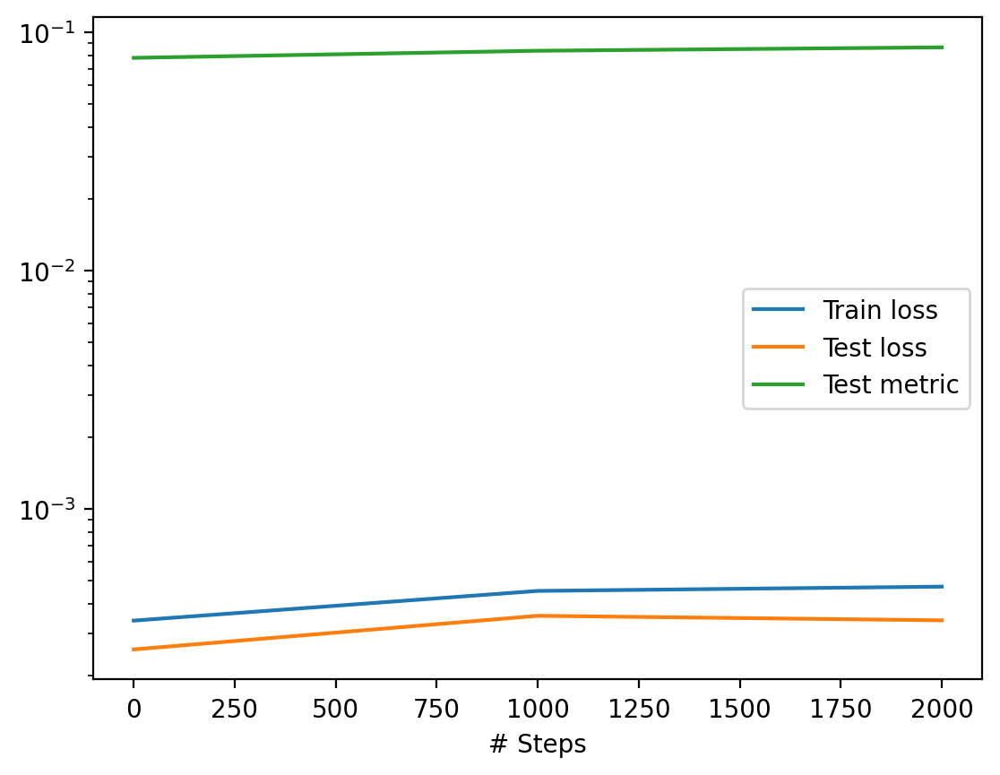

In [ ]:
model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained_robust_3",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=2000, callbacks=[checkpointer], model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_2-1000.ckpt")#,model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt"
dde.saveplot(losshistory, train_state, issave=True, isplot=True)




In [ ]:
losshistory, train_state = model.train(iterations=5000, callbacks=[checkpointer])

Training model...

Step      Train loss                        Test loss                         Test metric   
2000      [2.80e-04, 2.54e-05, 1.67e-04]    [1.49e-04, 2.54e-05, 1.67e-04]    [8.66e-02]    
3000      [1.26e-01, 1.02e-02, 8.16e-04]    [1.10e-01, 1.02e-02, 8.16e-04]    [2.22e-01]    
4000      [1.22e-04, 1.41e-05, 3.08e-05]    [6.59e-05, 1.41e-05, 3.08e-05]    [9.68e-02]    
Epoch 4000: train loss improved from 3.40e-04 to 1.66e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_3-4000.ckpt ...

5000      [1.13e-01, 1.76e-01, 7.26e-07]    [1.03e-01, 1.76e-01, 7.26e-07]    [3.79e-01]    
6000      [1.85e-01, 7.09e-02, 1.38e-08]    [1.69e-01, 7.09e-02, 1.38e-08]    [2.48e-01]    
7000      [1.91e-01, 6.58e-02, 3.62e-18]    [1.74e-01, 6.58e-02, 3.62e-18]    [2.42e-01]    

Best model at step 4000:
  train loss: 1.66e-04
  test loss: 1.11e-04
  test metric: [9.68e-02]

'train' took 793.272055 s



Restoring model from /content/drive/MyDrive/trained_models/model_pretrained_robust_2-1000.ckpt ...

Training model...

Step      Train loss                        Test loss                         Test metric   
12078     [2.18e-04, 1.69e-05, 1.05e-04]    [1.36e-04, 1.69e-05, 1.05e-04]    [7.82e-02]    

Best model at step 4000:
  train loss: 1.66e-04
  test loss: 1.11e-04
  test metric: [9.68e-02]

'train' took 0.873443 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


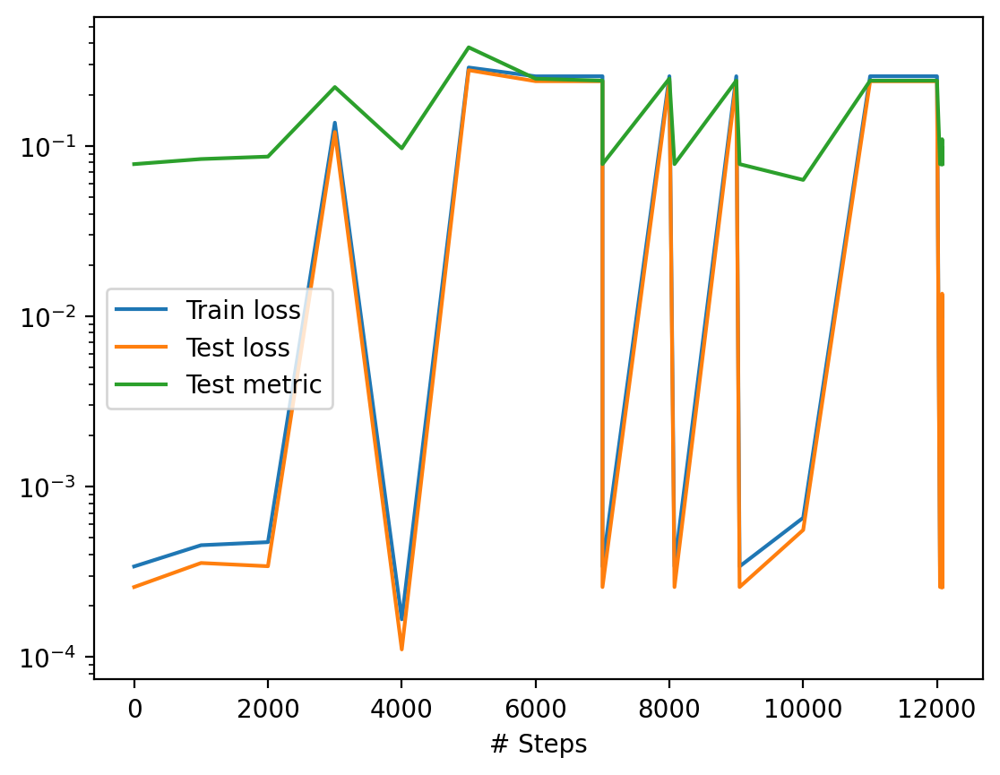

In [ ]:
losshistory, train_state = model.train(iterations=0, callbacks=[checkpointer], model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_2-1000.ckpt")#,model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt"
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


In [ ]:
dde.metrics.l2_relative_error(func(make_X(0.2,0.7)), model.predict(make_X(0.2,0.7)))

0.004019900222256104

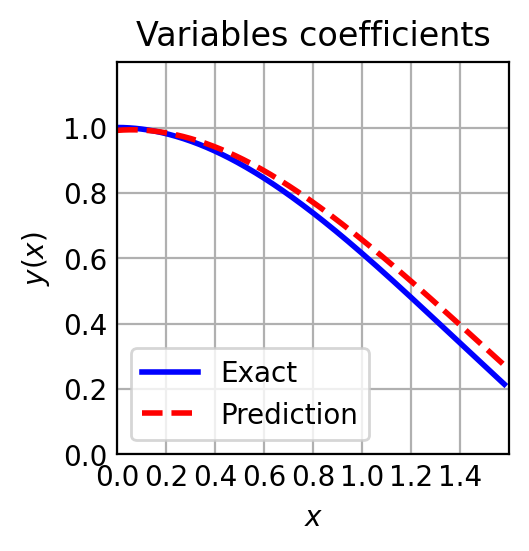

In [ ]:
plot_results(0.5,0.98)

Compiling model...
Building feed-forward neural network...
'build' took 0.183727 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 2.588616 s

Restoring model from /content/drive/MyDrive/trained_models/model_pretrained_robust_2-1000.ckpt ...

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [2.20e-04, 1.69e-05, 8.77e-05]    [1.36e-04, 1.69e-05, 8.77e-05]    [7.78e-02]    
Epoch 10: train loss improved from inf to 3.25e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-10.ckpt ...

1000      [3.77e-04, 2.05e-04, 1.08e-04]    [2.59e-04, 2.05e-04, 1.08e-04]    [1.05e-01]    
2000      [2.98e-04, 7.54e-05, 9.25e-05]    [2.09e-04, 7.54e-05, 9.25e-05]    [9.97e-02]    
3000      [1.56e-04, 9.20e-06, 5.74e-05]    [8.62e-05, 9.20e-06, 5.74e-05]    [6.92e-02]    
Epoch 3000: train loss improved from 3.25e-04 to 2.22e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-3000.ckpt ...


Best model at step 3000:
  train loss: 2.22e-04
  test loss: 1.53e-04
  test metric: [6.9

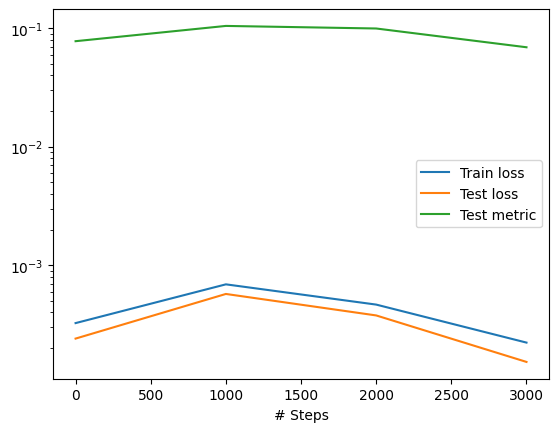

Compiling model...
'compile' took 0.457729 s

Training model...

Step      Train loss                        Test loss                         Test metric   
3000      [1.56e-04, 9.20e-06, 5.74e-05]    [8.62e-05, 9.20e-06, 5.74e-05]    [6.92e-02]    
3104      [1.00e-04, 2.52e-06, 3.24e-05]    [7.00e-05, 2.52e-06, 3.24e-05]    [5.96e-02]    

Best model at step 3104:
  train loss: 1.35e-04
  test loss: 1.05e-04
  test metric: [5.96e-02]

Epoch 3104: saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-3104.ckpt ...

'train' took 102.613156 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


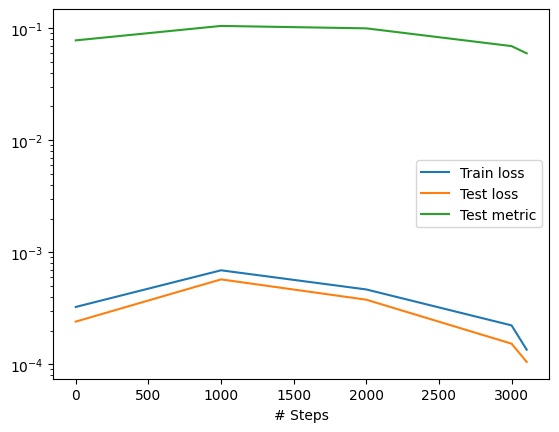

Compiling model...
'compile' took 1.045033 s

Training model...

Step      Train loss                        Test loss                         Test metric   
3104      [1.00e-04, 2.52e-06, 3.24e-05]    [7.00e-05, 2.52e-06, 3.24e-05]    [5.96e-02]    
Epoch 3114: train loss improved from inf to 1.35e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-3114.ckpt ...

4000      [1.30e-04, 4.71e-06, 7.72e-05]    [7.00e-05, 4.71e-06, 7.72e-05]    [6.43e-02]    
5000      [3.78e-04, 7.60e-05, 1.49e-04]    [2.43e-04, 7.60e-05, 1.49e-04]    [1.02e-01]    
6000      [4.75e-04, 3.06e-04, 3.93e-05]    [2.29e-04, 3.06e-04, 3.93e-05]    [7.38e-02]    
6104      [5.22e-02, 5.26e-02, 2.83e-04]    [4.94e-02, 5.26e-02, 2.83e-04]    [2.06e-01]    

Best model at step 3104:
  train loss: 1.35e-04
  test loss: 1.05e-04
  test metric: [5.96e-02]

Epoch 6104: saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-6104.ckpt ...

'train' took 498.028955

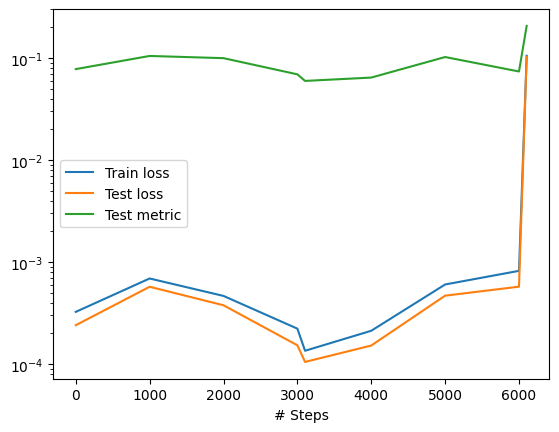

Compiling model...
'compile' took 0.493128 s

Training model...

Step      Train loss                        Test loss                         Test metric   
6104      [5.22e-02, 5.26e-02, 2.83e-04]    [4.94e-02, 5.26e-02, 2.83e-04]    [2.06e-01]    
6211      [5.82e-04, 2.55e-05, 5.13e-04]    [3.58e-04, 2.55e-05, 5.13e-04]    [3.90e-02]    

Best model at step 3104:
  train loss: 1.35e-04
  test loss: 1.05e-04
  test metric: [5.96e-02]

Epoch 6211: saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-6211.ckpt ...

'train' took 102.907210 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


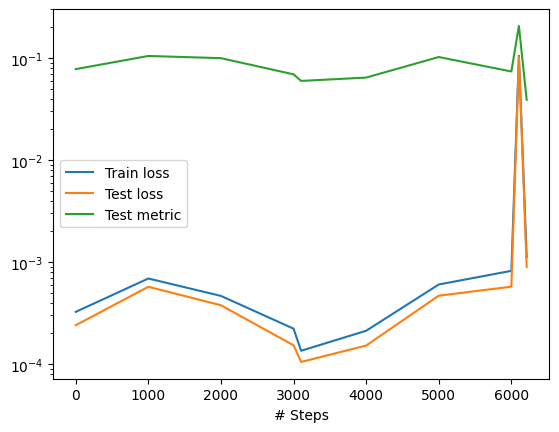

Compiling model...
'compile' took 1.087784 s

Training model...

Step      Train loss                        Test loss                         Test metric   
6211      [5.82e-04, 2.55e-05, 5.13e-04]    [3.58e-04, 2.55e-05, 5.13e-04]    [3.90e-02]    
Epoch 6221: train loss improved from inf to 1.12e-03, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-6221.ckpt ...

7000      [1.26e-01, 7.98e-02, 5.54e-03]    [1.24e-01, 7.98e-02, 5.54e-03]    [2.36e-01]    
8000      [6.72e-04, 2.63e-05, 3.12e-04]    [4.23e-04, 2.63e-05, 3.12e-04]    [1.42e-01]    
Epoch 8001: train loss improved from 1.12e-03 to 1.01e-03, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-8001.ckpt ...

9000      [4.44e-04, 1.15e-05, 1.08e-04]    [2.48e-04, 1.15e-05, 1.08e-04]    [1.38e-01]    
Epoch 9001: train loss improved from 1.01e-03 to 5.64e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-9001.ckpt ...

9211      [4.

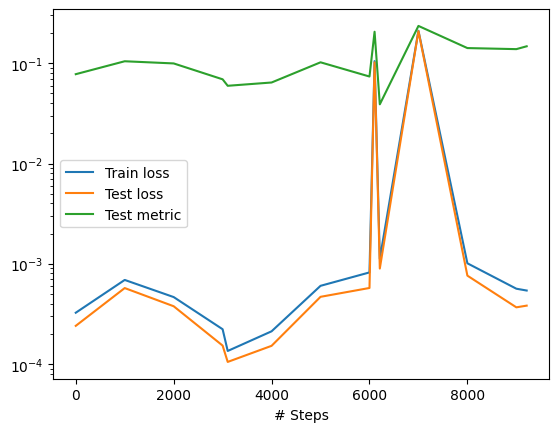

Compiling model...
'compile' took 0.487716 s

Training model...

Step      Train loss                        Test loss                         Test metric   
9211      [4.19e-04, 1.58e-05, 1.06e-04]    [2.61e-04, 1.58e-05, 1.06e-04]    [1.48e-01]    
9315      [3.00e-04, 6.32e-06, 7.19e-05]    [1.81e-04, 6.32e-06, 7.19e-05]    [1.06e-01]    

Best model at step 3104:
  train loss: 1.35e-04
  test loss: 1.05e-04
  test metric: [5.96e-02]

Epoch 9315: saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-9315.ckpt ...

'train' took 102.034533 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


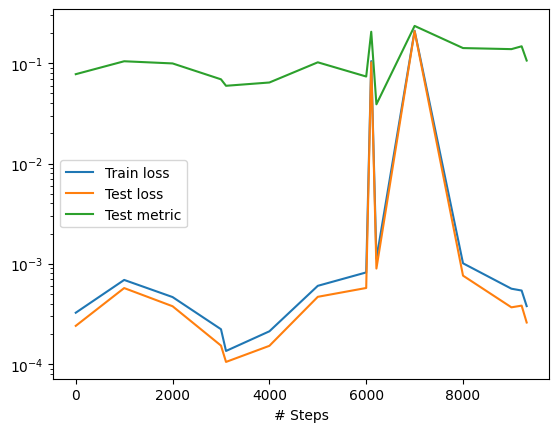

Compiling model...
'compile' took 0.774145 s

Training model...

Step      Train loss                        Test loss                         Test metric   
9315      [3.00e-04, 6.32e-06, 7.19e-05]    [1.81e-04, 6.32e-06, 7.19e-05]    [1.06e-01]    
Epoch 9325: train loss improved from inf to 3.78e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-9325.ckpt ...

10000     [2.03e-01, 4.14e-02, 3.03e-05]    [1.93e-01, 4.14e-02, 3.03e-05]    [2.14e-01]    
11000     [1.91e-01, 6.58e-02, 2.01e-19]    [1.74e-01, 6.58e-02, 2.01e-19]    [2.42e-01]    
12000     [1.91e-01, 6.58e-02, 2.26e-19]    [1.74e-01, 6.58e-02, 2.26e-19]    [2.42e-01]    
12315     [1.91e-01, 6.58e-02, 2.41e-19]    [1.74e-01, 6.58e-02, 2.41e-19]    [2.42e-01]    

Best model at step 3104:
  train loss: 1.35e-04
  test loss: 1.05e-04
  test metric: [5.96e-02]

Epoch 12315: saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-12315.ckpt ...

'train' took 492.1326

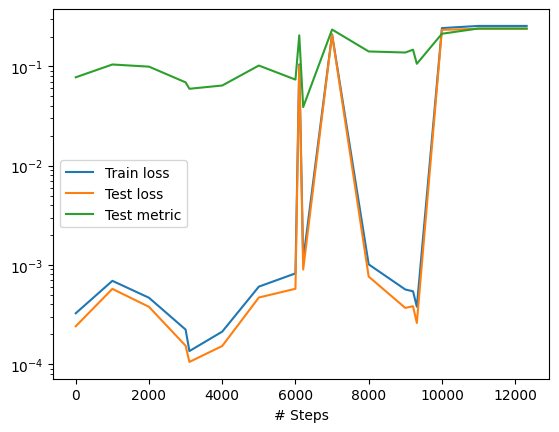

Compiling model...
'compile' took 0.508650 s

Training model...

Step      Train loss                        Test loss                         Test metric   
12315     [1.91e-01, 6.58e-02, 2.41e-19]    [1.74e-01, 6.58e-02, 2.41e-19]    [2.42e-01]    
12323     [1.91e-01, 6.58e-02, 2.41e-19]    [1.74e-01, 6.58e-02, 2.41e-19]    [2.42e-01]    

Best model at step 3104:
  train loss: 1.35e-04
  test loss: 1.05e-04
  test metric: [5.96e-02]

Epoch 12323: saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-12323.ckpt ...

'train' took 11.630808 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


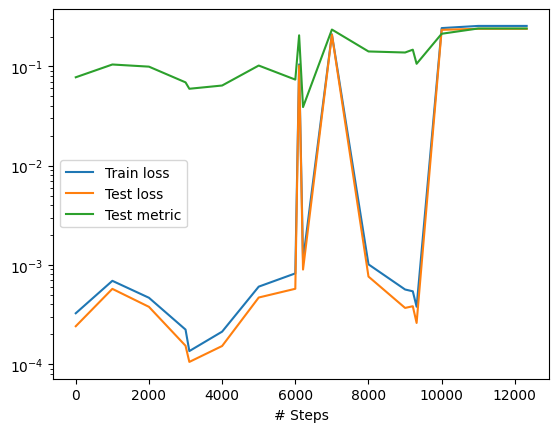

Compiling model...
'compile' took 0.823446 s

Training model...

Step      Train loss                        Test loss                         Test metric   
12323     [1.91e-01, 6.58e-02, 2.41e-19]    [1.74e-01, 6.58e-02, 2.41e-19]    [2.42e-01]    
Epoch 12333: train loss improved from inf to 2.57e-01, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-12333.ckpt ...

13000     [1.91e-01, 6.58e-02, 3.85e-24]    [1.74e-01, 6.58e-02, 3.85e-24]    [2.42e-01]    
14000     [1.82e-01, 7.49e-02, 5.14e-22]    [1.66e-01, 7.49e-02, 5.14e-22]    [2.53e-01]    
15000     [1.91e-01, 6.59e-02, 4.50e-26]    [1.74e-01, 6.59e-02, 4.50e-26]    [2.42e-01]    
15323     [1.91e-01, 6.58e-02, 5.58e-26]    [1.74e-01, 6.58e-02, 5.57e-26]    [2.42e-01]    

Best model at step 3104:
  train loss: 1.35e-04
  test loss: 1.05e-04
  test metric: [5.96e-02]

Epoch 15323: saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-15323.ckpt ...

'train' took 491.41

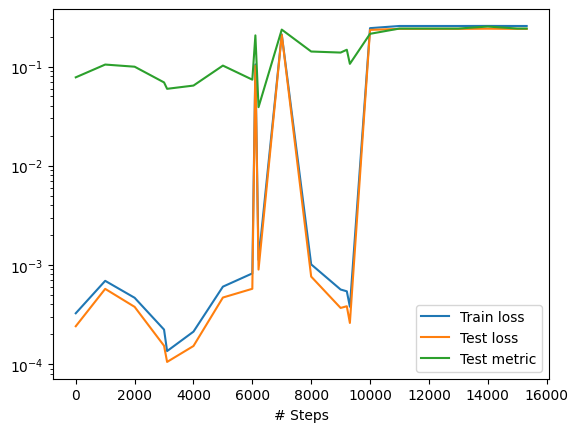

Compiling model...
'compile' took 0.534259 s

Training model...

Step      Train loss                        Test loss                         Test metric   
15323     [1.91e-01, 6.58e-02, 5.58e-26]    [1.74e-01, 6.58e-02, 5.57e-26]    [2.42e-01]    
15337     [1.91e-01, 6.58e-02, 5.58e-26]    [1.74e-01, 6.58e-02, 5.57e-26]    [2.42e-01]    

Best model at step 3104:
  train loss: 1.35e-04
  test loss: 1.05e-04
  test metric: [5.96e-02]

Epoch 15337: saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_4-15337.ckpt ...

'train' took 13.146057 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


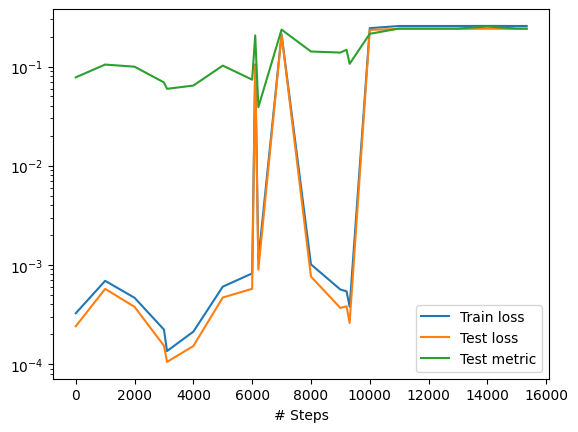

In [ ]:
model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained_robust_4",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer], model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_2-1000.ckpt")#,model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt"
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=100,
    maxfun=30000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_4")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained_robust_4",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer],model_save_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_4")#,model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt"
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=100,
    maxfun=30000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_4")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained_robust_4",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer],model_save_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_4")#,model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt"
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=100,
    maxfun=30000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_4")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained_robust_4",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer],model_save_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_4")#,model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt"
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=100,
    maxfun=30000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_4")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained_robust_4",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer],model_save_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_4")#,model_restore_path="/content/drive/MyDrive/trained_models/model_pretrained-18000.ckpt"
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=100,
    maxfun=30000,
    maxls=50,
)
model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models/model_pretrained_robust_4")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)




##Showing that it is already implemented random imput:

In [ ]:
import deepxde as dde
import numpy as np

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    print(x)
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)

def derivative_func(x, y, _):
    return dde.grad.jacobian(y, x, i=0, j=2)



def boundary(x,_):
    #if(np.isclose(x[2],0)):
    #    print("Os valores de x são: ", x)
    return np.isclose(x[2],0)

time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial, component=0)
ic_2 = dde.icbc.OperatorBC(
    geomtime,
    lambda x, y, _: dde.grad.jacobian(y, x, i=0, j=2) - 0,
    boundary
)
data = dde.data.TimePDE(geomtime, pde, [bc_l, ic_2], num_domain = 8, num_boundary = 0, num_initial=2, solution=func, num_test=None, train_distribution="pseudo")

layer_size = [3] + [512] * 8 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)



[[0.6001813  0.03933648 0.        ]
 [0.06832989 0.7918988  0.        ]
 [0.6001813  0.03933648 0.        ]
 [0.06832989 0.7918988  0.        ]
 [0.6001813  0.03933648 0.        ]
 [0.06832989 0.7918988  0.        ]
 [0.21556635 0.5736532  0.04329125]
 [0.8660436  0.5130536  1.2624956 ]
 [0.7160372  0.90902114 0.06877258]
 [0.39887756 0.45386466 0.45612064]
 [0.5631979  0.33944422 0.52668023]
 [0.1163501  0.70103735 0.63392836]
 [0.77224874 0.32429558 0.45371142]
 [0.72191685 0.20420338 1.1899925 ]]
[[0.6001813  0.03933648 0.        ]
 [0.06832989 0.7918988  0.        ]
 [0.6001813  0.03933648 0.        ]
 [0.06832989 0.7918988  0.        ]
 [0.6001813  0.03933648 0.        ]
 [0.06832989 0.7918988  0.        ]
 [0.21556635 0.5736532  0.04329125]
 [0.8660436  0.5130536  1.2624956 ]
 [0.7160372  0.90902114 0.06877258]
 [0.39887756 0.45386466 0.45612064]
 [0.5631979  0.33944422 0.52668023]
 [0.1163501  0.70103735 0.63392836]
 [0.77224874 0.32429558 0.45371142]
 [0.72191685 0.20420338 1.1

In [ ]:
import deepxde as dde
import numpy as np

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    print(x)
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)

def derivative_func(x, y, _):
    return dde.grad.jacobian(y, x, i=0, j=2)



def boundary(x,_):
    #if(np.isclose(x[2],0)):
    #    print("Os valores de x são: ", x)
    return np.isclose(x[2],0)

time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial, component=0)
ic_2 = dde.icbc.OperatorBC(
    geomtime,
    lambda x, y, _: dde.grad.jacobian(y, x, i=0, j=2) - 0,
    boundary
)
data = dde.data.TimePDE(geomtime, pde, [bc_l, ic_2], num_domain = 8, num_boundary = 0, num_initial=2, solution=func, num_test=None, train_distribution="Hammersley")

layer_size = [3] + [512] * 8 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)



[[0.5        0.33333334 0.        ]
 [0.25       0.6666667  0.        ]
 [0.5        0.33333334 0.        ]
 [0.25       0.6666667  0.        ]
 [0.5        0.33333334 0.        ]
 [0.25       0.6666667  0.        ]
 [0.5        0.33333334 0.17555556]
 [0.25       0.6666667  0.3511111 ]
 [0.75       0.11111111 0.5266667 ]
 [0.125      0.44444445 0.7022222 ]
 [0.625      0.7777778  0.8777778 ]
 [0.375      0.22222222 1.0533334 ]
 [0.875      0.5555556  1.228889  ]
 [0.0625     0.8888889  1.4044445 ]]
[[0.5        0.33333334 0.        ]
 [0.25       0.6666667  0.        ]
 [0.5        0.33333334 0.        ]
 [0.25       0.6666667  0.        ]
 [0.5        0.33333334 0.        ]
 [0.25       0.6666667  0.        ]
 [0.5        0.33333334 0.17555556]
 [0.25       0.6666667  0.3511111 ]
 [0.75       0.11111111 0.5266667 ]
 [0.125      0.44444445 0.7022222 ]
 [0.625      0.7777778  0.8777778 ]
 [0.375      0.22222222 1.0533334 ]
 [0.875      0.5555556  1.228889  ]
 [0.0625     0.8888889  1.4

Compiling model...
'compile' took 3.870868 s

Training model...

0         [9.69e-03, 1.11e+00, 2.60e-02]    [9.69e-03, 1.11e+00, 2.60e-02]    [9.56e-01]    
Epoch 10: train loss improved from inf to 1.15e+00, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_5-10.ckpt ...

1000      [9.50e-04, 1.31e-04, 6.61e-05]    [9.50e-04, 1.31e-04, 6.61e-05]    [1.56e-02]    
Epoch 1000: train loss improved from 1.15e+00 to 1.15e-03, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_5-1000.ckpt ...

2000      [8.58e-04, 1.04e-04, 2.74e-04]    [8.58e-04, 1.04e-04, 2.74e-04]    [3.18e-02]    
3000      [4.75e-02, 3.15e-03, 5.84e-04]    [4.75e-02, 3.15e-03, 5.84e-04]    [1.44e-01]    
4000      [2.52e-04, 6.15e-06, 2.25e-05]    [2.52e-04, 6.15e-06, 2.25e-05]    [7.98e-03]    
Epoch 4000: train loss improved from 1.15e-03 to 2.81e-04, saving model to /content/drive/MyDrive/trained_models/model_pretrained_robust_5-4000.ckpt ...

5000      [1.22e-

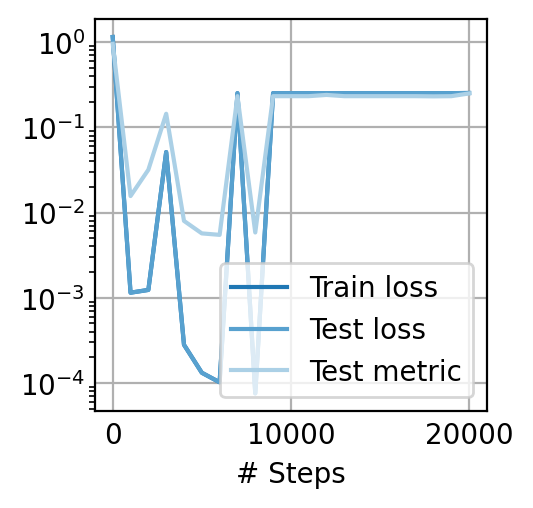

In [ ]:
model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models/model_pretrained_robust_5",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=20000,  callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)





In [ ]:
model.restore( "/content/drive/MyDrive/trained_models/model_pretrained_robust_5-8000.ckpt")

In [ ]:
np.shape(Rand)[0]

10

A:  [0.09052861] B:  [0.72809628] L2:  0.03824141613493229 



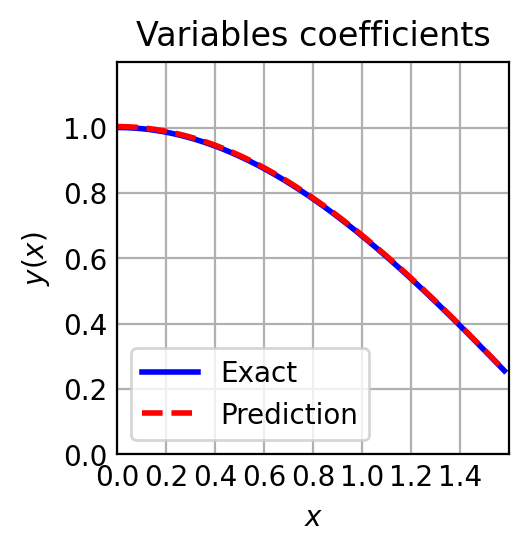

A:  [0.46821444] B:  [0.96298276] L2:  0.022450445959287944 



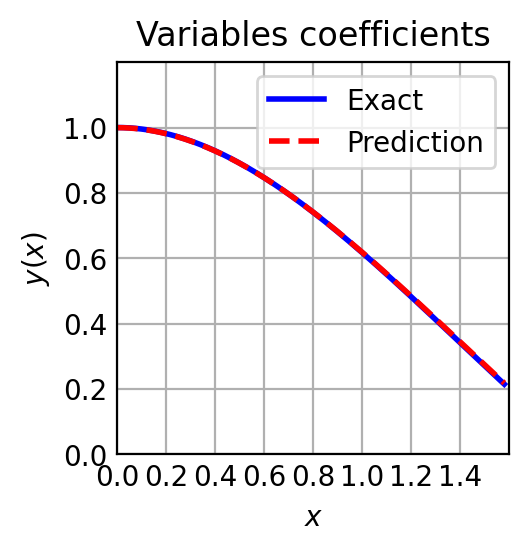

A:  [0.14961623] B:  [0.44045053] L2:  0.05985023858853981 



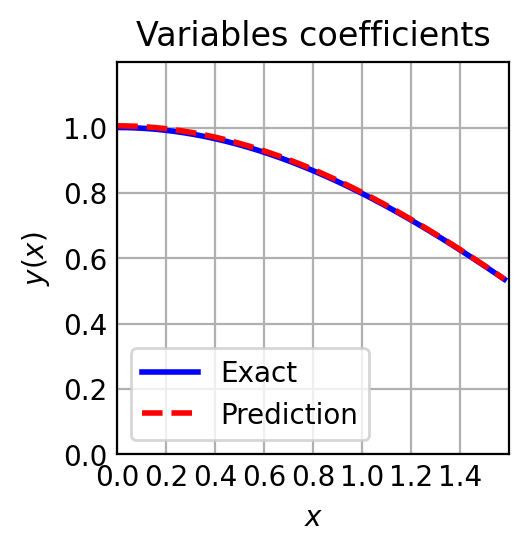

A:  [0.99825684] B:  [0.01057612] L2:  0.20208262345251532 



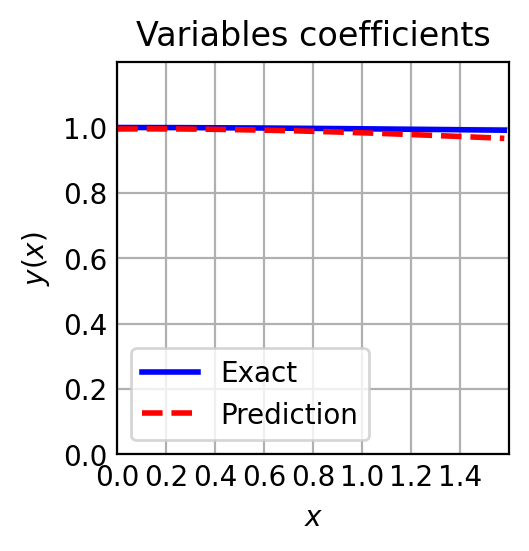

A:  [0.47559247] B:  [0.73863408] L2:  0.14524005749757665 



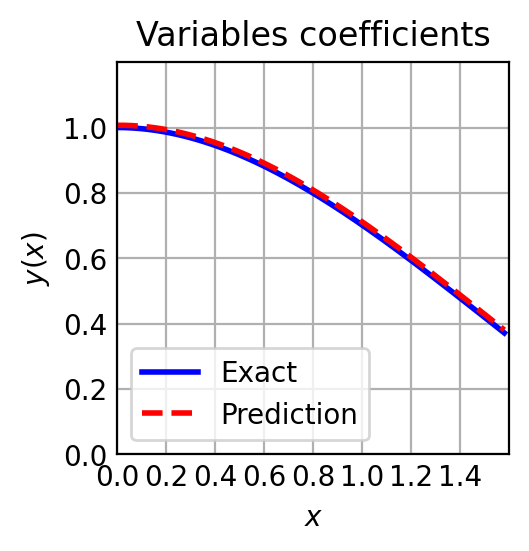

A:  [0.79658177] B:  [0.70322287] L2:  0.01664261611884832 



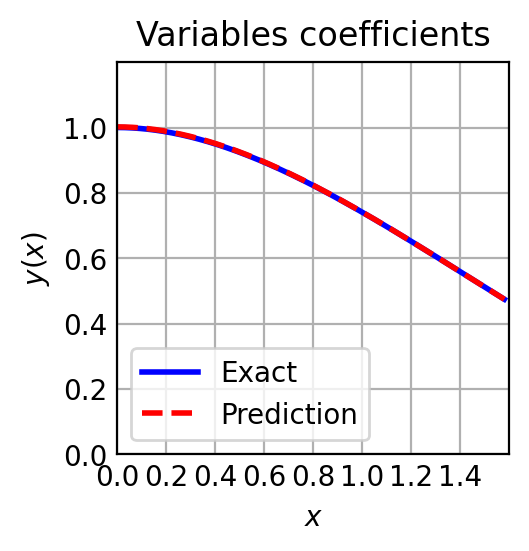

A:  [0.01162751] B:  [0.74594175] L2:  0.0714252269756425 



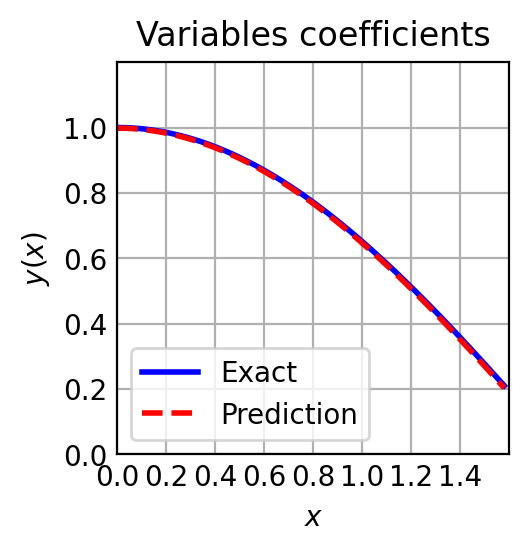

A:  [0.90084918] B:  [0.98211772] L2:  0.10151284929150783 



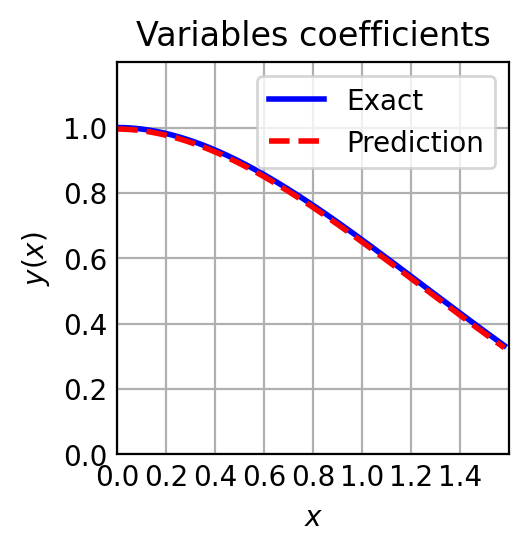

A:  [0.95585726] B:  [0.34305493] L2:  0.11858633474835431 



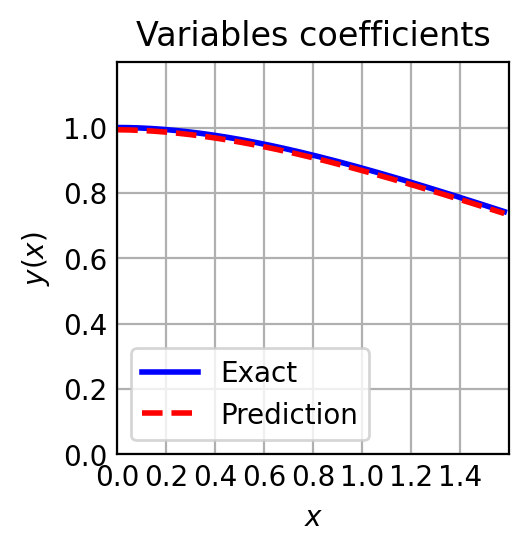

A:  [0.96896502] B:  [0.99043268] L2:  0.13528887849665683 



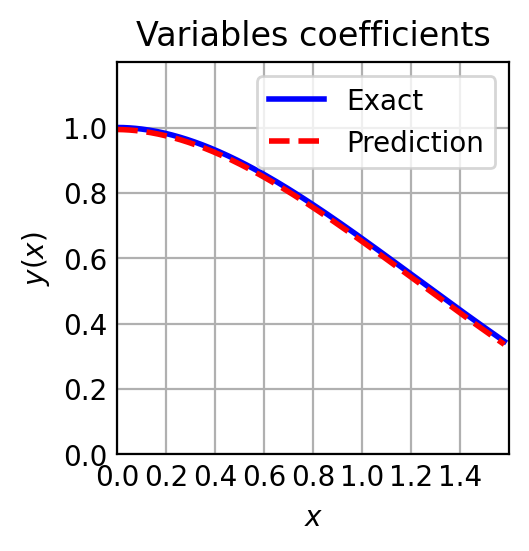

#Treino Corrigido e mais robusto

In [ ]:
import deepxde as dde
import numpy as np

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    #print(x)
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)

def derivative_func(x, y, _):
    return dde.grad.jacobian(y, x, i=0, j=2)



def boundary(x,_):
    #if(np.isclose(x[2],0)):
    #    print("Os valores de x são: ", x)
    return np.isclose(x[2],0)

time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial, component=0)
ic_2 = dde.icbc.OperatorBC(
    geomtime,
    lambda x, y, _: dde.grad.jacobian(y, x, i=0, j=2) - 0,
    boundary
)
data = dde.data.TimePDE(geomtime, pde, [bc_l, ic_2], num_domain = 2048, num_boundary = 0, num_initial=64, solution=func, num_test=None, train_distribution="pseudo")

layer_size = [3] + [512] * 8 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)
model = dde.Model(data, net)


In [ ]:
dde.optimizers.config.set_LBFGS_options(
    maxcor=50,
    ftol=1.0 * np.finfo(float).eps,
    gtol=1e-08,
    maxiter=100,
    maxfun=30000,
    maxls=50,
)

Compiling model...
'compile' took 1.548987 s

Training model...

0         [2.13e-03, 8.25e-01, 1.64e-04]    [2.13e-03, 8.25e-01, 1.64e-04]    [9.07e-01]    
Epoch 10: train loss improved from inf to 8.27e-01, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-10.ckpt ...

1000      [1.91e-03, 3.59e-04, 2.06e-04]    [1.91e-03, 3.59e-04, 2.06e-04]    [2.55e-02]    
Epoch 1000: train loss improved from 8.27e-01 to 2.48e-03, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-1000.ckpt ...

2000      [3.92e-04, 6.96e-05, 1.50e-05]    [3.92e-04, 6.96e-05, 1.50e-05]    [1.59e-02]    
Epoch 2000: train loss improved from 2.48e-03 to 4.76e-04, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-2000.ckpt ...

3000      [5.77e-04, 2.33e-05, 3.18e-04]    [5.77e-04, 2.33e-05, 3.18e-04]    [2.09e-02]    

Best model at step 2000:
  train loss: 4.76e-04
  test loss: 4.76e-04
  t

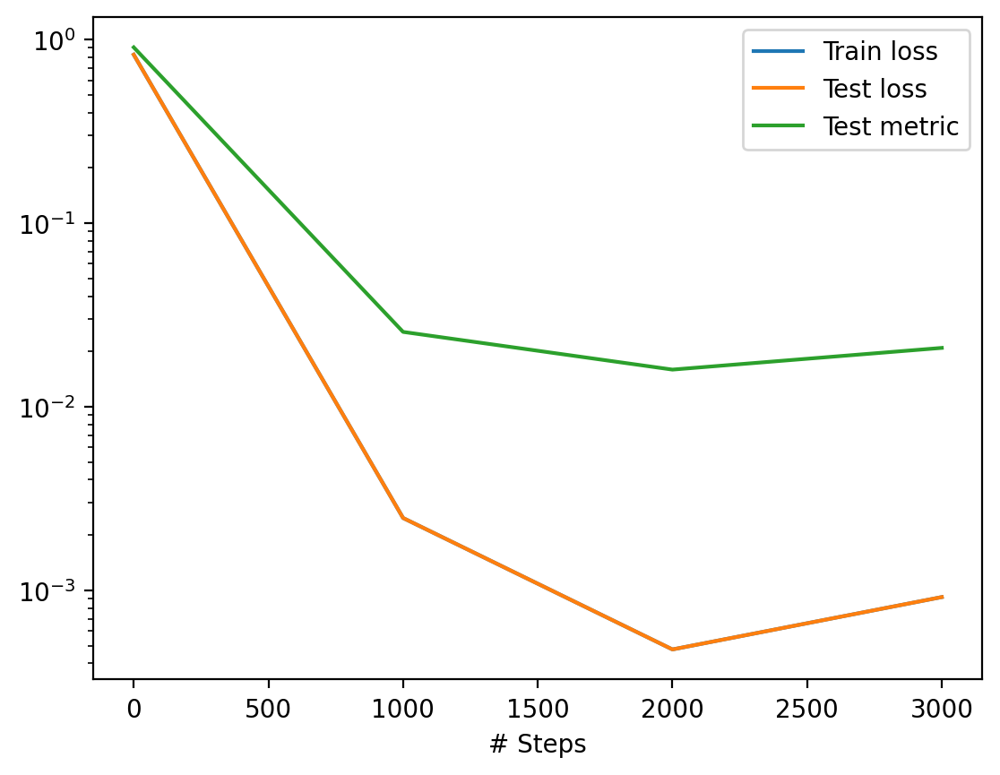

Compiling model...
'compile' took 0.891755 s

Training model...

Step      Train loss                        Test loss                         Test metric   
3000      [5.77e-04, 2.33e-05, 3.18e-04]    [5.77e-04, 2.33e-05, 3.18e-04]    [2.09e-02]    
3105      [2.32e-05, 7.77e-06, 3.82e-06]    [2.32e-05, 7.77e-06, 3.82e-06]    [6.65e-03]    

Best model at step 3105:
  train loss: 3.48e-05
  test loss: 3.48e-05
  test metric: [6.65e-03]

Epoch 3105: saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-3105.ckpt ...

'train' took 179.990329 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


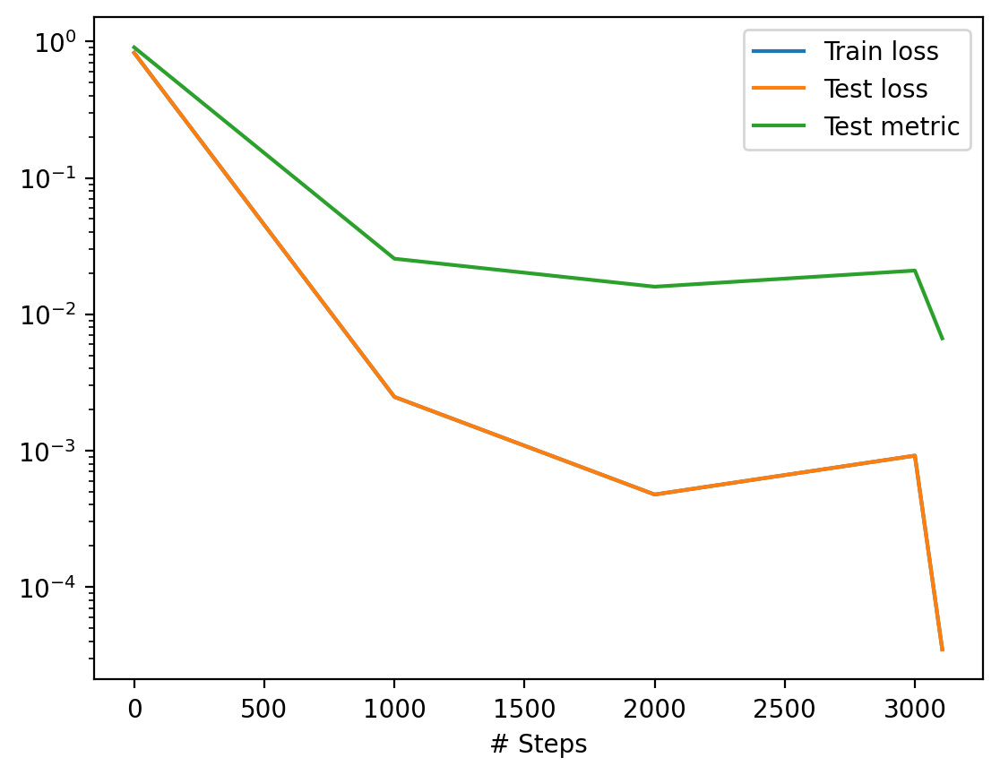

Compiling model...
'compile' took 0.858690 s

Training model...

Step      Train loss                        Test loss                         Test metric   
3105      [2.32e-05, 7.77e-06, 3.82e-06]    [2.32e-05, 7.77e-06, 3.82e-06]    [6.65e-03]    
Epoch 3115: train loss improved from inf to 3.48e-05, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-3115.ckpt ...

4000      [4.63e-04, 8.49e-05, 4.14e-05]    [4.63e-04, 8.49e-05, 4.14e-05]    [1.25e-02]    
5000      [5.21e-05, 7.01e-06, 7.05e-06]    [5.21e-05, 7.01e-06, 7.05e-06]    [5.53e-03]    
6000      [1.81e-01, 6.05e-02, 1.31e-05]    [1.81e-01, 6.05e-02, 1.31e-05]    [2.33e-01]    
6105      [1.46e-01, 4.54e-02, 1.87e-04]    [1.46e-01, 4.54e-02, 1.87e-04]    [2.23e-01]    

Best model at step 3105:
  train loss: 3.48e-05
  test loss: 3.48e-05
  test metric: [6.65e-03]

'train' took 106.155557 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...

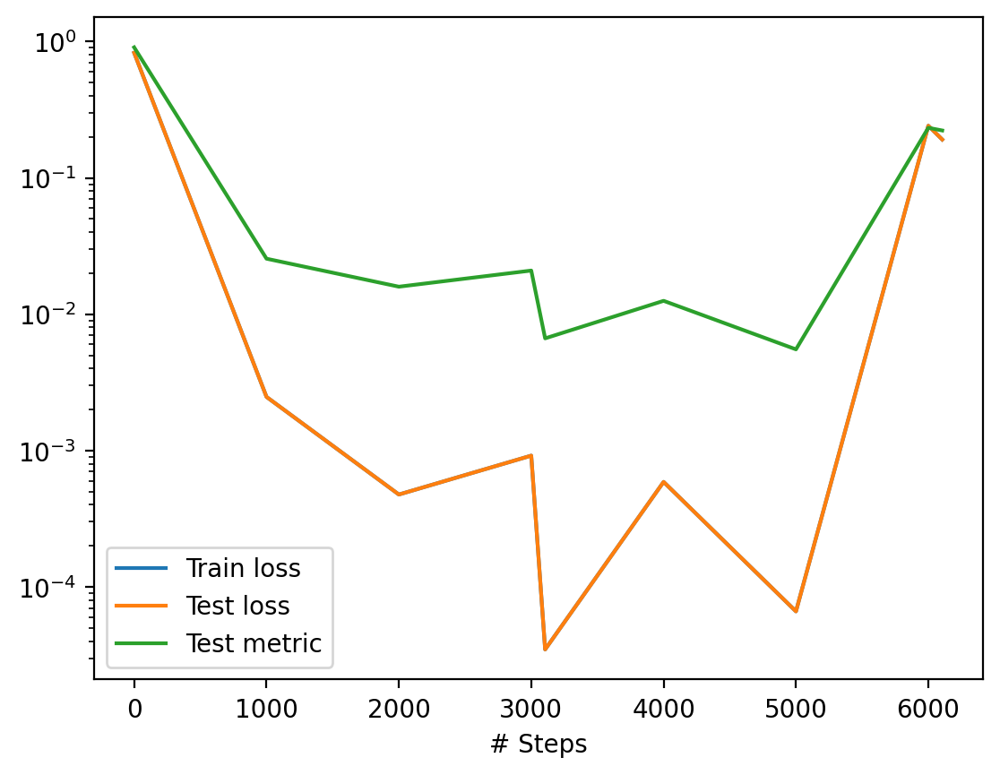

Compiling model...
'compile' took 0.631526 s

Training model...

Step      Train loss                        Test loss                         Test metric   
6105      [1.46e-01, 4.54e-02, 1.87e-04]    [1.46e-01, 4.54e-02, 1.87e-04]    [2.23e-01]    
6221      [1.01e-02, 4.87e-03, 1.19e-03]    [1.01e-02, 4.87e-03, 1.19e-03]    [6.68e-02]    

Best model at step 3105:
  train loss: 3.48e-05
  test loss: 3.48e-05
  test metric: [6.65e-03]

Epoch 6221: saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-6221.ckpt ...

'train' took 181.852886 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


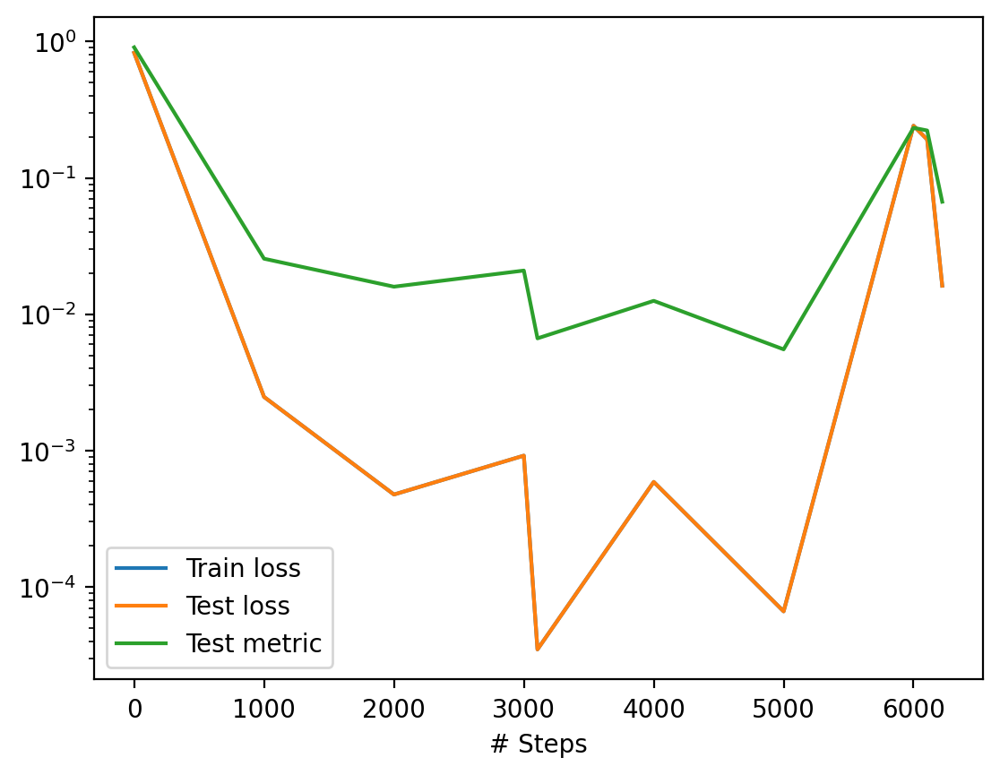

Compiling model...
'compile' took 0.872243 s

Training model...

Step      Train loss                        Test loss                         Test metric   
6221      [1.01e-02, 4.87e-03, 1.19e-03]    [1.01e-02, 4.87e-03, 1.19e-03]    [6.68e-02]    
Epoch 6231: train loss improved from inf to 1.62e-02, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-6231.ckpt ...

7000      [6.06e-05, 1.85e-05, 2.27e-06]    [6.06e-05, 1.85e-05, 2.27e-06]    [6.04e-03]    
Epoch 7001: train loss improved from 1.62e-02 to 8.13e-05, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-7001.ckpt ...

8000      [1.08e-04, 4.10e-05, 4.58e-06]    [1.08e-04, 4.10e-05, 4.58e-06]    [8.71e-03]    
9000      [9.18e-05, 1.49e-05, 6.20e-06]    [9.18e-05, 1.49e-05, 6.20e-06]    [6.45e-03]    
9221      [3.20e-05, 2.83e-06, 1.91e-06]    [3.20e-05, 2.83e-06, 1.91e-06]    [2.61e-03]    
Epoch 9221: train loss improved from 8.13e-05 to 3

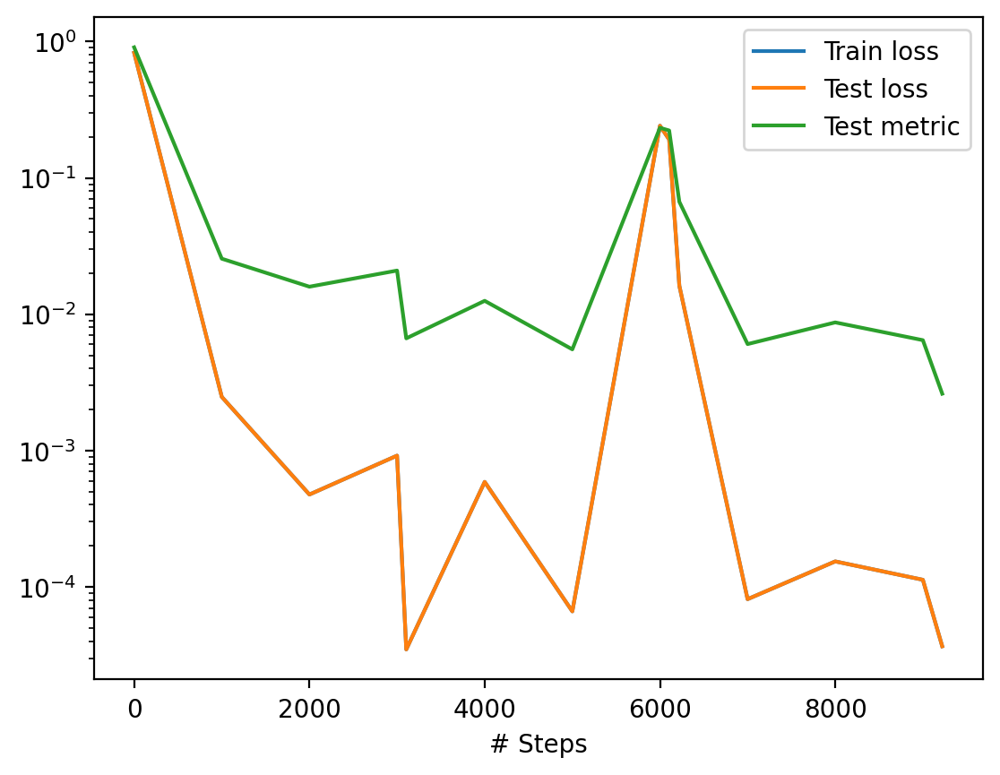

Compiling model...
'compile' took 0.667347 s

Training model...

Step      Train loss                        Test loss                         Test metric   
9221      [3.20e-05, 2.83e-06, 1.91e-06]    [3.20e-05, 2.83e-06, 1.91e-06]    [2.61e-03]    
9328      [1.98e-05, 1.16e-06, 1.18e-06]    [1.98e-05, 1.16e-06, 1.18e-06]    [1.72e-03]    

Best model at step 9328:
  train loss: 2.21e-05
  test loss: 2.21e-05
  test metric: [1.72e-03]

Epoch 9328: saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-9328.ckpt ...

'train' took 182.328202 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


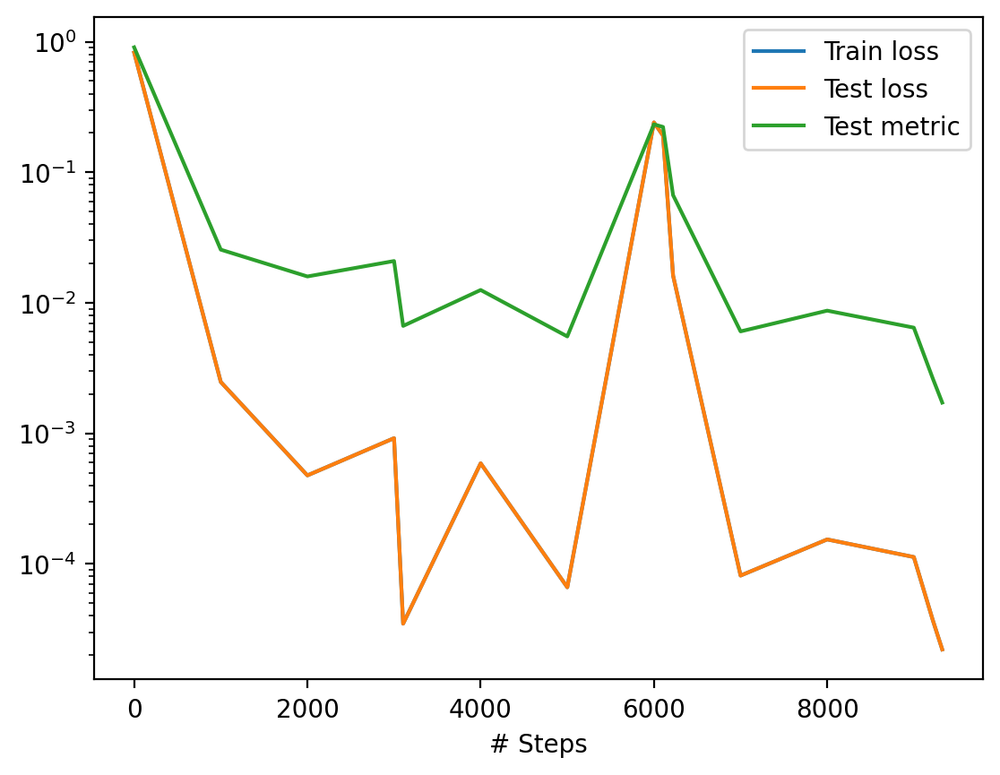

Compiling model...
'compile' took 0.877907 s

Training model...

Step      Train loss                        Test loss                         Test metric   
9328      [1.98e-05, 1.16e-06, 1.18e-06]    [1.98e-05, 1.16e-06, 1.18e-06]    [1.72e-03]    
Epoch 9338: train loss improved from inf to 2.21e-05, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-9338.ckpt ...

10000     [1.85e-01, 2.49e-02, 1.65e-04]    [1.85e-01, 2.49e-02, 1.65e-04]    [1.79e-01]    
11000     [1.88e-01, 6.32e-02, 5.25e-14]    [1.88e-01, 6.32e-02, 5.25e-14]    [2.35e-01]    
12000     [2.08e-03, 4.71e-04, 1.14e-04]    [2.08e-03, 4.71e-04, 1.14e-04]    [2.36e-02]    
12328     [1.70e-03, 5.66e-04, 4.60e-06]    [1.70e-03, 5.66e-04, 4.60e-06]    [3.77e-02]    

Best model at step 9328:
  train loss: 2.21e-05
  test loss: 2.21e-05
  test metric: [1.72e-03]

'train' took 107.998385 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...

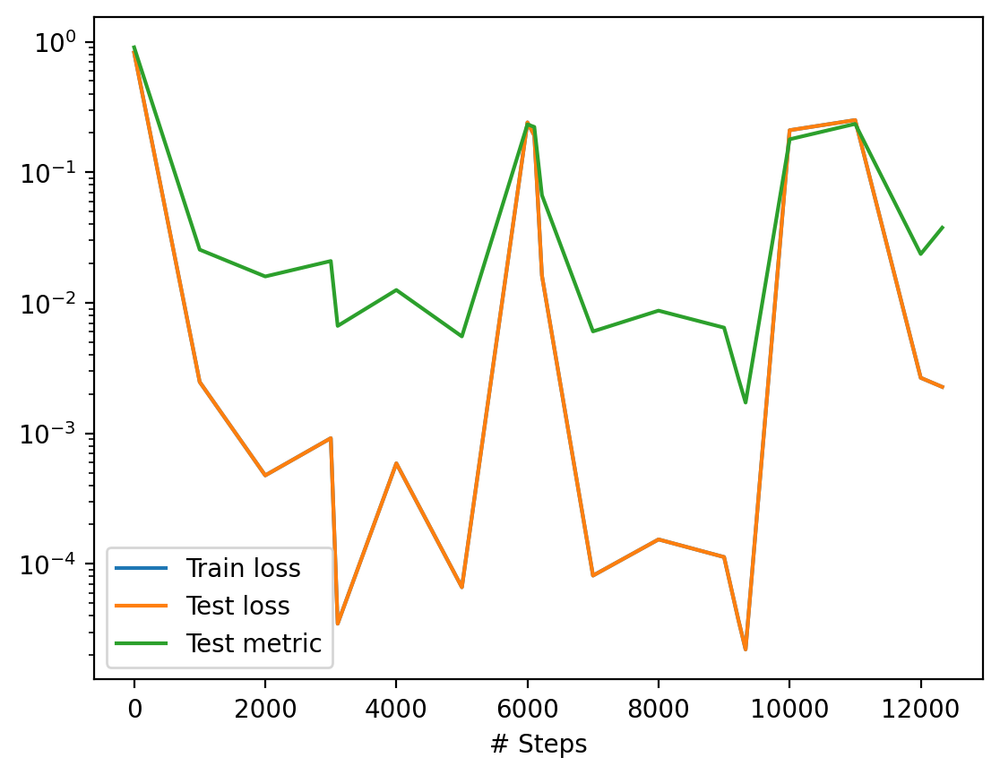

Compiling model...
'compile' took 0.690160 s

Training model...

Step      Train loss                        Test loss                         Test metric   
12328     [1.70e-03, 5.66e-04, 4.60e-06]    [1.70e-03, 5.66e-04, 4.60e-06]    [3.77e-02]    
12433     [3.32e-05, 5.14e-06, 1.94e-06]    [3.32e-05, 5.14e-06, 1.94e-06]    [3.19e-03]    

Best model at step 9328:
  train loss: 2.21e-05
  test loss: 2.21e-05
  test metric: [1.72e-03]

Epoch 12433: saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-12433.ckpt ...

'train' took 181.619625 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


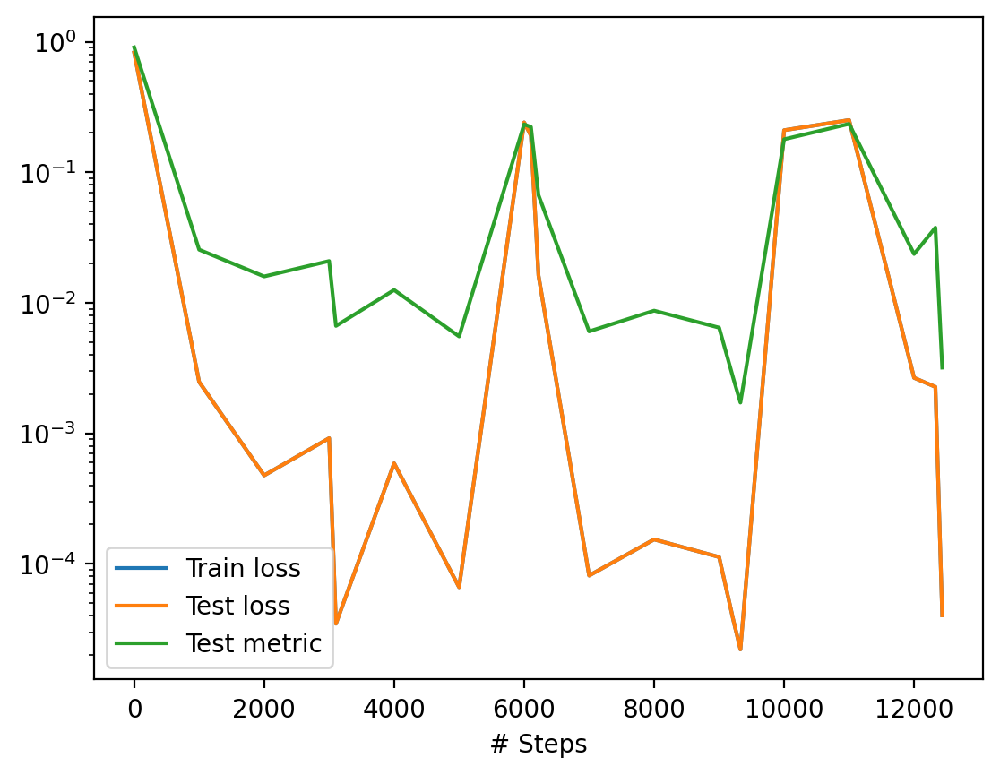

Compiling model...
'compile' took 1.129312 s

Training model...

Step      Train loss                        Test loss                         Test metric   
12433     [3.32e-05, 5.14e-06, 1.94e-06]    [3.32e-05, 5.14e-06, 1.94e-06]    [3.19e-03]    
Epoch 12443: train loss improved from inf to 4.03e-05, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-12443.ckpt ...

13000     [2.11e-04, 1.20e-04, 3.49e-06]    [2.11e-04, 1.20e-04, 3.49e-06]    [1.51e-02]    
14000     [1.88e-01, 6.32e-02, 1.67e-11]    [1.88e-01, 6.32e-02, 1.67e-11]    [2.35e-01]    
15000     [1.93e-01, 5.83e-02, 4.00e-13]    [1.93e-01, 5.83e-02, 4.00e-13]    [2.29e-01]    
15433     [1.88e-01, 6.32e-02, 4.07e-13]    [1.88e-01, 6.32e-02, 4.07e-13]    [2.35e-01]    

Best model at step 9328:
  train loss: 2.21e-05
  test loss: 2.21e-05
  test metric: [1.72e-03]

'train' took 107.103215 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat .

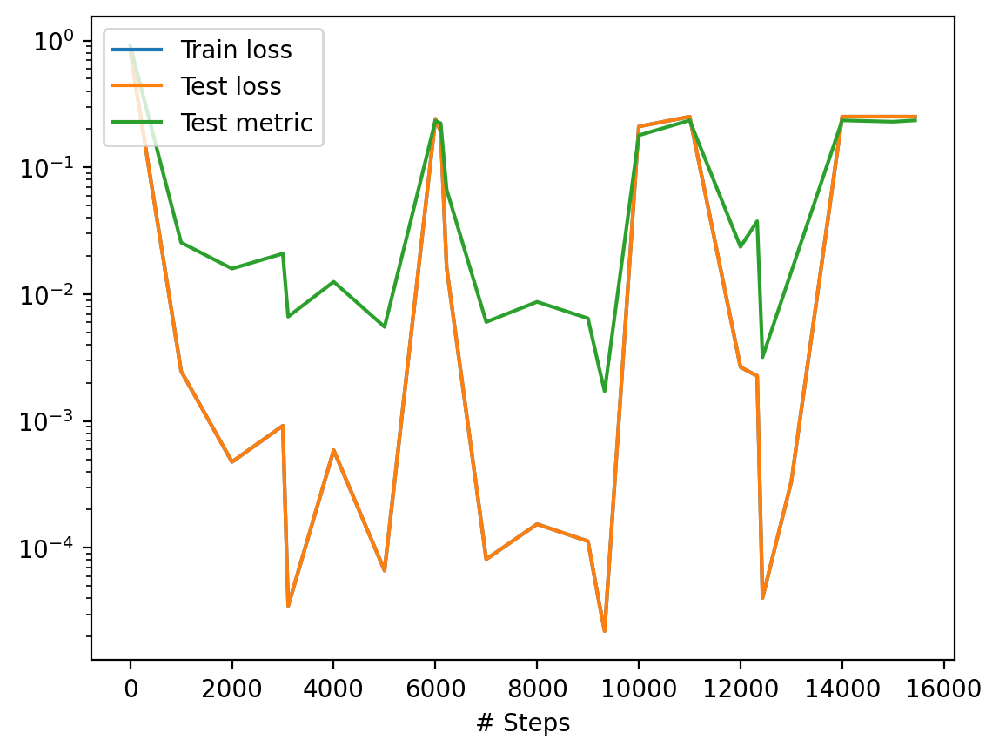

Compiling model...
'compile' took 0.926025 s

Training model...

Step      Train loss                        Test loss                         Test metric   
15433     [1.88e-01, 6.32e-02, 4.07e-13]    [1.88e-01, 6.32e-02, 4.07e-13]    [2.35e-01]    
15450     [1.88e-01, 6.32e-02, 4.07e-13]    [1.88e-01, 6.32e-02, 4.07e-13]    [2.35e-01]    

Best model at step 9328:
  train loss: 2.21e-05
  test loss: 2.21e-05
  test metric: [1.72e-03]

Epoch 15450: saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-15450.ckpt ...

'train' took 20.092812 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


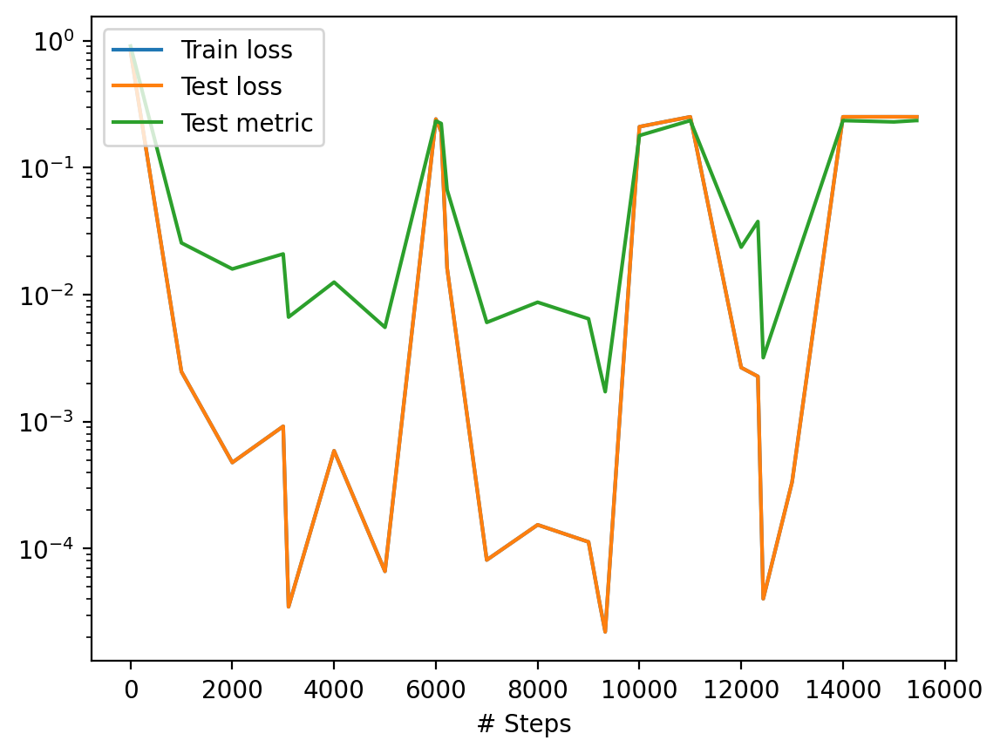

Compiling model...
'compile' took 0.900878 s

Training model...

Step      Train loss                        Test loss                         Test metric   
15450     [1.88e-01, 6.32e-02, 4.07e-13]    [1.88e-01, 6.32e-02, 4.07e-13]    [2.35e-01]    
Epoch 15460: train loss improved from inf to 2.51e-01, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-15460.ckpt ...

16000     [1.88e-01, 6.32e-02, 1.72e-20]    [1.88e-01, 6.32e-02, 1.72e-20]    [2.35e-01]    
17000     [1.88e-01, 6.32e-02, 5.72e-19]    [1.88e-01, 6.32e-02, 5.72e-19]    [2.35e-01]    
18000     [1.89e-01, 6.29e-02, 4.11e-24]    [1.89e-01, 6.29e-02, 4.11e-24]    [2.35e-01]    
18450     [1.87e-01, 6.40e-02, 1.45e-24]    [1.87e-01, 6.40e-02, 1.45e-24]    [2.36e-01]    

Best model at step 9328:
  train loss: 2.21e-05
  test loss: 2.21e-05
  test metric: [1.72e-03]

'train' took 108.202751 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat .

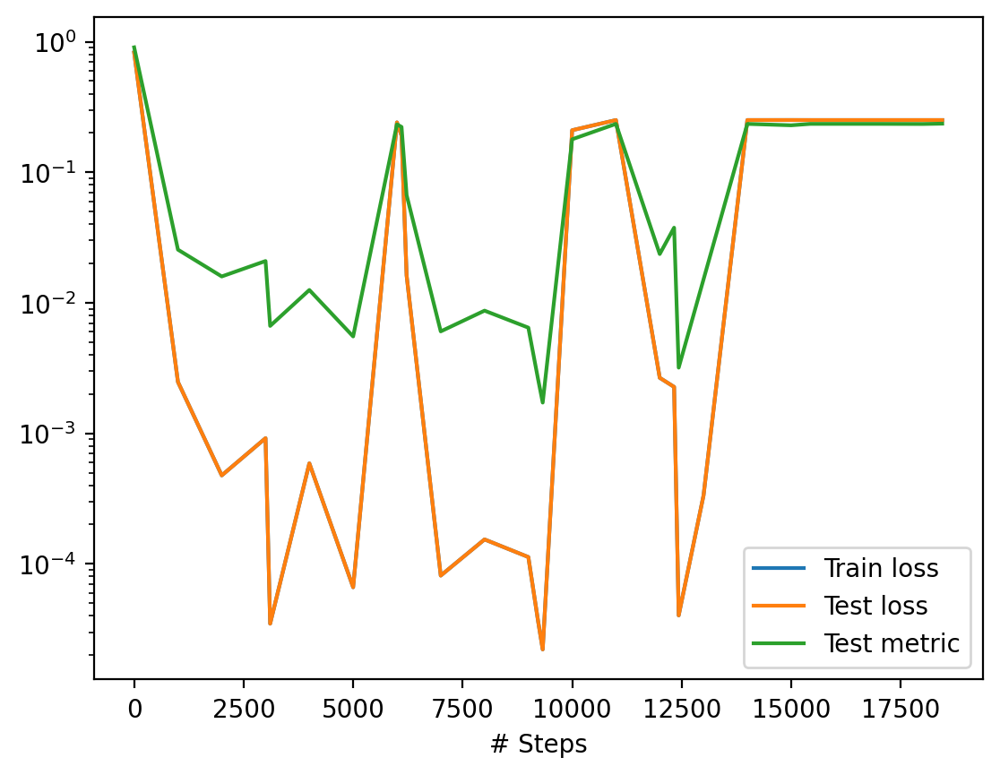

Compiling model...
'compile' took 0.725220 s

Training model...

Step      Train loss                        Test loss                         Test metric   
18450     [1.87e-01, 6.40e-02, 1.45e-24]    [1.87e-01, 6.40e-02, 1.45e-24]    [2.36e-01]    
18460     [1.88e-01, 6.32e-02, 1.45e-24]    [1.88e-01, 6.32e-02, 1.45e-24]    [2.35e-01]    

Best model at step 9328:
  train loss: 2.21e-05
  test loss: 2.21e-05
  test metric: [1.72e-03]

Epoch 18460: saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-18460.ckpt ...

'train' took 17.792970 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


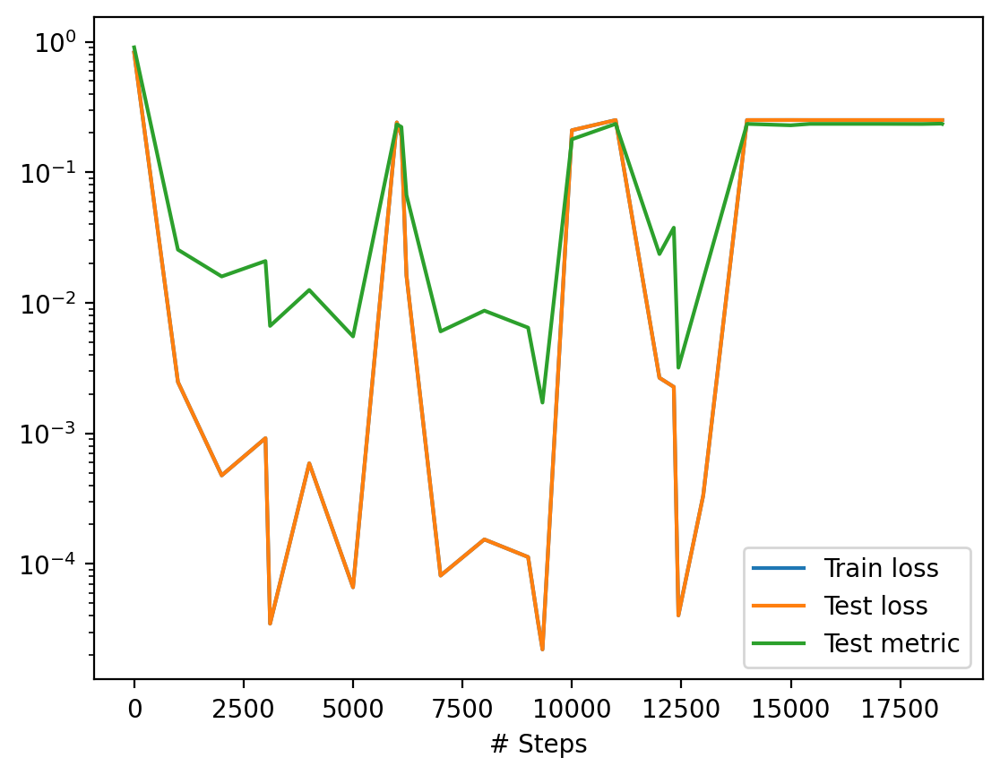

Compiling model...
'compile' took 0.947793 s

Training model...

Step      Train loss                        Test loss                         Test metric   
18460     [1.88e-01, 6.32e-02, 1.45e-24]    [1.88e-01, 6.32e-02, 1.45e-24]    [2.35e-01]    
Epoch 18470: train loss improved from inf to 2.51e-01, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-18470.ckpt ...

19000     [1.88e-01, 6.32e-02, 2.08e-27]    [1.88e-01, 6.32e-02, 2.08e-27]    [2.35e-01]    
Epoch 19000: train loss improved from 2.51e-01 to 2.51e-01, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-19000.ckpt ...

20000     [1.88e-01, 6.30e-02, 1.95e-27]    [1.88e-01, 6.30e-02, 1.95e-27]    [2.35e-01]    
21000     [1.88e-01, 6.30e-02, 3.79e-27]    [1.88e-01, 6.30e-02, 3.79e-27]    [2.35e-01]    
21460     [1.88e-01, 6.32e-02, 9.79e-28]    [1.88e-01, 6.32e-02, 9.79e-28]    [2.35e-01]    
Epoch 21460: train loss improved from 2.51e-01

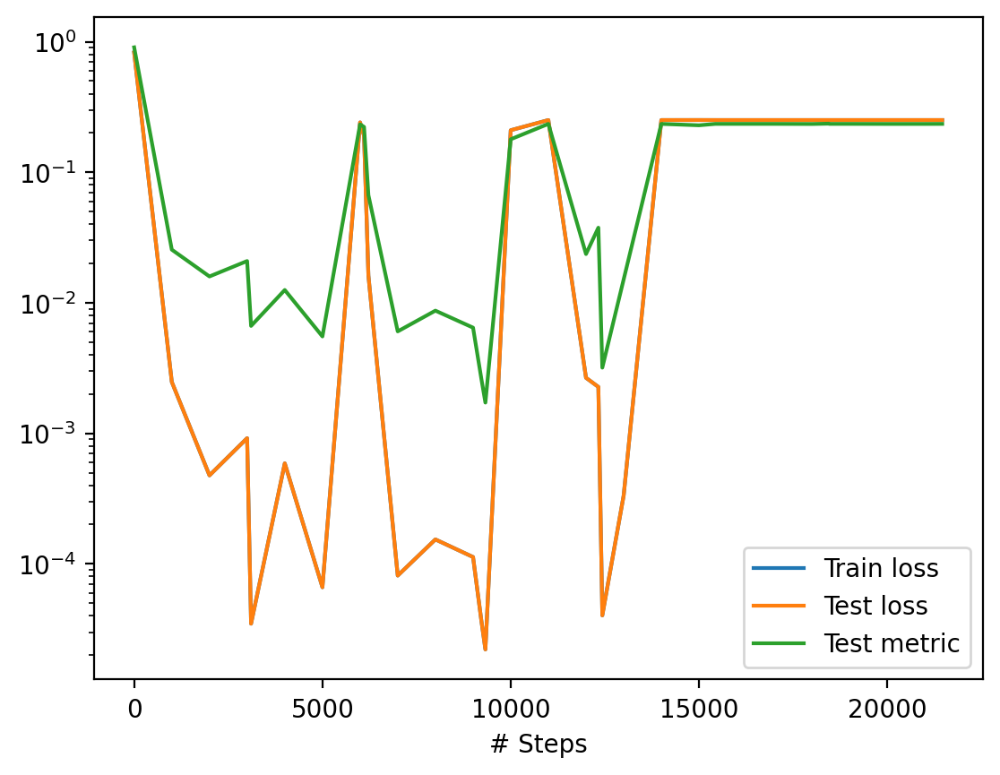

Compiling model...
'compile' took 0.756657 s

Training model...

Step      Train loss                        Test loss                         Test metric   
21460     [1.88e-01, 6.32e-02, 9.79e-28]    [1.88e-01, 6.32e-02, 9.79e-28]    [2.35e-01]    
21470     [1.88e-01, 6.32e-02, 9.79e-28]    [1.88e-01, 6.32e-02, 9.79e-28]    [2.35e-01]    

Best model at step 9328:
  train loss: 2.21e-05
  test loss: 2.21e-05
  test metric: [1.72e-03]

Epoch 21470: saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-21470.ckpt ...

'train' took 18.705006 s

Saving loss history to /content/loss.dat ...
Saving training data to /content/train.dat ...
Saving test data to /content/test.dat ...


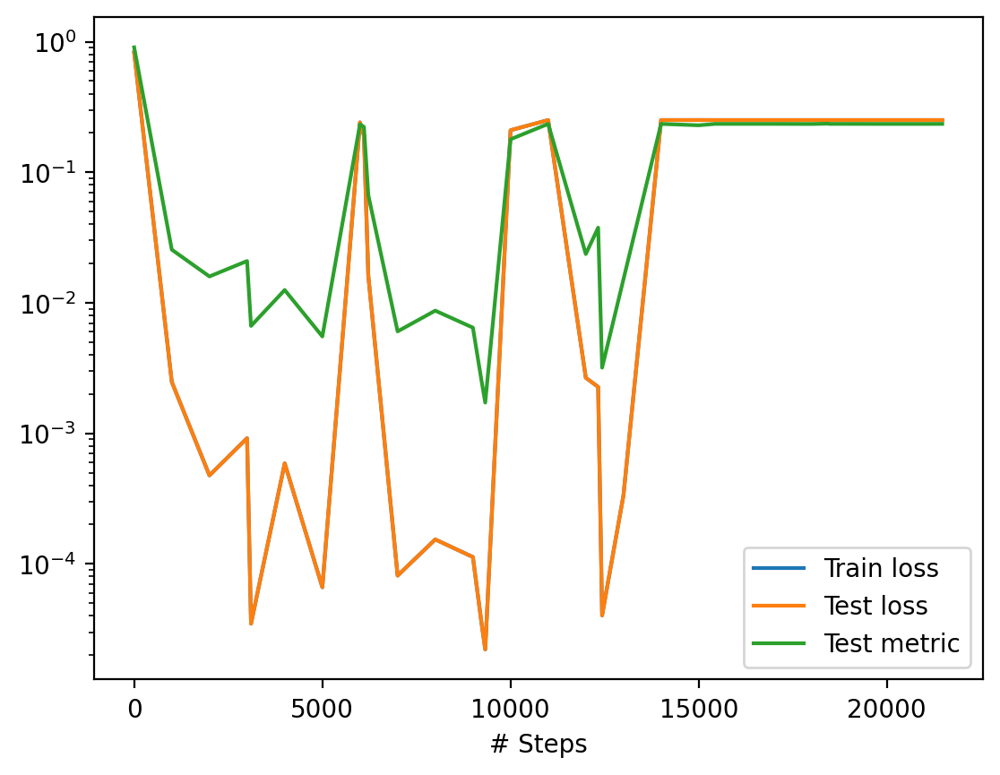

In [ ]:

model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt",period = 10, verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=3000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


model.compile("L-BFGS", metrics=["l2 relative error"])
losshistory, train_state = model.train(model_save_path="/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt")
dde.saveplot(losshistory, train_state, issave=True, isplot=True)








A:  [0.67055617] B:  [0.65515208] L2:  0.4854047498913082 



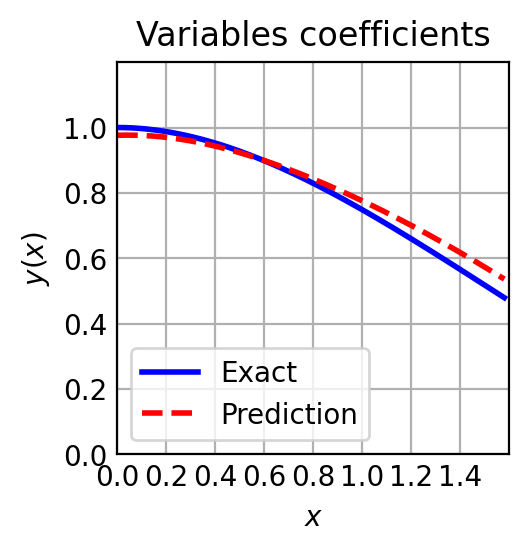

A:  [0.71533014] B:  [0.89219675] L2:  0.4764476255979298 



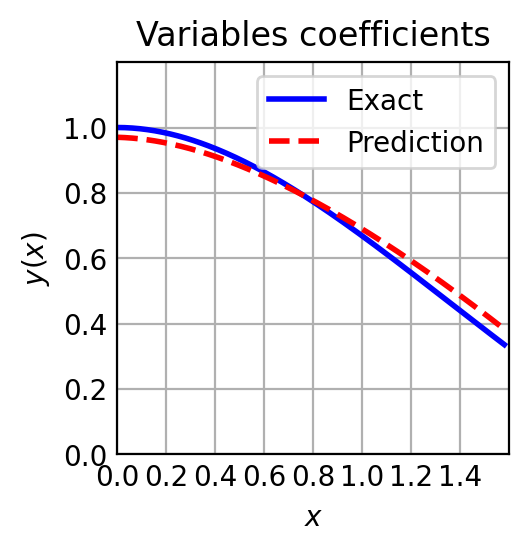

A:  [0.97395769] B:  [0.54452486] L2:  0.1979700013267833 



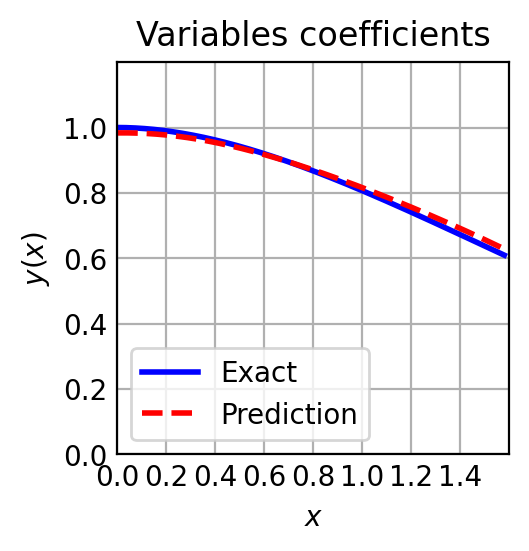

A:  [0.63981957] B:  [0.77077392] L2:  0.5282188592115872 



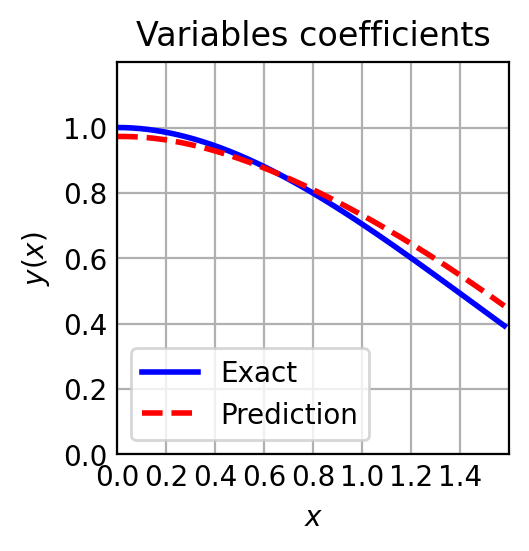

A:  [0.37571853] B:  [0.92065089] L2:  0.5175037299329074 



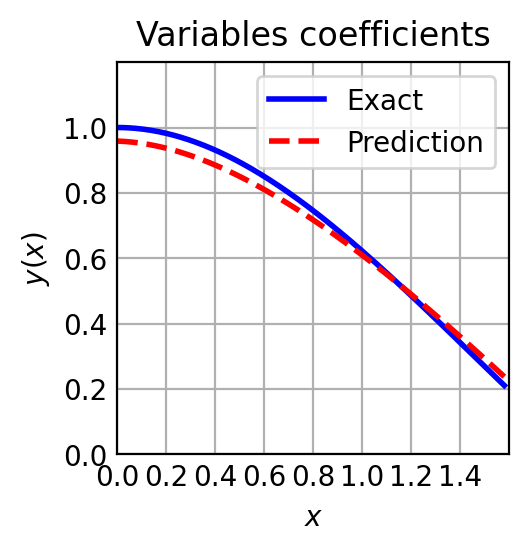

A:  [0.3117109] B:  [0.1656983] L2:  0.7825623681118525 



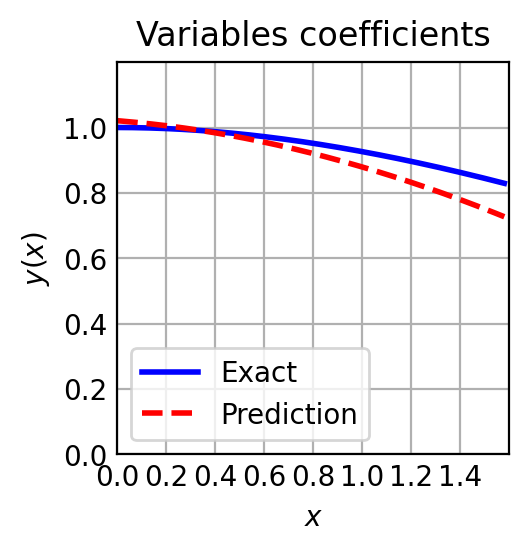

A:  [0.58845977] B:  [0.24724021] L2:  0.45628365853999153 



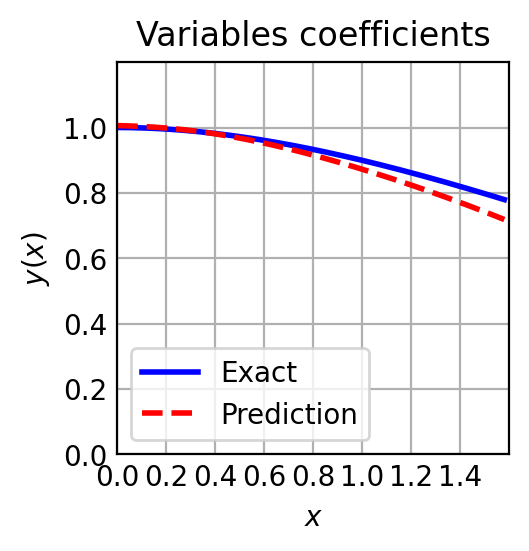

A:  [0.36936635] B:  [0.64550318] L2:  0.48470744264584714 



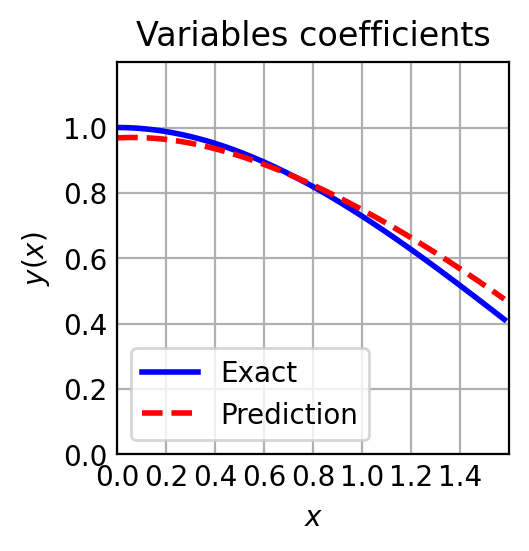

A:  [0.30185974] B:  [0.50374222] L2:  0.33206502494848217 



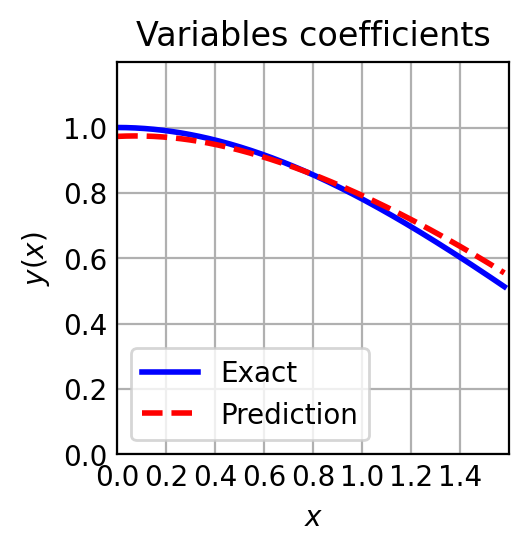

A:  [0.52733533] B:  [0.62892255] L2:  0.4890065044421951 



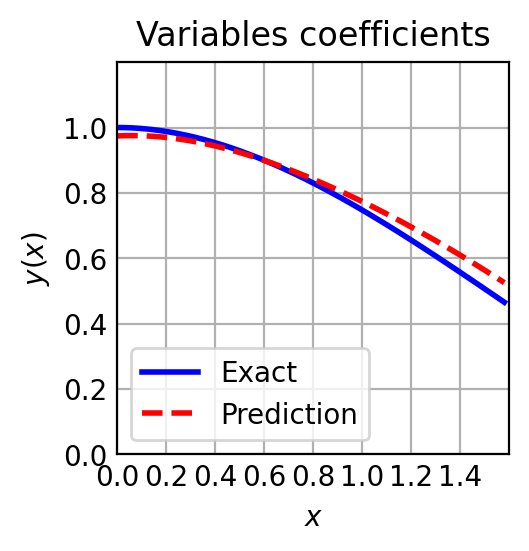

In [ ]:
Rand=np.random.rand(10,2)
for i in range (np.shape(Rand)[0]):
    plot_results(Rand[i])

##Selecting the best model

In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
model.restore("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-3105.ckpt")
#model.restore("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust.ckpt-9338.ckpt")

Compiling model...
'compile' took 2.160892 s



A:  [0.02213874] B:  [0.33508603] L2:  13.046621638272688 



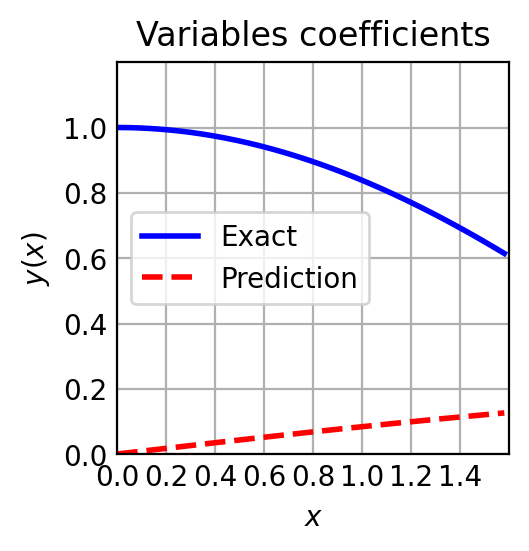

A:  [0.72037244] B:  [0.93293527] L2:  12.504790912647975 



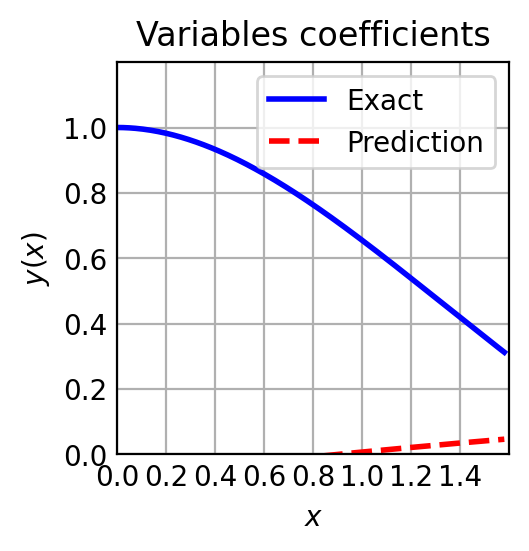

A:  [0.11854075] B:  [0.82086903] L2:  11.31117082988338 



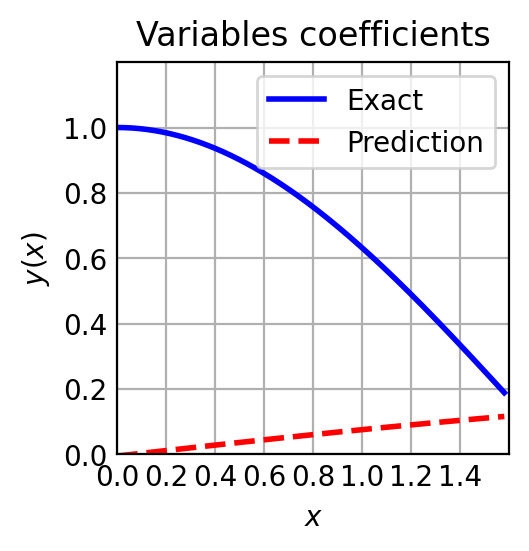

A:  [0.28204244] B:  [0.32272964] L2:  13.733146965199875 



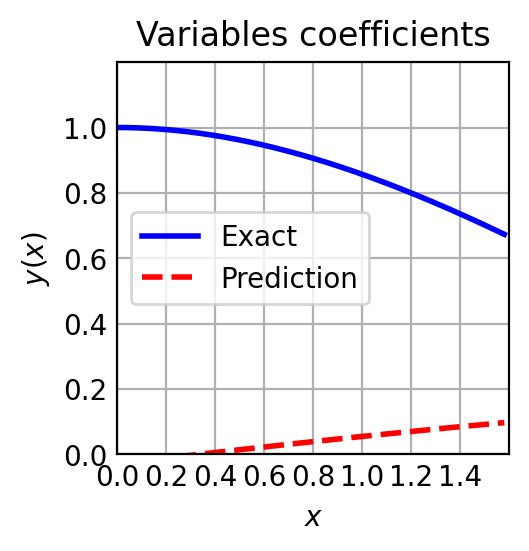

A:  [0.07309044] B:  [0.02537533] L2:  14.923356972314313 



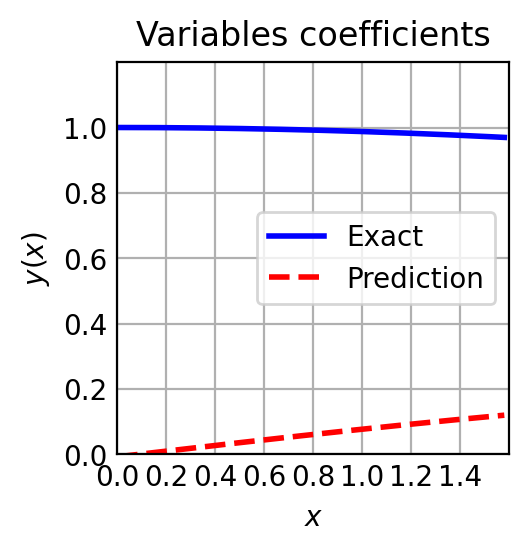

A:  [0.02549542] B:  [0.38549588] L2:  12.803529619119786 



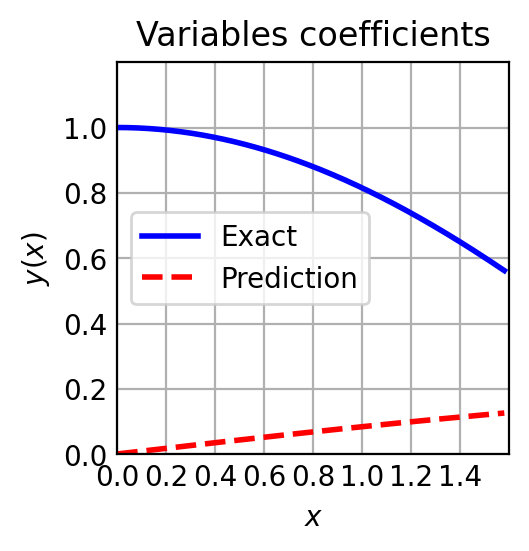

A:  [0.73148644] B:  [0.26451107] L2:  15.022985924267871 



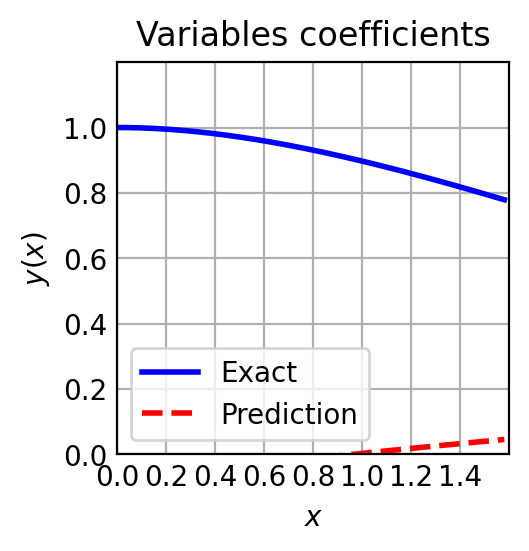

A:  [0.02800719] B:  [0.97017373] L2:  10.672048239168687 



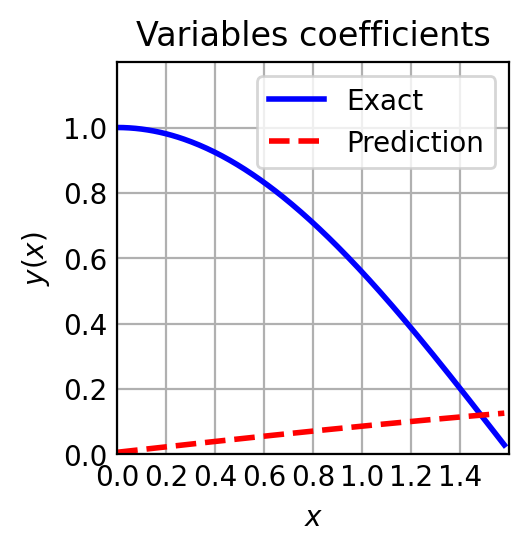

A:  [0.43897068] B:  [0.28284835] L2:  14.289036480803198 



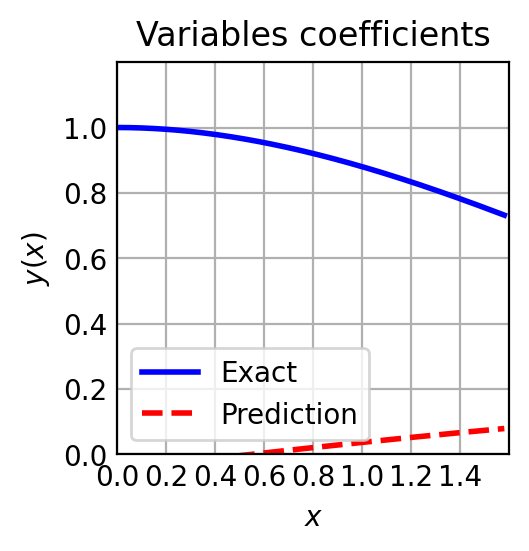

A:  [0.41642152] B:  [0.51968985] L2:  13.184879677154678 



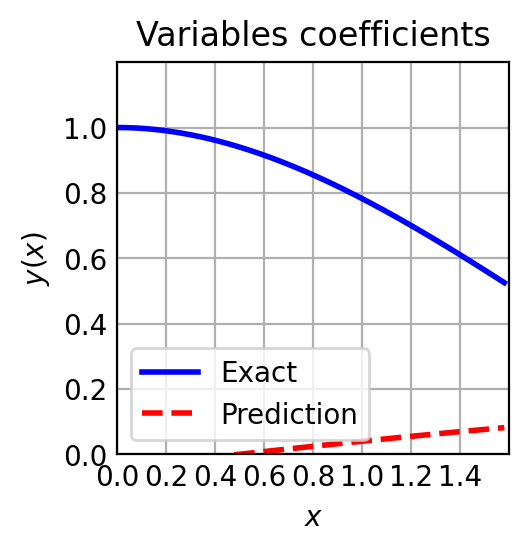

A:  [0.90480811] B:  [0.22056654] L2:  15.58071790470813 



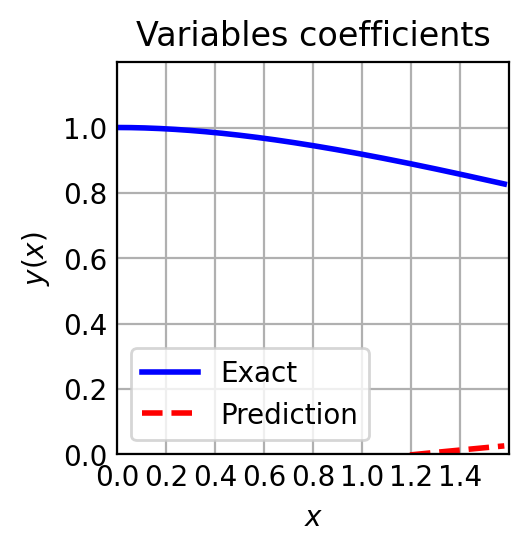

A:  [0.2763731] B:  [0.18377783] L2:  14.424020829128079 



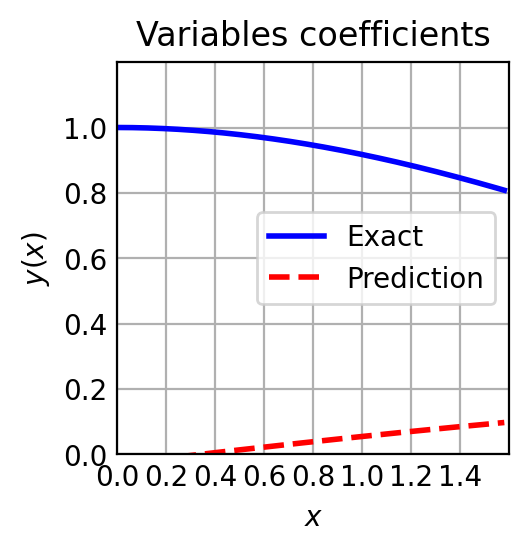

A:  [0.6344602] B:  [0.43003522] L2:  14.089529476587133 



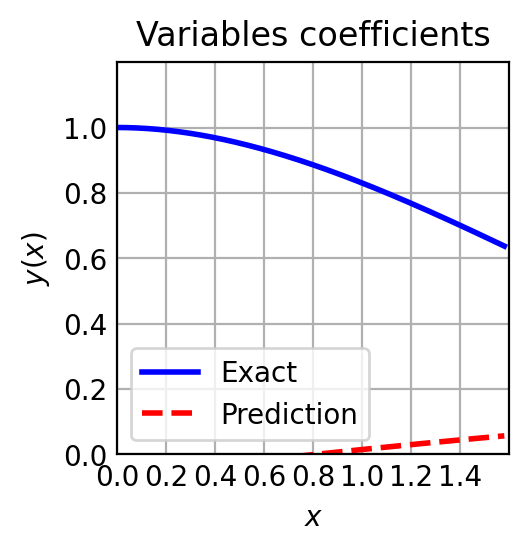

A:  [0.32849932] B:  [0.44914755] L2:  13.26421877400203 



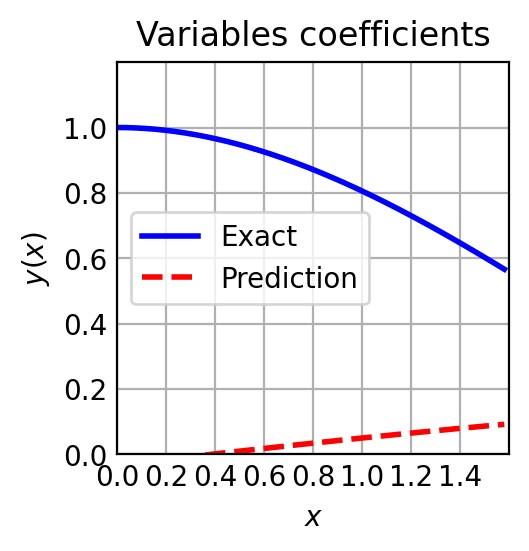

A:  [0.03240119] B:  [0.72947291] L2:  11.392752387425537 



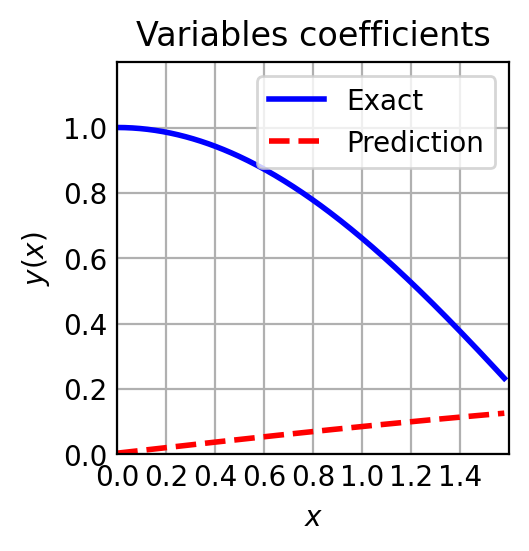

A:  [0.26282347] B:  [0.4975597] L2:  12.88981029160841 



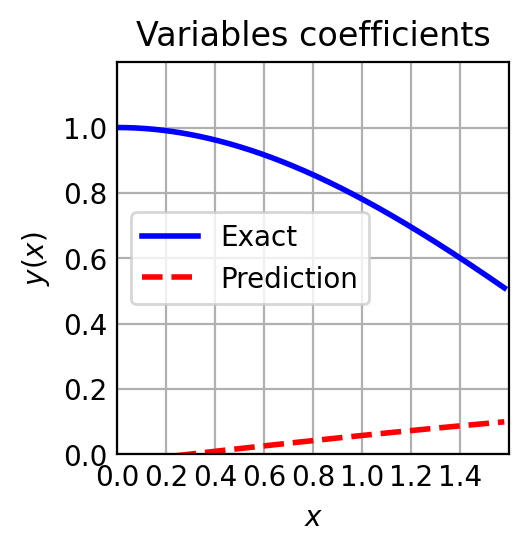

A:  [0.38191834] B:  [0.99051752] L2:  11.4729133997369 



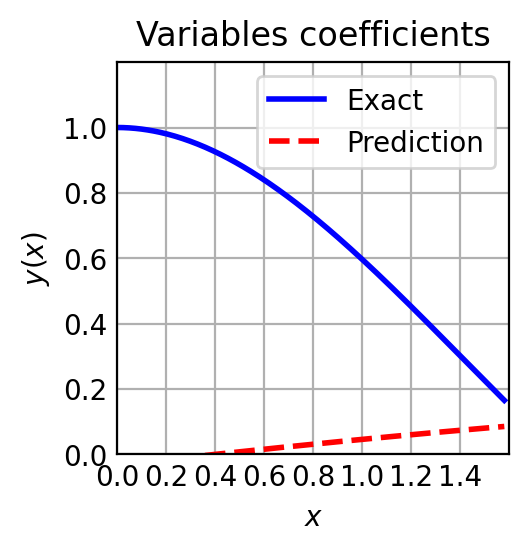

A:  [0.82251433] B:  [0.69578152] L2:  13.536191740386846 



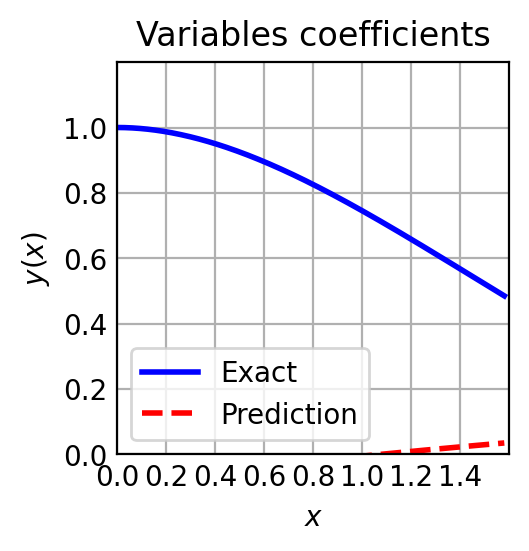

A:  [0.55225555] B:  [0.43640845] L2:  13.866429489648551 



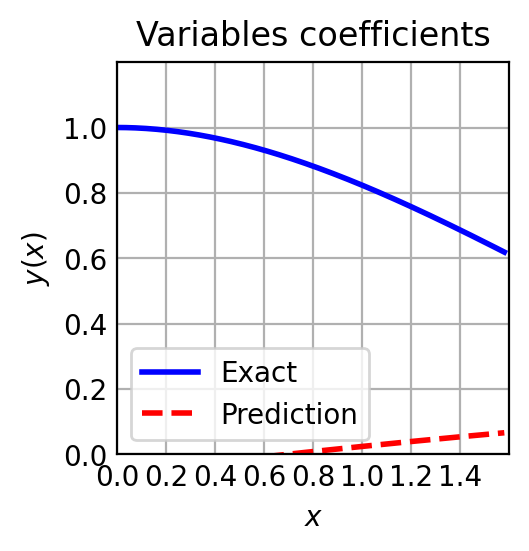

A:  [0.57092315] B:  [0.47958841] L2:  13.731946271639568 



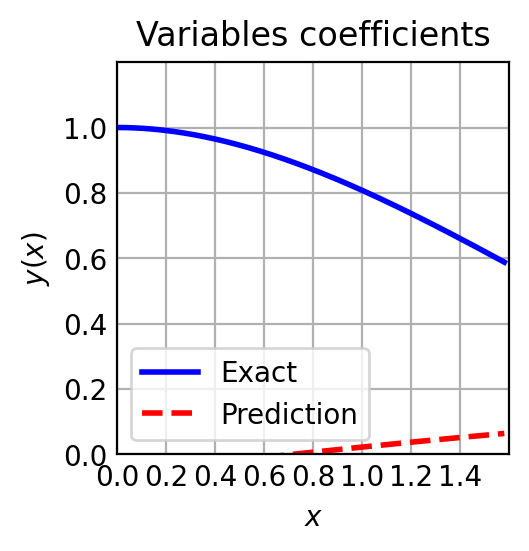

In [ ]:
Rand=np.random.rand(20,2)
for i in range (np.shape(Rand)[0]):
    plot_results(Rand[i])

##Second training


In [ ]:
import deepxde as dde
import numpy as np

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    #print(x)
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)

def derivative_func(x, y, _):
    return dde.grad.jacobian(y, x, i=0, j=2)



def boundary(x,_):
    #if(np.isclose(x[2],0)):
    #    print("Os valores de x são: ", x)
    return np.isclose(x[2],0)

time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial, component=0)
ic_2 = dde.icbc.OperatorBC(
    geomtime,
    lambda x, y, _: dde.grad.jacobian(y, x, i=0, j=2) - 0,
    boundary
)
#data = dde.data.TimePDE(geomtime, pde, [bc_l, ic_2], num_domain = 2048, num_boundary = 0, num_initial=64, solution=func, num_test=None, train_distribution="pseudo")
data = dde.data.TimePDE(geomtime, pde, [bc_l, ic_2], num_domain = 2048, num_boundary = 0, num_initial=64, solution=func, num_test=None)

layer_size = [3] + [200] * 4 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)
model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])


Compiling model...
Building feed-forward neural network...


/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'build' took 0.253768 s

'compile' took 7.948693 s



Compiling model...
'compile' took 1.050351 s

Training model...

Step      Train loss                        Test loss                         Test metric   
2000      [2.39e-04, 2.18e-05, 8.73e-06]    [2.39e-04, 2.18e-05, 8.73e-06]    [6.79e-03]    
Epoch 2001: train loss improved from inf to 2.70e-04, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt-2001.ckpt ...

3000      [9.18e-05, 1.23e-05, 4.89e-06]    [9.18e-05, 1.23e-05, 4.89e-06]    [5.20e-03]    
Epoch 3000: train loss improved from 2.70e-04 to 1.09e-04, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt-3000.ckpt ...

4000      [4.46e-05, 1.00e-05, 4.02e-06]    [4.46e-05, 1.00e-05, 4.02e-06]    [4.24e-03]    
Epoch 4000: train loss improved from 1.09e-04 to 5.86e-05, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt-4000.ckpt ...

5000      [3.20e-05, 4.35e-06, 2.01e-06]    [3.20e-05, 4.35e-06, 2.

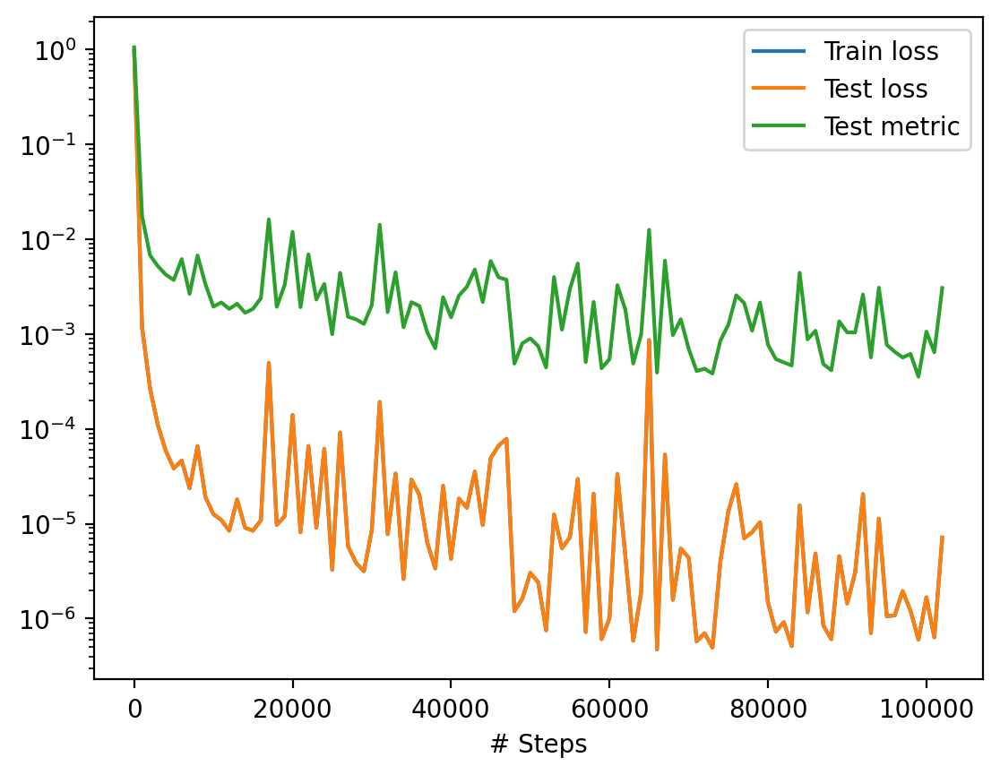

In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt", verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=100000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust2.ckpt", verbose=1, save_better_only=True)
#model.restore("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust2.ckpt-7000.ckpt")
losshistory, train_state = model.train(iterations=10000, callbacks = [checkpointer])#, model_restore_path="/content/drive/MyDrive/trained_models_personal/model_pretrained_robust2.ckpt-7000.ckpt")

Compiling model...
'compile' took 0.462047 s

Training model...



KeyboardInterrupt: ignored

In [ ]:
#model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust2.ckpt", verbose=1, save_better_only=True)
#model.restore("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust2.ckpt-7000.ckpt")
losshistory, train_state = model.train(iterations=10000, callbacks = [checkpointer])#, model_restore_path="/content/drive/MyDrive/trained_models_personal/model_pretrained_robust2.ckpt-7000.ckpt")

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [5.14e-04, 9.28e-01, 2.62e-04]    [5.14e-04, 9.28e-01, 2.62e-04]    [9.61e-01]    
Epoch 1: train loss improved from inf to 9.29e-01, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust2.ckpt-1.ckpt ...



KeyboardInterrupt: ignored

In [ ]:
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust2.ckpt", verbose=1, save_better_only=True)

losshistory, train_state = model.train(iterations=10000, callbacks = [checkpointer], model_restore_path="/content/drive/MyDrive/trained_models_personal/model_pretrained_robust2.ckpt-11000.ckpt")

Restoring model from /content/drive/MyDrive/trained_models_personal/model_pretrained_robust2.ckpt-11000.ckpt ...



InvalidArgumentError: ignored

#Intervalos maiores A e B


In [ ]:
import deepxde as dde
import numpy as np

def pde(x, y):
    dy_x = dde.grad.jacobian(y, x,j=2)
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)

    A = x[:,0:1]
    B = x[:,1:2]

    return dy_xx + A*dy_x + B* y

lambda x, on_bounary: dde.utils.isclose(x[2], 0)
def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    #print(x)
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1], dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)

def derivative_func(x, y, _):
    return dde.grad.jacobian(y, x, i=0, j=2)



def boundary(x,_):
    #if(np.isclose(x[2],0)):
    #    print("Os valores de x são: ", x)
    return np.isclose(x[2],0)

time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([-1,-1],[1,1])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial, component=0)
ic_2 = dde.icbc.OperatorBC(
    geomtime,
    lambda x, y, _: dde.grad.jacobian(y, x, i=0, j=2) - 0,
    boundary
)
#data = dde.data.TimePDE(geomtime, pde, [bc_l, ic_2], num_domain = 2048, num_boundary = 0, num_initial=64, solution=func, num_test=None, train_distribution="pseudo")
data = dde.data.TimePDE(geomtime, pde, [bc_l, ic_2], num_domain = 2048, num_boundary = 0, num_initial=64, solution=func, num_test=None)

layer_size = [3] + [200] * 4 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)
model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])


Compiling model...
Building feed-forward neural network...
'build' took 0.070403 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 4.843371 s



In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt", verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=30000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)


Compiling model...
'compile' took 1.055462 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [7.33e-03, 1.01e+00, 1.95e-03]    [7.33e-03, 1.01e+00, 1.95e-03]    [1.02e+00]    


Compiling model...
'compile' took 1.270280 s

Training model...

Step      Train loss                        Test loss                         Test metric   
30000     [1.16e-06, 1.26e-07, 1.17e-07]    [1.16e-06, 1.26e-07, 1.17e-07]    [2.75e-03]    
Epoch 30001: train loss improved from inf to 1.40e-06, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt-30001.ckpt ...

31000     [8.76e-07, 8.78e-08, 7.19e-08]    [8.76e-07, 8.78e-08, 7.19e-08]    [2.33e-03]    
Epoch 31000: train loss improved from 1.40e-06 to 1.04e-06, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt-31000.ckpt ...

32000     [2.05e-04, 4.01e-05, 1.27e-05]    [2.05e-04, 4.01e-05, 1.27e-05]    [6.03e-03]    
33000     [7.13e-05, 2.14e-05, 1.36e-06]    [7.13e-05, 2.14e-05, 1.36e-06]    [7.25e-03]    
34000     [2.94e-05, 1.18e-05, 1.59e-07]    [2.94e-05, 1.18e-05, 1.59e-07]    [4.50e-03]    
35000     [1.70e-06, 1.66e-07, 2.80e-07]    

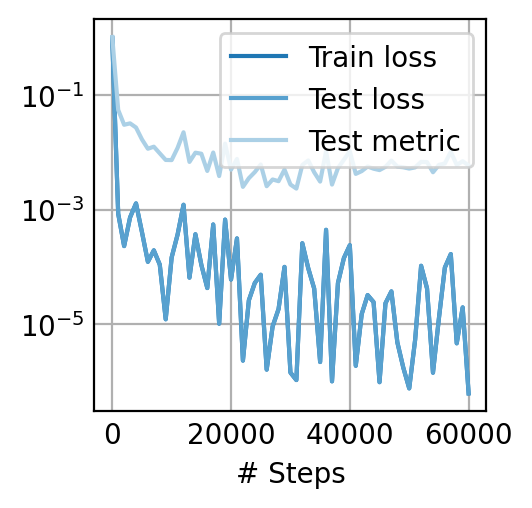

In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt", verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=30000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

Compiling model...
'compile' took 1.085174 s

Training model...

Step      Train loss                        Test loss                         Test metric   
60000     [5.42e-07, 3.13e-08, 3.28e-08]    [5.42e-07, 3.13e-08, 3.28e-08]    [5.92e-03]    
Epoch 60001: train loss improved from inf to 6.06e-07, saving model to /content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt-60001.ckpt ...

61000     [1.08e-04, 6.84e-05, 4.77e-07]    [1.08e-04, 6.84e-05, 4.77e-07]    [1.11e-02]    
62000     [5.78e-07, 3.41e-08, 3.40e-08]    [5.78e-07, 3.41e-08, 3.40e-08]    [6.21e-03]    
63000     [1.06e-04, 1.01e-04, 6.37e-06]    [1.06e-04, 1.01e-04, 6.37e-06]    [1.29e-02]    
64000     [2.29e-05, 4.56e-06, 1.58e-07]    [2.29e-05, 4.56e-06, 1.58e-07]    [6.68e-03]    
65000     [3.06e-05, 3.66e-06, 3.35e-06]    [3.06e-05, 3.66e-06, 3.35e-06]    [7.23e-03]    
66000     [2.12e-06, 1.33e-07, 1.54e-07]    [2.12e-06, 1.33e-07, 1.54e-07]    [3.55e-03]    
67000     [1.34e-04, 6.14e-

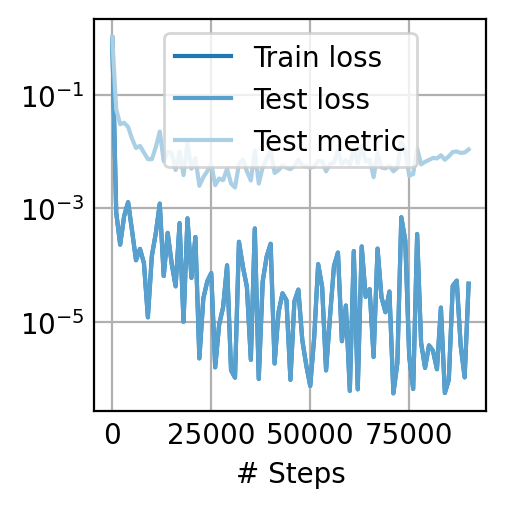

In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt", verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=30000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
model.restore("/content/drive/MyDrive/trained_models_personal/model_pretrained_robust4.ckpt-71000.ckpt")

Compiling model...
'compile' took 0.774143 s



In [ ]:
Rand=np.random.rand(10,2)*2 -1
for i in range (np.shape(Rand)[0]):
    plot_results(Rand[i]*2-)

SyntaxError: ignored

In [ ]:
    def make_X(A,B):
        A = A* np.ones([256,1])
        B = B*np.ones([256,1])
        t = np.linspace(0,1.58,256)
        t= np.vstack(t)
        X = np.concatenate((A, B, t), axis=1)
        return X
    #esta função calcula a cada par de coordenadas A,B, a norma L2
    def make_X_array(X):
        l2=np.zeros([X.shape[0],1])
        for i in range (X.shape[0]):
            A=X[i,0:1]
            B=X[i,1:2]

            A = A* np.ones([256,1])
            B = B*np.ones([256,1])
            t = np.linspace(0,1.58,256)
            t= np.vstack(t)
            Xi = np.concatenate((A, B, t), axis=1)

            l2[i]=np.linalg.norm(model.predict(Xi) - func(Xi), ord=2)

        return l2





In [ ]:
x = np.linspace(-1, 1, 256)
t = np.linspace(-1, 1, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))

In [ ]:
x = np.linspace(-1.5, 1.5, 256)
t = np.linspace(-1.5, 1.5, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))

In [ ]:
l2_grid = make_X_array(X_star)

In [ ]:
np.save("/content/drive/MyDrive/l2_big_A-b_extrapolation", l2_grid)

In [ ]:
l2_grid_reload_big_ab=np.load("/content/drive/MyDrive/l2_big_A-b.npy")

In [ ]:
l2_grid_reload_big_ab_extrapolation = np.load("/content/drive/MyDrive/l2_big_A-b_extrapolation.npy")

In [ ]:
l2_grid - l2_grid_reload_big_ab

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

In [ ]:
log_grid=np.log(l2_grid_reload_big_ab)
log_grid_10=np.log10(l2_grid_reload_big_ab)

In [ ]:
log_l2_grid_reload_big_ab_extrapolation=np.log10(l2_grid_reload_big_ab_extrapolation)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import griddata

x = np.linspace(-1, 1, 256)
t = np.linspace(-1, 1, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
#make_X(X_star)

#prediction(L2(A,B))
#model.predict(X_star)
#np.linalg.norm(model.predict(X_star) - func(X_star), ord=2)
#prediction = model.predict(X_star, operator=None)
prediction=l2_grid_reload_big_ab



v = griddata(X_star, prediction[:, 0], (X, T), method='cubic')

fig, ax = plt.subplots()
ax.set_title("L2 norm")
ax.set_ylabel("B")
ax.set_xlabel("A")
ax.imshow(
    v.T,
    interpolation="nearest",
    cmap="viridis",
    extent=[-1, 1, -1, 1],
    origin="lower",
    aspect="auto",
)
#ax.set(xlim=(0, 1.1), xticks=np.arange(0, 1.0, step=0.2),
#        ylim=(0, 1.1), yticks=np.arange(0, 1.0, step=0.2))
fig.colorbar(plt.cm.ScalarMappable(matplotlib.colors.Normalize(0,l2_grid_reload_big_ab.max()), cmap="viridis"), ax=ax)
#fig.colorbar(im, ax=axs[3])
#plt.axes().set_aspect('equal')
plt.show()

NameError: ignored

A:  [-0.78] B:  [-0.8] L2:  0.07439158434019198 



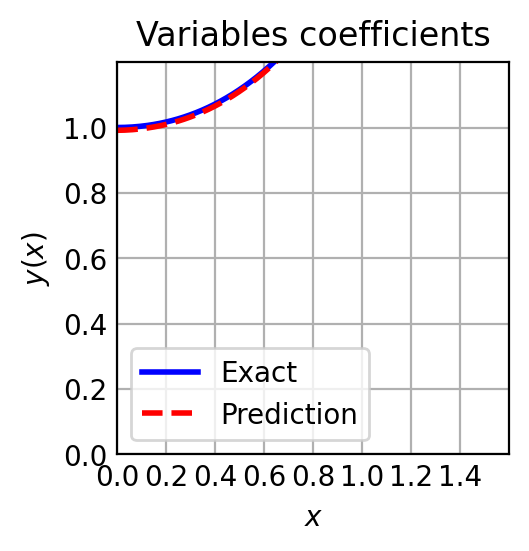

In [ ]:
plot_results(np.array([-0.78,-0.8]))

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import griddata

x = np.linspace(0, 1, 256)
t = np.linspace(0, 1, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
#make_X(X_star)

#prediction(L2(A,B))
#model.predict(X_star)
#np.linalg.norm(model.predict(X_star) - func(X_star), ord=2)
#prediction = model.predict(X_star, operator=None)
prediction=l2_grid_reload
prediction =



v = griddata(X_star, prediction[:, 0], (X, T), method='cubic')

fig, ax = plt.subplots()
ax.set_title("L2 norm")
ax.set_ylabel("B")
ax.set_xlabel("A")
ax.imshow(
    v.T,
    interpolation="nearest",
    cmap="viridis",
    extent=[0, 1, 0, 1],
    origin="lower",
    aspect="auto",
)
#ax.set(xlim=(0, 1.1), xticks=np.arange(0, 1.0, step=0.2),
#        ylim=(0, 1.1), yticks=np.arange(0, 1.0, step=0.2))
fig.colorbar(plt.cm.ScalarMappable(matplotlib.colors.Normalize(0,l2_grid_reload.max()), cmap="viridis"), ax=ax)
#fig.colorbar(im, ax=axs[3])
#plt.axes().set_aspect('equal')
plt.show()

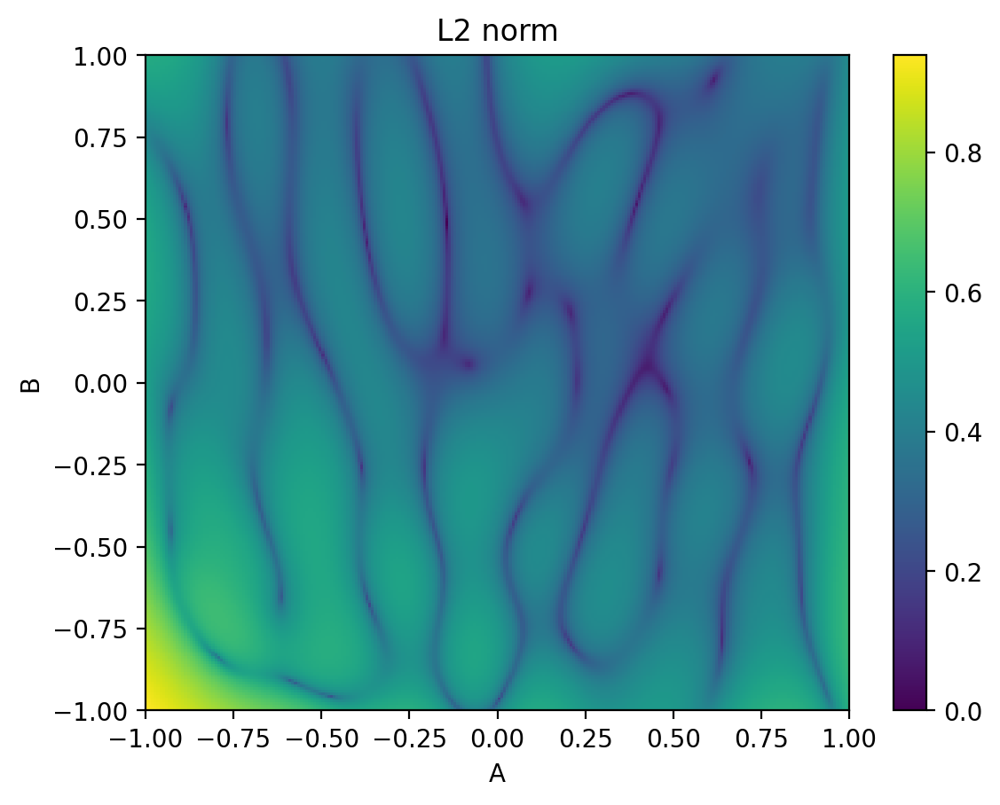

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import griddata

x = np.linspace(-1, 1, 256)
t = np.linspace(-1, 1, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
#make_X(X_star)

#prediction(L2(A,B))
#model.predict(X_star)
#np.linalg.norm(model.predict(X_star) - func(X_star), ord=2)
#prediction = model.predict(X_star, operator=None)
#prediction=l2_grid_reload_big_ab
prediction = log_grid



v = griddata(X_star, prediction[:, 0], (X, T), method='cubic')

fig, ax = plt.subplots()
ax.set_title("L2 norm")
ax.set_ylabel("B")
ax.set_xlabel("A")
ax.imshow(
    v.T,
    interpolation="nearest",
    cmap="viridis",
    extent=[-1, 1, -1, 1],
    origin="lower",
    aspect="auto",
)
#ax.set(xlim=(0, 1.1), xticks=np.arange(0, 1.0, step=0.2),
#        ylim=(0, 1.1), yticks=np.arange(0, 1.0, step=0.2))
fig.colorbar(plt.cm.ScalarMappable(matplotlib.colors.Normalize(0,log_grid.max()), cmap="viridis"), ax=ax)
#fig.colorbar(im, ax=axs[3])
#plt.axes().set_aspect('equal')
plt.show()

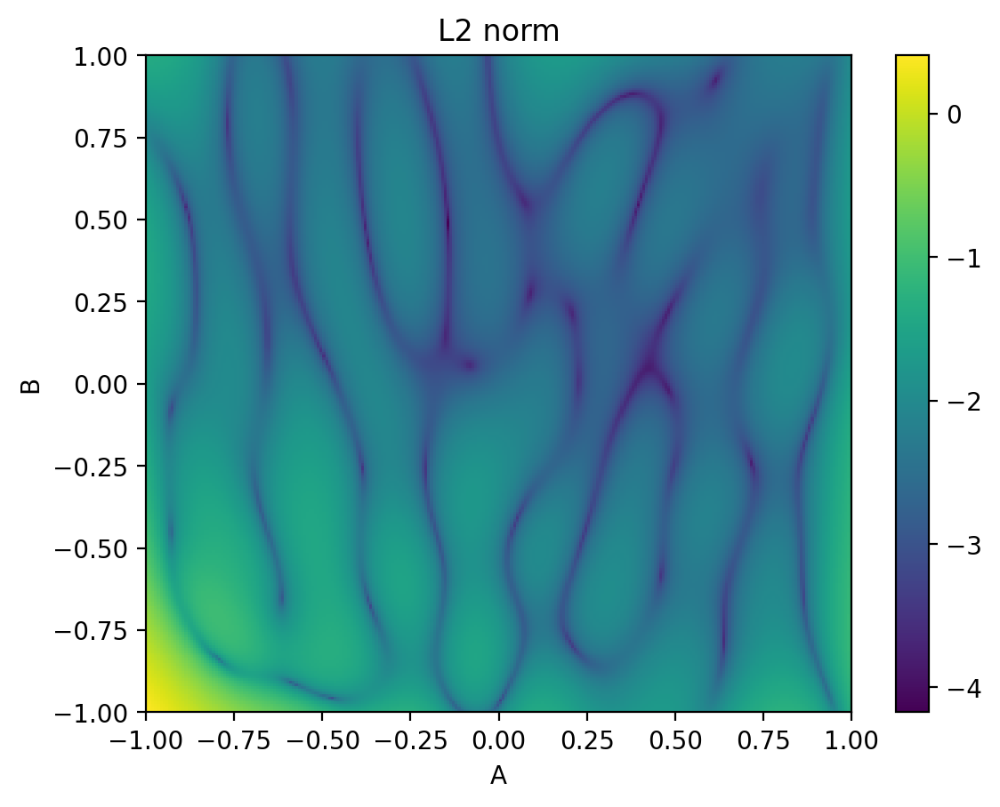

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import griddata

x = np.linspace(-1, 1, 256)
t = np.linspace(-1, 1, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
#make_X(X_star)

#prediction(L2(A,B))
#model.predict(X_star)
#np.linalg.norm(model.predict(X_star) - func(X_star), ord=2)
#prediction = model.predict(X_star, operator=None)
#prediction=l2_grid_reload_big_ab
prediction = log_grid_10



v = griddata(X_star, prediction[:, 0], (X, T), method='cubic')

fig, ax = plt.subplots()
ax.set_title("L2 norm")
ax.set_ylabel("B")
ax.set_xlabel("A")
ax.imshow(
    v.T,
    interpolation="nearest",
    cmap="viridis",
    extent=[-1, 1, -1, 1],
    origin="lower",
    aspect="auto",
)
#ax.set(xlim=(0, 1.1), xticks=np.arange(0, 1.0, step=0.2),
#        ylim=(0, 1.1), yticks=np.arange(0, 1.0, step=0.2))
fig.colorbar(plt.cm.ScalarMappable(matplotlib.colors.Normalize(log_grid_10.min(),log_grid_10.max()), cmap="viridis"), ax=ax)
#fig.colorbar(im, ax=axs[3])
#plt.axes().set_aspect('equal')
plt.show()

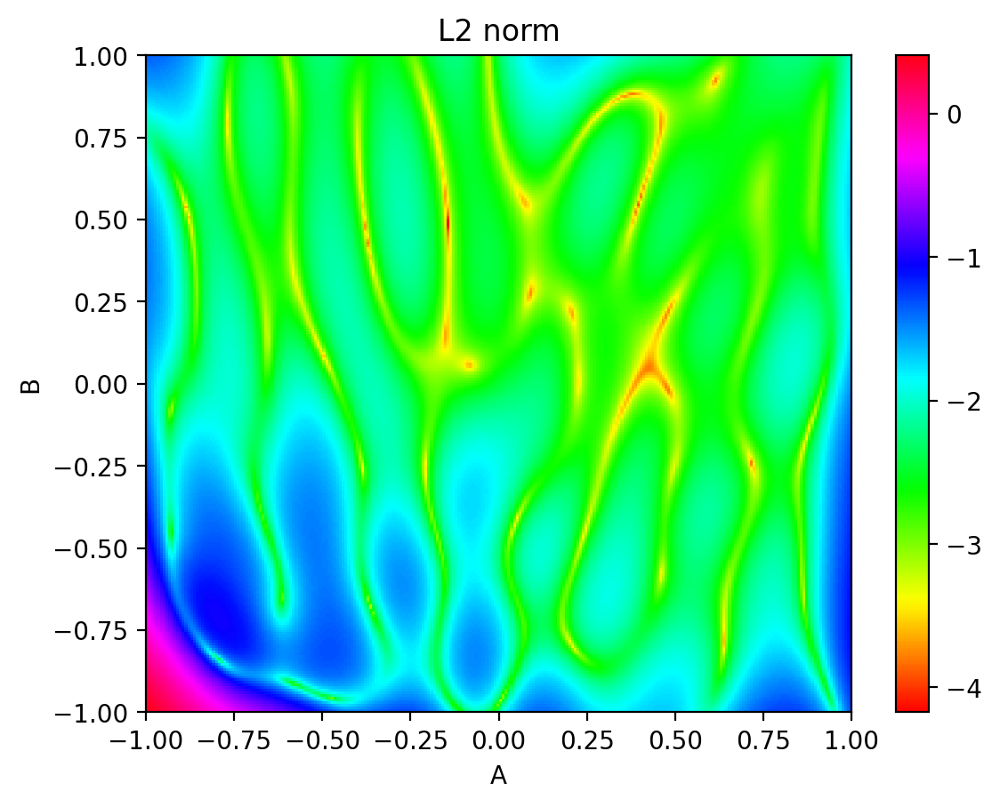

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import griddata

x = np.linspace(-1, 1, 256)
t = np.linspace(-1, 1, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
#make_X(X_star)

#prediction(L2(A,B))
#model.predict(X_star)
#np.linalg.norm(model.predict(X_star) - func(X_star), ord=2)
#prediction = model.predict(X_star, operator=None)
#prediction=l2_grid_reload_big_ab
prediction = log_grid_10



v = griddata(X_star, prediction[:, 0], (X, T), method='cubic')

fig, ax = plt.subplots()
ax.set_title("L2 norm")
ax.set_ylabel("B")
ax.set_xlabel("A")
ax.imshow(
    v.T,
    interpolation="nearest",
    cmap="hsv",
    extent=[-1, 1, -1, 1],
    origin="lower",
    aspect="auto",
)
#ax.set(xlim=(0, 1.1), xticks=np.arange(0, 1.0, step=0.2),
#        ylim=(0, 1.1), yticks=np.arange(0, 1.0, step=0.2))
fig.colorbar(plt.cm.ScalarMappable(matplotlib.colors.Normalize(log_grid_10.min(),log_grid_10.max()), cmap="hsv"), ax=ax)#"viridis"
#fig.colorbar(im, ax=axs[3])
#plt.axes().set_aspect('equal')
plt.show()

##Extrapolando os resultados

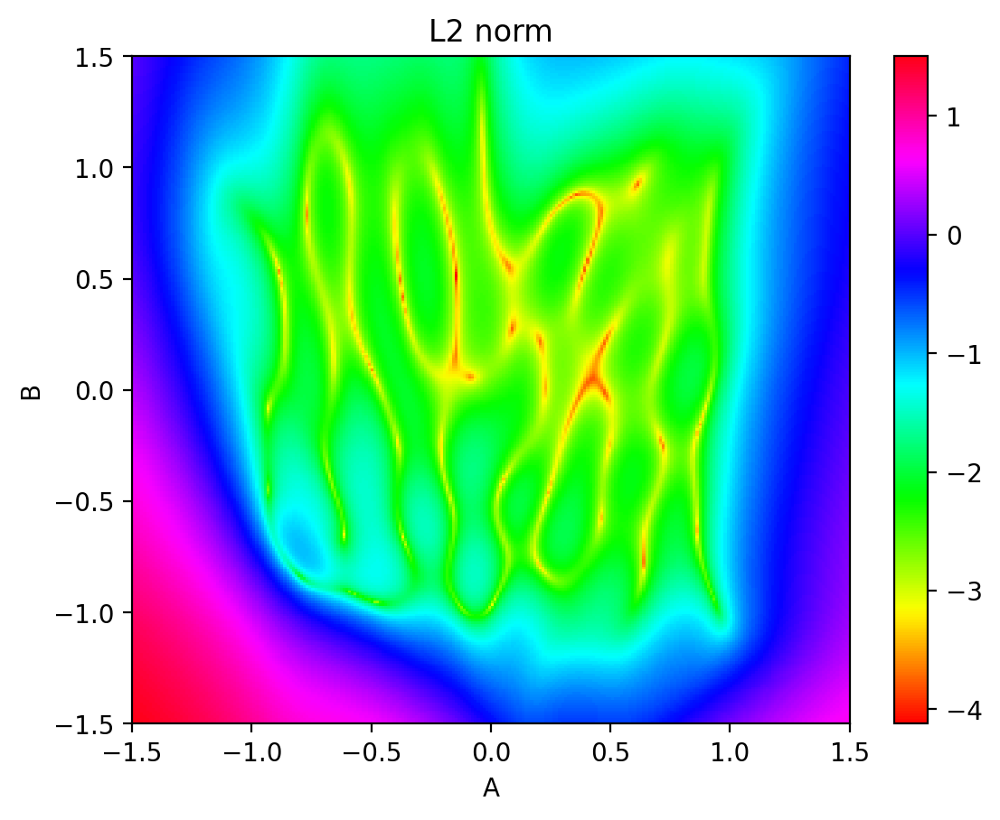

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import griddata

x = np.linspace(-1.5, 1.5, 256)
t = np.linspace(-1.5, 1.5, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
#make_X(X_star)

#prediction(L2(A,B))
#model.predict(X_star)
#np.linalg.norm(model.predict(X_star) - func(X_star), ord=2)
#prediction = model.predict(X_star, operator=None)
#prediction=l2_grid_reload_big_ab
prediction = log_l2_grid_reload_big_ab_extrapolation



v = griddata(X_star, prediction[:, 0], (X, T), method='cubic')

fig, ax = plt.subplots()
ax.set_title("L2 norm")
ax.set_ylabel("B")
ax.set_xlabel("A")
ax.imshow(
    v.T,
    interpolation="nearest",
    cmap="hsv",
    extent=[-1.5, 1.5, -1.5, 1.5],
    origin="lower",
    aspect="auto",
)
#ax.set(xlim=(0, 1.1), xticks=np.arange(0, 1.0, step=0.2),
#        ylim=(0, 1.1), yticks=np.arange(0, 1.0, step=0.2))
fig.colorbar(plt.cm.ScalarMappable(matplotlib.colors.Normalize(log_l2_grid_reload_big_ab_extrapolation.min(),log_l2_grid_reload_big_ab_extrapolation.max()), cmap="hsv"), ax=ax)#"viridis"
#fig.colorbar(im, ax=axs[3])
#plt.axes().set_aspect('equal')
plt.show()

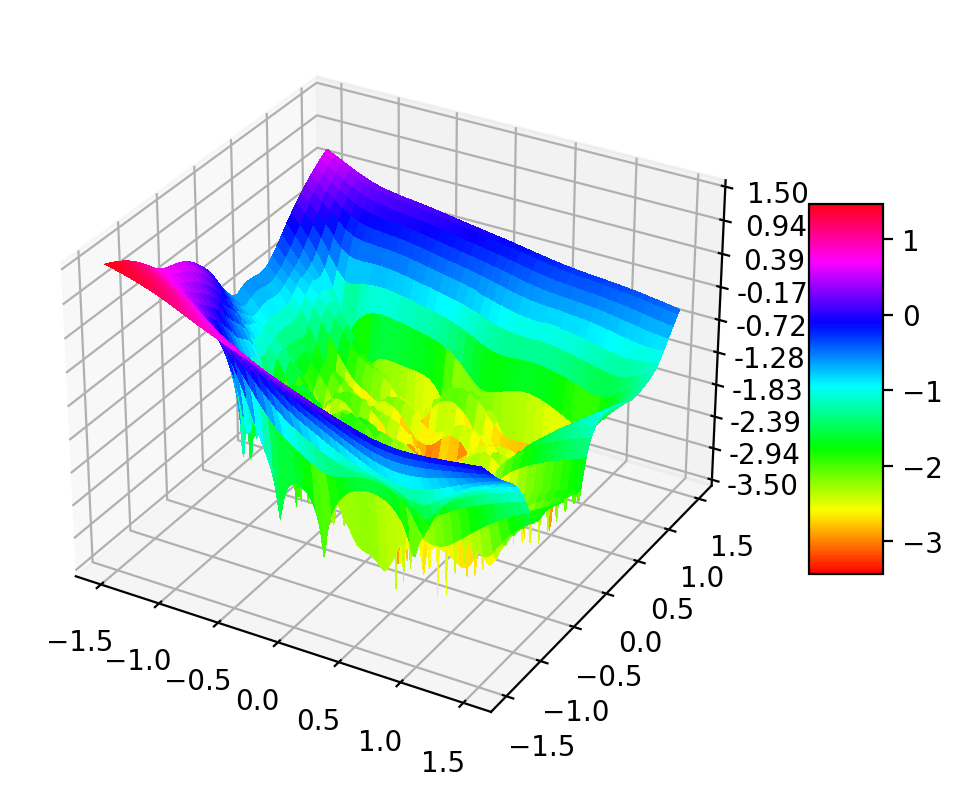

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator
import numpy as np

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

# Make data.
X = np.linspace(-1.5, 1.5, 256)
Y = np.linspace(-1.5, 1.5, 256)
#X = np.arange(-5, 5, 0.25)
#Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(X, Y)
#R = np.sqrt(X**2 + Y**2)
#Z=log_l2_grid_reload_big_ab_extrapolation
Z=reshaped_Z
#Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.hsv,#coolwarm
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-3.5, 1.5)
ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()


In [ ]:
reshaped_Z=Z.reshape(256,256)

In [ ]:
print(np.shape(Z),np.shape(reshaped_Z))


NameError: name 'np' is not defined

#Intervalos ainda maiores de A e B

In [ ]:
import deepxde as dde
import numpy as np

def pde(x, y):
    dy_xx = dde.grad.hessian(y, x,i=2,j=2)
    dy_x = dde.grad.jacobian(y, x,j=2)
    A = x[:,0:1]
    B = x[:,1:2]
    return dy_xx + A*dy_x + B* y


def boundary_l(x, on_boundary):
    return dde.utils.isclose(x[2], 0)

#n é usado mas deixado para conferencia
def boundary_r(x, on_boundary):
    return on_boundary and dde.utils.isclose(x[0], 1)


def func(x):
    #print(x)
    A = np.complex64(x[:,0:1])
    B = np.complex64(x[:,1:2])
    t = np.complex64(x[:,2:3])

    #print(A*B*t)
    #result =np.exp(-A*t/2)*(np.cosh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t)+(A*np.sinh(1/2*np.sqrt(A**2-4*B,dtype=np.complex_)*t))/np.sqrt(A**2-4*B,dtype=np.complex_))
    #print(np.(result))
    #result = np.float64(result)
    result=np.zeros([np.shape(x)[0],1],dtype=complex)
    #print("results: ", np.shape(result),"x: ",np.shape(x),"A:", np.shape(A),"B: ",np.shape(B))
    for i in range(np.shape(x)[0]):
        if(A[i]**2 !=4*B[i]):
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+(A[i]*np.sinh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i]))/np.sqrt(A[i]**2-4*B[i]))
        else:
            result[i] = np.exp(-A[i]*t[i]/2)*(np.cosh(1/2*np.sqrt(A[i]**2-4*B[i])*t[i])+A[i]*t[i]/2)

    #print(result)



    for i in range(np.shape(result)[0]):
        if  (np.imag(result[i])!=0):
            print ("deu ruim no indice ", i)




    #print(np.argwhere(np.isnan(result)))

    return np.real(result)

def derivative_func(x, y, _):
    return dde.grad.jacobian(y, x, i=0, j=2)



def boundary(x,_):
    #if(np.isclose(x[2],0)):
    #    print("Os valores de x são: ", x)
    return np.isclose(x[2],0)

time = dde.geometry.TimeDomain(0, 1.58)
geom = dde.geometry.Rectangle([0,0],[4,4])
geomtime = dde.geometry.GeometryXTime(geom,time)
#condição de contorno "inicial"
#bc_l = dde.icbc.DirichletBC(geomtime, lambda X: 1, boundary_l)
bc_l = dde.icbc.IC(geomtime, lambda x:1,lambda _, on_initial:on_initial)
#condição de contorno "inicial" da derivada
bcd_l = dde.icbc.NeumannBC(geomtime, lambda X: 0, lambda _, on_initial:on_initial, component=0)
ic_2 = dde.icbc.OperatorBC(
    geomtime,
    lambda x, y, _: dde.grad.jacobian(y, x, i=0, j=2) - 0,
    boundary
)
#data = dde.data.TimePDE(geomtime, pde, [bc_l, ic_2], num_domain = 2048, num_boundary = 0, num_initial=64, solution=func, num_test=None, train_distribution="pseudo")
data = dde.data.TimePDE(geomtime, pde, [bc_l, ic_2], num_domain = 2048, num_boundary = 0, num_initial=64, solution=func, num_test=None)

layer_size = [3] + [200] * 4 + [1]
activation = "tanh"
initializer = "Glorot uniform"
net = dde.nn.FNN(layer_size, activation, initializer)
model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])


Compiling model...
Building feed-forward neural network...
'build' took 0.091053 s



/usr/local/lib/python3.10/dist-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.690178 s



Compiling model...
'compile' took 1.315276 s

Training model...

Step      Train loss                        Test loss                         Test metric   
0         [2.99e-01, 1.28e+00, 8.14e-03]    [2.99e-01, 1.28e+00, 8.14e-03]    [1.23e+00]    
Epoch 1: train loss improved from inf to 1.59e+00, saving model to /content/drive/MyDrive/trained_models_personal/model_00-44.ckpt-1.ckpt ...

1000      [6.48e-03, 1.44e-03, 4.24e-04]    [6.48e-03, 1.44e-03, 4.24e-04]    [4.97e-02]    
Epoch 1000: train loss improved from 1.59e+00 to 8.35e-03, saving model to /content/drive/MyDrive/trained_models_personal/model_00-44.ckpt-1000.ckpt ...

2000      [7.34e-04, 1.01e-04, 6.62e-05]    [7.34e-04, 1.01e-04, 6.62e-05]    [1.83e-02]    
Epoch 2000: train loss improved from 8.35e-03 to 9.01e-04, saving model to /content/drive/MyDrive/trained_models_personal/model_00-44.ckpt-2000.ckpt ...

3000      [3.10e-04, 4.13e-05, 6.48e-05]    [3.10e-04, 4.13e-05, 6.48e-05]    [1.38e-02]    
Epoch 3000: train l

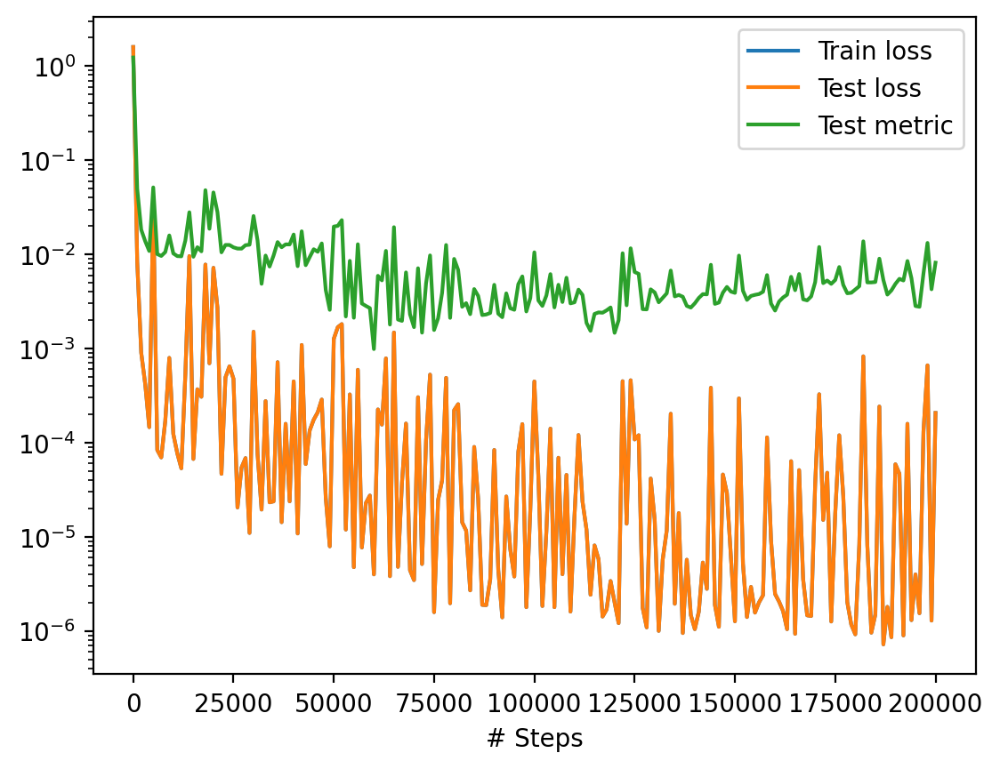

In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
checkpointer = dde.callbacks.ModelCheckpoint("/content/drive/MyDrive/trained_models_personal/model_00-44.ckpt", verbose=1, save_better_only=True)
losshistory, train_state = model.train(iterations=200000, callbacks=[checkpointer])
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

In [ ]:
model.compile("adam", lr=0.001, metrics=["l2 relative error"])
model.restore("/content/drive/MyDrive/trained_models_personal/model_00-44.ckpt-121000.ckpt")

Compiling model...
'compile' took 0.821246 s



A:  [1.2] B:  [2.5] L2:  0.0032355207081800155 



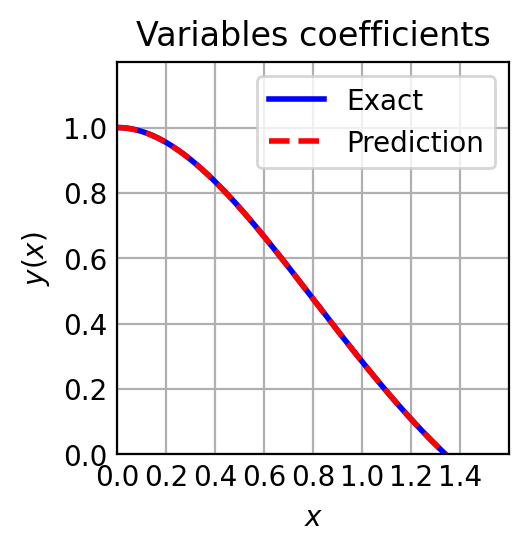

In [ ]:
plot_results(np.array([1.2,2.5]))

In [ ]:
    def make_X(A,B):
        A = A* np.ones([256,1])
        B = B*np.ones([256,1])
        t = np.linspace(0,1.58,256)
        t= np.vstack(t)
        X = np.concatenate((A, B, t), axis=1)
        return X
    #esta função calcula a cada par de coordenadas A,B, a norma L2
    def make_X_array(X):
        l2=np.zeros([X.shape[0],1])
        for i in range (X.shape[0]):
            A=X[i,0:1]
            B=X[i,1:2]

            A = A* np.ones([256,1])
            B = B*np.ones([256,1])
            t = np.linspace(0,1.58,256)
            t= np.vstack(t)
            Xi = np.concatenate((A, B, t), axis=1)

            l2[i]=np.linalg.norm(model.predict(Xi) - func(Xi), ord=2)

        return l2





In [ ]:
x = np.linspace(0, 4, 256)
t = np.linspace(0, 4, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))

In [ ]:
#l2_grid = make_X_array(X_star)

In [ ]:
#np.save("/content/drive/MyDrive/l2_00-44", l2_grid)

In [ ]:
l2_grid_0044 = np.load("/content/drive/MyDrive/l2_00-44.npy")

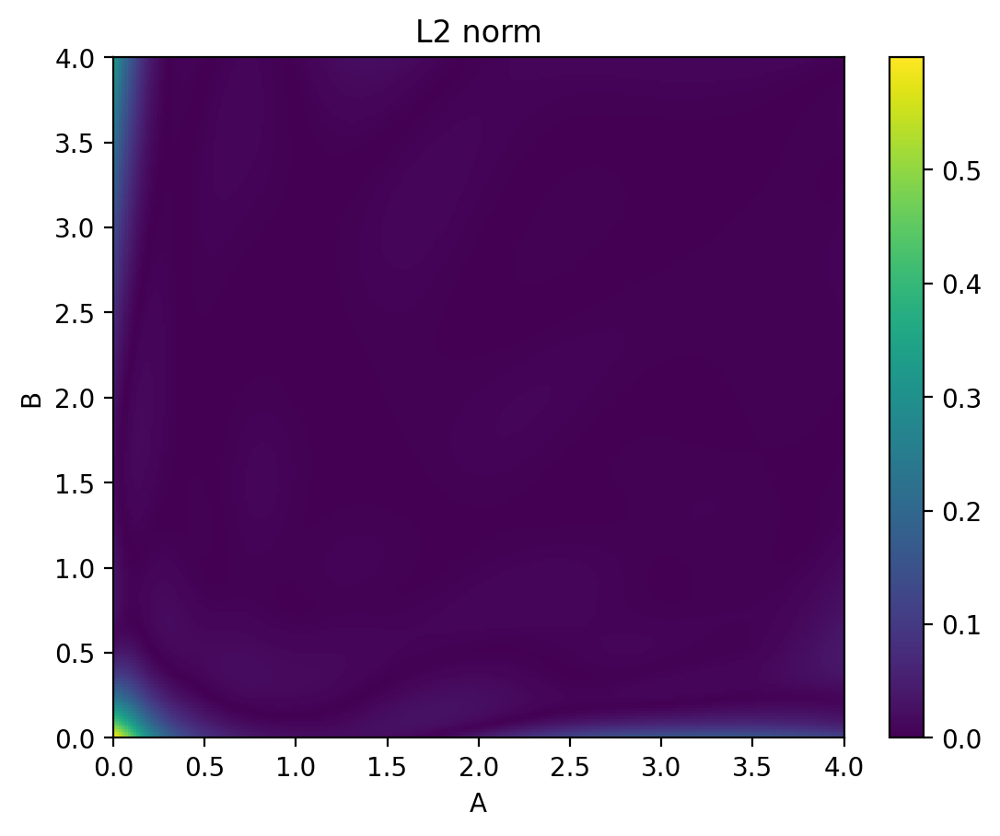

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import griddata

x = np.linspace(0, 4, 256)
t = np.linspace(0, 4, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
#make_X(X_star)

#prediction(L2(A,B))
#model.predict(X_star)
#np.linalg.norm(model.predict(X_star) - func(X_star), ord=2)
#prediction = model.predict(X_star, operator=None)
#prediction=l2_grid_reload_big_ab
prediction = l2_grid_0044



v = griddata(X_star, prediction[:, 0], (X, T), method='cubic')

fig, ax = plt.subplots()
ax.set_title("L2 norm")
ax.set_ylabel("B")
ax.set_xlabel("A")
ax.imshow(
    v.T,
    interpolation="nearest",
    cmap="viridis",
    extent=[0, 4, 0, 4],
    origin="lower",
    aspect="auto",
)
#ax.set(xlim=(0, 1.1), xticks=np.arange(0, 1.0, step=0.2),
#        ylim=(0, 1.1), yticks=np.arange(0, 1.0, step=0.2))
fig.colorbar(plt.cm.ScalarMappable(matplotlib.colors.Normalize(0,l2_grid_0044.max()), cmap="viridis"), ax=ax)
#fig.colorbar(im, ax=axs[3])
#plt.axes().set_aspect('equal')
plt.show()

In [ ]:
log_grid_10_0044=np.log10(l2_grid_0044)

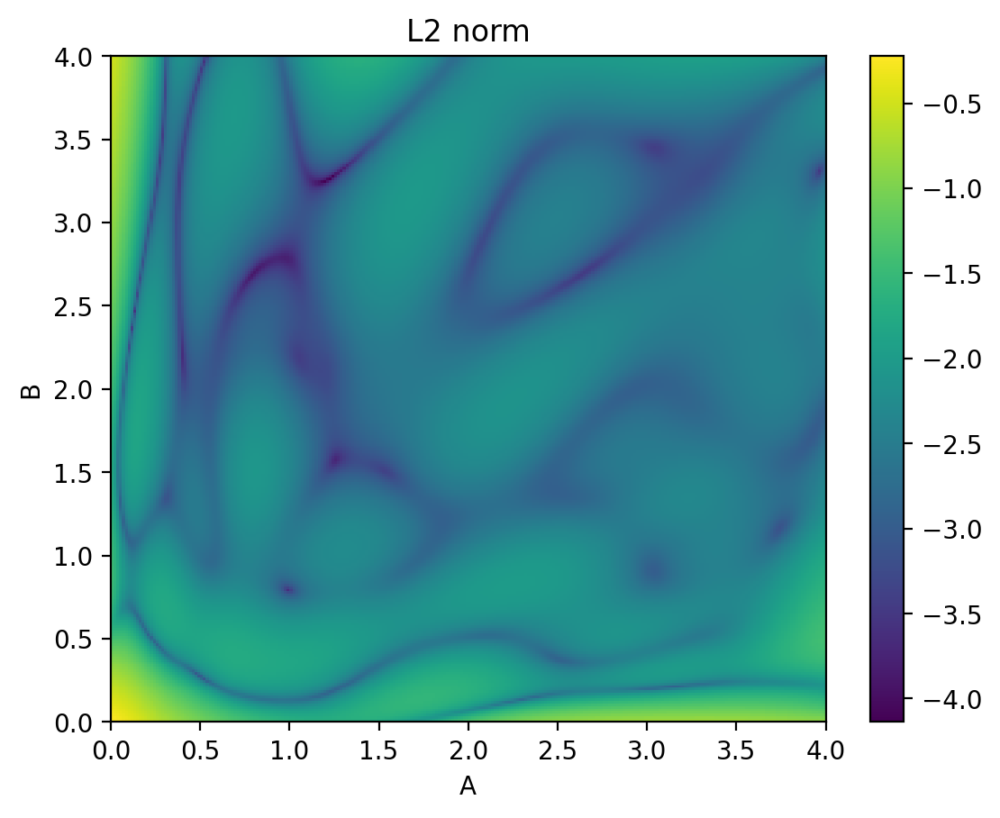

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import griddata

x = np.linspace(0, 4, 256)
t = np.linspace(0, 4, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
#make_X(X_star)

#prediction(L2(A,B))
#model.predict(X_star)
#np.linalg.norm(model.predict(X_star) - func(X_star), ord=2)
#prediction = model.predict(X_star, operator=None)
#prediction=l2_grid_reload_big_ab
prediction = log_grid_10_0044



v = griddata(X_star, prediction[:, 0], (X, T), method='cubic')

fig, ax = plt.subplots()
ax.set_title("L2 norm")
ax.set_ylabel("B")
ax.set_xlabel("A")
ax.imshow(
    v.T,
    interpolation="nearest",
    cmap="viridis",
    extent=[0, 4, 0, 4],
    origin="lower",
    aspect="auto",
)
#ax.set(xlim=(0, 1.1), xticks=np.arange(0, 1.0, step=0.2),
#        ylim=(0, 1.1), yticks=np.arange(0, 1.0, step=0.2))
fig.colorbar(plt.cm.ScalarMappable(matplotlib.colors.Normalize(log_grid_10_0044.min(),log_grid_10_0044.max()), cmap="viridis"), ax=ax)
#fig.colorbar(im, ax=axs[3])
#plt.axes().set_aspect('equal')
plt.show()

hsv

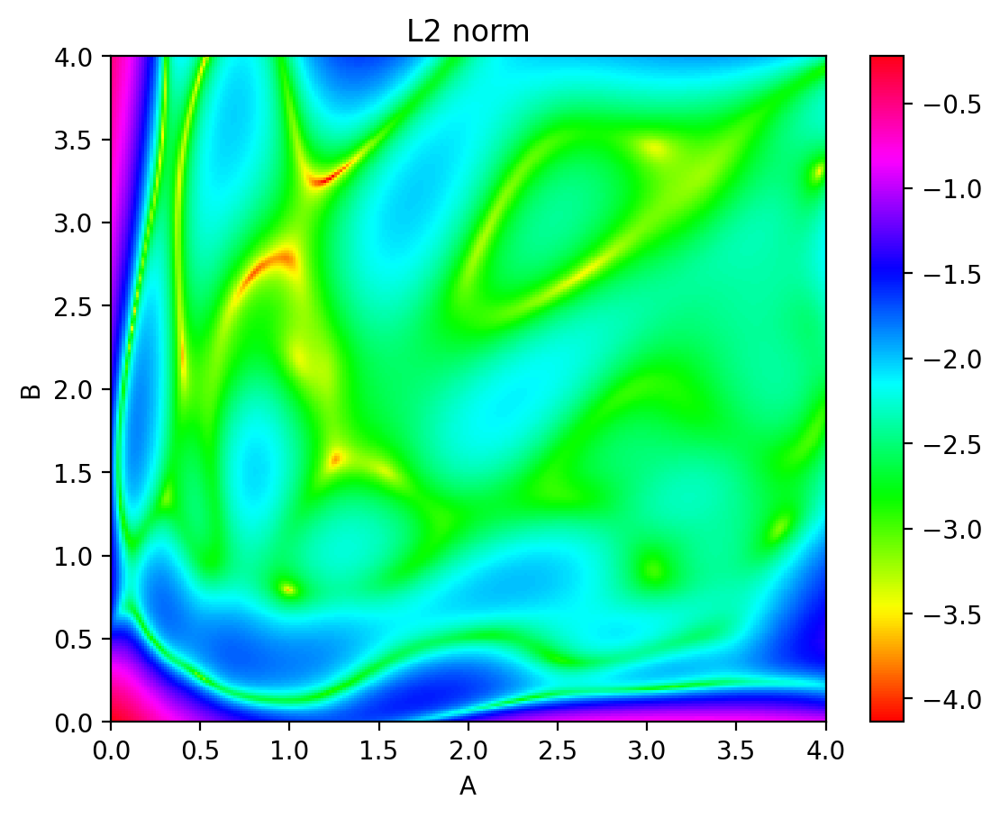

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
from scipy.interpolate import griddata

x = np.linspace(0, 4, 256)
t = np.linspace(0, 4, 256)
X, T = np.meshgrid(x, t)

X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
#make_X(X_star)

#prediction(L2(A,B))
#model.predict(X_star)
#np.linalg.norm(model.predict(X_star) - func(X_star), ord=2)
#prediction = model.predict(X_star, operator=None)
#prediction=l2_grid_reload_big_ab
prediction = log_grid_10_0044



v = griddata(X_star, prediction[:, 0], (X, T), method='cubic')

fig, ax = plt.subplots()
ax.set_title("L2 norm")
ax.set_ylabel("B")
ax.set_xlabel("A")
ax.imshow(
    v.T,
    interpolation="nearest",
    cmap="hsv",
    extent=[0, 4, 0, 4],
    origin="lower",
    aspect="auto",
)
#ax.set(xlim=(0, 1.1), xticks=np.arange(0, 1.0, step=0.2),
#        ylim=(0, 1.1), yticks=np.arange(0, 1.0, step=0.2))
fig.colorbar(plt.cm.ScalarMappable(matplotlib.colors.Normalize(log_grid_10_0044.min(),log_grid_10_0044.max()), cmap="hsv"), ax=ax)
#fig.colorbar(im, ax=axs[3])
#plt.axes().set_aspect('equal')
plt.show()